# Lib Installation

In [4]:
!pip install lightning pytorch-lightning torchvision tqdm python-dotenv PyYAML wilds timm


In [5]:
# Cell 1: Install required libs (run in a cell)
!pip install lightning pytorch-lightning torchvision tqdm python-dotenv PyYAML wilds torchmetrics timm


# Config

In [7]:
config = {
    "algo": "FOND",
    "dataset": ["PACS", "VLCS", "OfficeHome", "Wilds"],  # Options: VLCS, PACS
    "test_set_id": 0,  # 0, 1, 2, or 3
    # Paths
    
    "data_dir": {"PACS":"/kaggle/input/pacs-dataset/kfold", "VLCS": "/kaggle/input/vlcsdataset/", "OfficeHome": "/kaggle/input/officehome/OfficeHome/", "Wilds": ""},
    "log_dir": "./logs",
    # Training settings
    "n_epochs": 5001,  # Converted from 5001 steps (~15 epochs at 32 batch size)
    "checkpoint_freq": 300,  # Evaluate every epoch (was 300 steps)
    "holdout_fraction": 0.2,
    # Model checkpointing
    "model_checkpoint": {
        "metric": "val/oacc",
        "maximize": True
    },
    # Seeds
    "overall_seed": 1,
    "trial_id": 0,
    "hparam_id": 0,  # 0=default hparams, 1-4=random variants
    # System
    "num_workers": 4,
    # Dataset config (from sweep)
    "overlap": "high",  # Must match PACS.OVERLAP_CONFIG keys
    "num_classes": None,
    "num_domain_linked_classes": None,
    # AutoFOND specific (disabled for baseline)
    "auto_augment": False,
    "augment_search_epochs": 5,
    "augment_policy_size": 5,
    "augment_num_policies": 3,
    # Teacher paths (empty for regular FOND)
    "teacher_paths": {}
}

# Imports

In [8]:
import math
from typing import List, Any, Dict, Optional, Callable, Tuple
import argparse
import logging
import hashlib
import numpy as np
from collections import Counter
import collections
import time
from datetime import datetime
import lightning as L
from tqdm import tqdm
import csv
import json
from pathlib import Path
import os
import torch
import torchmetrics
import torchvision.datasets.folder
from PIL import Image, ImageFile
from torch.utils.data import ConcatDataset, Dataset, Subset, TensorDataset
from torchvision import transforms
from torchvision.datasets import MNIST, ImageFolder
from torchvision.transforms.functional import rotate
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models
from wilds.datasets.camelyon17_dataset import Camelyon17Dataset

# --- Added for ConvNeXt ---
import timm


/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

# SRC

## Domain Creation

In [10]:



def create_domains(
    num_classes: int, num_linked: int, num_train_domains: int
) -> List[List[int]]:
    """
    Determine and distribute domain-linked and domain-shared classes.
    Domain-linked classes will come from the same domain, i.e., idx=0.
    Domain-shared classes will exist in each of the remaining domains

    Args:
        num_classes: number of overall classes within all the domains
        num_linked: number of classes that are linked to an individual domain
        num_train_domains: number of different training domains
    """
    assert num_linked <= num_classes
    domain_shared = [i for i in range(num_linked, num_classes)]
    domain_linked = [i for i in range(num_linked)]
    logging.info(f"Domain-shared classes: {domain_shared}")
    logging.info(f"Domain-linked classes: {domain_linked}")
    # domains = [domain_shared.copy() for i in range(num_train_domains)]
    domains = [[] for i in range(num_train_domains)]

    # first domain is domain-linked only
    domains[0] = domain_linked
    # other domains contain domain-shared only
    domains[1:] = [domain_shared.copy() for i in range(1, num_train_domains)]

    logging.info(f"domains[0]: {domains[0]}")
    logging.info(f"domains[1:]: {domains[1:]}")

    return domains


def create_domains_1(
    num_classes: int, num_linked: int, num_domains: int
) -> List[List[int]]:
    """
    Args:
        num_classes: number of overall classes within all the domains
        num_linked: number of classes that are linked to an individual domain
        num_domains: number of different domains, including test domain
    """
    assert num_linked < num_classes
    domain_shared = [i for i in range(num_linked, num_classes)]
    print(f"Shared classes: {domain_shared}")
    num_train_domains = num_domains - 1
    domains = [domain_shared.copy() for i in range(num_train_domains)]

    for class_idx in range(num_linked):
        domain_idx = class_idx % num_train_domains
        domains[domain_idx].append(class_idx)
    return domains


def create_domains_2(
    num_classes: int, num_linked_ratio: float, num_domains: int
) -> List[List[int]]:
    """
    Args:
        num_classes: number of overall classes within all the domains
        num_linked_ratio: ratio of linked classes to the total number of classes
        num_domains: number of different domains, including test domain
    """
    num_linked = math.floor(num_linked_ratio * num_classes)
    return create_domains_1(num_classes, num_linked, num_domains)



# Testing
create_domains(num_classes=10, num_linked=5, num_train_domains=3)
# Testing domain linked only
create_domains(num_classes=10, num_linked=10, num_train_domains=3)

# Testing same classes with different overlap
domains = create_domains_1(num_classes=10, num_linked=3, num_domains=4)
print(domains)
domains = create_domains_1(num_classes=10, num_linked=5, num_domains=4)
print(domains)

# Testing different classes with same overlap percentage
domains = create_domains_2(num_classes=10, num_linked_ratio=0.2, num_domains=4)
print(domains)
domains = create_domains_2(num_classes=5, num_linked_ratio=0.2, num_domains=4)
print(domains)


Shared classes: [3, 4, 5, 6, 7, 8, 9]
[[3, 4, 5, 6, 7, 8, 9, 0], [3, 4, 5, 6, 7, 8, 9, 1], [3, 4, 5, 6, 7, 8, 9, 2]]
Shared classes: [5, 6, 7, 8, 9]
[[5, 6, 7, 8, 9, 0, 3], [5, 6, 7, 8, 9, 1, 4], [5, 6, 7, 8, 9, 2]]
Shared classes: [2, 3, 4, 5, 6, 7, 8, 9]
[[2, 3, 4, 5, 6, 7, 8, 9, 0], [2, 3, 4, 5, 6, 7, 8, 9, 1], [2, 3, 4, 5, 6, 7, 8, 9]]
Shared classes: [1, 2, 3, 4]
[[1, 2, 3, 4, 0], [1, 2, 3, 4], [1, 2, 3, 4]]


## Hparams

In [12]:
"""
Hyper-parameter registry
"""

def seed_hash(*args):
    """
    Derive an integer hash from all args, for use as a random seed.
    """
    args_str = str(args)
    return int(hashlib.md5(args_str.encode("utf-8")).hexdigest(), 16) % (2**31)


def _define_hparam(hparams, hparam_name, default_val, random_val_fn):
    hparams[hparam_name] = (hparams, hparam_name, default_val, random_val_fn)


def _hparams(algorithm, dataset, random_seed):
    """
    Global registry of hyperparams. Each entry is a (default, random) tuple.
    New algorithms / networks / etc. should add entries here.
    """
    SMALL_IMAGES = ["Debug28", "RotatedMNIST", "ColoredMNIST"]

    hparams = {}

    def _hparam(name, default_val, random_val_fn):
        """Define a hyperparameter. random_val_fn takes a RandomState and
        returns a random hyperparameter value."""
        assert name not in hparams
        random_state = np.random.RandomState(seed_hash(random_seed, name))
        hparams[name] = (default_val, random_val_fn(random_state))

    # Unconditional hparam definitions.
    _hparam("data_augmentation", True, lambda r: True)
    
    # Backbone options
    _hparam("resnet18", False, lambda r: False)  # Set False because we'll use ConvNeXt
    _hparam("use_convnext", True, lambda r: True)  # NEW: ConvNeXt flag
    _hparam("resnet_dropout", 0.0, lambda r: r.choice([0.0, 0.1, 0.5]))
    
    _hparam("class_balanced", False, lambda r: False)
    _hparam("nonlinear_classifier", False, lambda r: False)

    # Algorithm-specific hparam definitions
    if algorithm in ["FOND", "FOND_NC", "FOND_N", "NOC"]:
        _hparam("temperature", 0.07, lambda r: 0.07 * r.uniform(0.75, 1.25))
        _hparam("base_temperature", 0.07, lambda r: 0.07)
        _hparam("xdom_lmbd", 1, lambda r: 10 ** r.uniform(-1, 3))
        _hparam("error_lmbd", 1, lambda r: 10 ** r.uniform(-1, 3))
        _hparam("xda_alpha", 1, lambda r: 10 ** r.uniform(0, 1))
        _hparam("xda_beta", 1, lambda r: 10 ** r.uniform(0, 1))
    elif algorithm in [
        "FOND_Distillation_Separate_Projector",
        "FOND_Distillation_Teacher_Projector",
        "FOND_Distillation_Student_Projector",
    ]:
        _hparam("temperature", 0.07, lambda r: 0.07 * r.uniform(0.75, 1.25))
        _hparam("base_temperature", 0.07, lambda r: 0.07)
        _hparam("xdom_lmbd", 1, lambda r: 10 ** r.uniform(-1, 3))
        _hparam("error_lmbd", 1, lambda r: 10 ** r.uniform(-1, 3))
        _hparam("xda_alpha", 1, lambda r: 10 ** r.uniform(0, 1))
        _hparam("xda_beta", 1, lambda r: 10 ** r.uniform(0, 1))
        _hparam("distillation_temperature", 1, lambda r: r.uniform(1, 20))

    # Dataset-specific hyperparams
    if dataset in SMALL_IMAGES:
        _hparam("lr", 1e-3, lambda r: 10 ** r.uniform(-4.5, -2.5))
        _hparam("weight_decay", 0.0, lambda r: 0.0)
        _hparam("batch_size", 64, lambda r: int(2 ** r.uniform(3, 9)))
    else:
        _hparam("lr", 5e-5, lambda r: 10 ** r.uniform(-5, -3.5))
        _hparam("weight_decay", 0.0, lambda r: 10 ** r.uniform(-6, -2))
        if algorithm == "ARM":
            _hparam("batch_size", 8, lambda r: 8)
        elif dataset == "DomainNet":
            _hparam("batch_size", 32, lambda r: int(2 ** r.uniform(3, 5)))
        else:
            _hparam("batch_size", 32, lambda r: int(2 ** r.uniform(3, 5.5)))

    return hparams


def default_hparams(algorithm, dataset):
    return {a: b for a, (b, c) in _hparams(algorithm, dataset, 0).items()}


def random_hparams(algorithm, dataset, seed):
    return {a: c for a, (b, c) in _hparams(algorithm, dataset, seed).items()}


## Misc

In [13]:

class _SplitDataset(torch.utils.data.Dataset):
    """Used by split_dataset"""

    def __init__(self, underlying_dataset, keys):
        super(_SplitDataset, self).__init__()
        self.underlying_dataset = underlying_dataset
        self.keys = keys

    def __getitem__(self, key):
        return self.underlying_dataset[self.keys[key]]

    def __len__(self):
        return len(self.keys)


def split_dataset(dataset, n, seed=0):
    """
    Return a pair of datasets corresponding to a random split of the given
    dataset, with n datapoints in the first dataset and the rest in the last,
    using the given random seed
    """
    assert n <= len(dataset)
    keys = list(range(len(dataset)))
    np.random.RandomState(seed).shuffle(keys)
    keys_1 = keys[:n]
    keys_2 = keys[n:]
    return _SplitDataset(dataset, keys_1), _SplitDataset(dataset, keys_2)


def seed_hash(*args):
    """
    Derive an integer hash from all args, for use as a random seed.
    """
    args_str = str(args)
    return int(hashlib.md5(args_str.encode("utf-8")).hexdigest(), 16) % (2**31)


def make_weights_for_balanced_classes(dataset):
    counts = Counter()
    classes = []
    for _, y in dataset:
        y = int(y)
        counts[y] += 1
        classes.append(y)

    n_classes = len(counts)

    weight_per_class = {}
    for y in counts:
        weight_per_class[y] = 1 / (counts[y] * n_classes)

    weights = torch.zeros(len(dataset))
    for i, y in enumerate(classes):
        weights[i] = weight_per_class[int(y)]

    return weights
def compute_loss(network, loader, device):
    """
    Compute average loss for a given loader.
    Returns: average loss value
    """
    total_loss = 0.0
    num_batches = 0
    
    network.eval()
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device)
            y = y.to(device)
            p = network.predict(x)
            
            # Compute loss
            loss = torch.nn.functional.cross_entropy(p, y, reduction='mean')
            total_loss += loss.item()
            num_batches += 1
    
    network.train()
    
    avg_loss = total_loss / num_batches if num_batches > 0 else 0.0
    return avg_loss

def accuracy(network, loader, weights, device, dataset):
    correct = 0
    total = 0
    weights_offset = 0
    overlapping_classes = dataset.overlapping_classes
    num_classes = dataset.num_classes
    
    f1_score = torchmetrics.F1Score(
        task="multiclass", num_classes=num_classes, average="macro"
    ).to(device)
    per_class_accuracy = torchmetrics.Accuracy(
        task="multiclass",
        num_classes=num_classes,
        average=None,
    ).to(device)
    accuracy = torchmetrics.Accuracy(
        task="multiclass",
        num_classes=num_classes,
        average="macro",
    ).to(device)
    recall = torchmetrics.Recall(
        task="multiclass",
        num_classes=num_classes,
        average="macro",
    ).to(device)
    precision = torchmetrics.Precision(
        task='multiclass',  # ✅ Fixed typo
        num_classes=num_classes,
        average='macro'
    ).to(device)
    conf_mat = torchmetrics.ConfusionMatrix(
        task="multiclass",
        num_classes=num_classes
    ).to(device)  # ✅ Added .to(device)
    
    network.eval()
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device)
            y = y.to(device)
            p = network.predict(x)
            
            if weights is None:
                batch_weights = torch.ones(len(x))
            else:
                batch_weights = weights[weights_offset : weights_offset + len(x)]
                weights_offset += len(x)
            batch_weights = batch_weights.to(device)
            
            if p.size(1) == 1:
                correct += (
                    (p.gt(0).eq(y).float() * batch_weights.view(-1, 1)).sum().item()
                )
            else:
                correct += (p.argmax(1).eq(y).float() * batch_weights).sum().item()
            total += batch_weights.sum().item()
            
            # update metrics
            accuracy.update(p, y)
            recall.update(p, y)
            precision.update(p, y)
            f1_score.update(p, y)
            per_class_accuracy.update(p, y)
            conf_mat.update(p, y)
    
    network.train()
    compute_acc = accuracy.compute().item()
    compute_recall = recall.compute().item()
    compute_precision = precision.compute().item()  # ✅ Fixed typo
    compute_f1 = f1_score.compute().item()
    compute_per_class_acc = per_class_accuracy.compute().cpu().numpy()
    cm_compute = conf_mat.compute().cpu().numpy()  # ✅ Convert to numpy
    
    overlap_class_acc = []
    non_overlap_class_acc = []
    per_class_acc_dict = {}
    for i in range(num_classes):
        per_class_acc_dict[i] = float(compute_per_class_acc[i])
        if i in overlapping_classes:
            overlap_class_acc.append(compute_per_class_acc[i])
        else:
            non_overlap_class_acc.append(compute_per_class_acc[i])
    
    if len(non_overlap_class_acc) == 0:
        non_overlap_class_acc = -1
    else:
        non_overlap_class_acc = np.mean(non_overlap_class_acc)
    if len(overlap_class_acc) == 0:
        overlap_class_acc = -1
    else:
        overlap_class_acc = np.mean(overlap_class_acc)
    
    other_acc = correct / total
    
    return (
        float(compute_acc),
        float(compute_recall),
        float(compute_f1),
        float(compute_precision),      # ✅ Moved before oacc/nacc
        float(overlap_class_acc),
        float(non_overlap_class_acc),
        per_class_acc_dict,
        cm_compute
    )
class _InfiniteSampler(torch.utils.data.Sampler):
    """Wraps another Sampler to yield an infinite stream."""

    def __init__(self, sampler):
        self.sampler = sampler

    def __iter__(self):
        while True:
            for batch in self.sampler:
                yield batch


class InfiniteDataLoader:
    def __init__(self, dataset, weights, batch_size, num_workers):
        super().__init__()

        if weights is not None:
            sampler = torch.utils.data.WeightedRandomSampler(
                weights, replacement=True, num_samples=batch_size
            )
        else:
            sampler = torch.utils.data.RandomSampler(dataset, replacement=True)

        if weights == None:
            weights = torch.ones(len(dataset))

        batch_sampler = torch.utils.data.BatchSampler(
            sampler, batch_size=batch_size, drop_last=True
        )

        self._infinite_iterator = iter(
            torch.utils.data.DataLoader(
                dataset,
                num_workers=num_workers,
                batch_sampler=_InfiniteSampler(batch_sampler),
            )
        )

    def __iter__(self):
        while True:
            yield next(self._infinite_iterator)

    def __len__(self):
        raise ValueError


class FastDataLoader:
    """DataLoader wrapper with slightly improved speed by not respawning worker
    processes at every epoch."""

    def __init__(self, dataset, batch_size, num_workers):
        super().__init__()

        batch_sampler = torch.utils.data.BatchSampler(
            torch.utils.data.RandomSampler(dataset, replacement=False),
            batch_size=batch_size,
            drop_last=False,
        )

        self._infinite_iterator = iter(
            torch.utils.data.DataLoader(
                dataset,
                num_workers=num_workers,
                batch_sampler=_InfiniteSampler(batch_sampler),
            )
        )

        self._length = len(batch_sampler)

    def __iter__(self):
        for _ in range(len(self)):
            yield next(self._infinite_iterator)

    def __len__(self):
        return self._length


def config_logging():
    """
    Reusable code for formatting the logger
    """
    logging.basicConfig(
        format="%(asctime)s,%(msecs)03d %(levelname)-8s [%(filename)s:%(funcName)s:%(lineno)d] %(message)s",
        datefmt="%Y-%m-%d:%H:%M:%S",
        level=logging.INFO,
    )


## Simple Logger

In [14]:
"""
Simple CSV logger to replace W&B during development
Keeps the same interface for easy swap later
"""
class CSVLogger:
    """Lightweight logger that writes metrics to CSV"""
    
    def __init__(self, csv_path: str, root_dir:str=None):
        self.csv_path = Path(csv_path)
        self.csv_path.parent.mkdir(parents=True, exist_ok=True)
        self.fieldnames = None
        self.file = None
        self.writer = None
        self._init_csv()
        self.root = root_dir if root_dir is not None else csv_path.parent
    def _init_csv(self):
        """Initialize CSV file with headers"""
        self.file = open(self.csv_path, 'w', newline='')
        self.writer = None  # Will be created on first log
    def return_root(self):
        return self.root
    def log(self, metrics: Dict[str, Any], step: Optional[int] = None):
        """
        Log metrics to CSV
        
        Args:
            metrics: Dictionary of metric_name -> value
            step: Training step (optional, will be added if provided)
        """
        if step is not None:
            metrics = {"step": step, **metrics}
            
        # Flatten nested dictionaries (e.g., {"train/acc": 0.9})
        flat_metrics = {}
        for key, value in metrics.items():
            if isinstance(value, dict):
                for subkey, subvalue in value.items():
                    flat_metrics[f"{key}/{subkey}"] = subvalue
            else:
                flat_metrics[key] = value
        
        # Initialize writer with fieldnames on first call
        if self.writer is None:
            self.fieldnames = list(flat_metrics.keys())
            self.writer = csv.DictWriter(self.file, fieldnames=self.fieldnames)
            self.writer.writeheader()
            
        # Add new fields if they appear
        new_fields = set(flat_metrics.keys()) - set(self.fieldnames)
        if new_fields:
            self.fieldnames.extend(sorted(new_fields))
            # Rewrite file with new headers
            self.file.close()
            self._rewrite_with_new_fields(flat_metrics)
            return
            
        self.writer.writerow(flat_metrics)
        self.file.flush()  # Ensure immediate write
        
    def _rewrite_with_new_fields(self, new_row: Dict[str, Any]):
        """Rewrite CSV when new fields are discovered"""
        # Read existing rows
        with open(self.csv_path, 'r') as f:
            reader = csv.DictReader(f)
            existing_rows = list(reader)
        
        # Rewrite with updated fieldnames
        self.file = open(self.csv_path, 'w', newline='')
        self.writer = csv.DictWriter(self.file, fieldnames=self.fieldnames)
        self.writer.writeheader()
        for row in existing_rows:
            self.writer.writerow(row)
        self.writer.writerow(new_row)
        self.file.flush()
        
    def save_config(self, config: Dict[str, Any], path: Optional[str] = None):
        """Save experiment config as JSON"""
        if path is None:
            path = self.csv_path.parent / "config.json"
        with open(path, 'w') as f:
            json.dump(config, f, indent=2)
            
    def close(self):
        """Close CSV file"""
        if self.file:
            self.file.close()
            
    def __enter__(self):
        return self
        
    def __exit__(self, exc_type, exc_val, exc_tb):
        self.close()


class PrintLogger:
    """Even simpler logger that just prints to console"""
    
    def log(self, metrics: Dict[str, Any], step: Optional[int] = None):
        step_str = f"[Step {step}] " if step is not None else ""
        metric_str = ", ".join(f"{k}={v:.4f}" if isinstance(v, float) else f"{k}={v}" 
                               for k, v in metrics.items())
        print(f"{step_str}{metric_str}")
        
    def save_config(self, config: Dict[str, Any], path: Optional[str] = None):
        print(f"Config: {json.dumps(config, indent=2)}")
        
    def close(self):
        pass


# DADA

In [15]:
import os, json, random, logging
import numpy as np
import torch
import torch.nn as nn

from torchvision import transforms
from torch.utils.data import DataLoader

torch.manual_seed(0)
np.random.seed(0)
random.seed(0)

# For reproducibility with ConvNeXt
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)


Device: cuda


In [16]:
class DiffGaussianNoise(nn.Module):
    def __init__(self, std=0.05):
        super().__init__()
        self.std = std

    def forward(self, x):
        if not self.training:
            return x
        noise = torch.randn_like(x) * self.std
        return x + noise


class DiffColorJitter(nn.Module):
    def __init__(self, brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1):
        super().__init__()
        self.b = brightness
        self.c = contrast
        self.s = saturation
        self.h = hue

    def forward(self, img):
        if not self.training:
            return img

        if self.b > 0:
            img = img * (1 + torch.randn(1).item() * self.b)

        if self.c > 0:
            mean = img.mean(dim=[2,3], keepdim=True)
            img = (img - mean) * (1 + torch.randn(1).item() * self.c) + mean

        if self.s > 0:
            gray = img.mean(dim=1, keepdim=True)
            img = img + (img - gray) * (1 + torch.randn(1).item() * self.s)

        if self.h > 0:
            theta = torch.randn(1).item() * self.h
            u, w = torch.cos(torch.tensor(theta)), torch.sin(torch.tensor(theta))
            rot = torch.tensor([[u, -w, 0],[w, u, 0],[0, 0, 1]], device=img.device)
            img = torch.einsum('bchw,dc->bdhw', img, rot)

        return img


class DiffHSB(nn.Module):
    def __init__(self, hue=0.05, saturation=0.2, brightness=0.2):
        super().__init__()
        self.h = hue
        self.s = saturation
        self.b = brightness

    def forward(self, x):
        if not self.training:
            return x

        x = x * (1 + torch.randn(1).item() * self.h)
        x = torch.clamp(x, 0, 1)
        return x


class DiffAugment(nn.Module):
    def __init__(self):
        super().__init__()
        self.color = DiffColorJitter()
        self.hsb = DiffHSB()
        self.gauss = DiffGaussianNoise(0.03)

    def forward(self, x):
        x = self.color(x)
        x = self.hsb(x)
        x = self.gauss(x)
        return torch.clamp(x, 0, 1)


In [17]:
class AugmentedDataset(torch.utils.data.Dataset):
    def __init__(self, base_dataset, diff_aug):
        self.base = base_dataset
        self.diff_aug = diff_aug

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        x, y = self.base[idx]
        if isinstance(x, torch.Tensor):
            x = self.diff_aug(x.unsqueeze(0)).squeeze(0)
        return x, y



In [18]:
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                         std=[0.229, 0.224, 0.225])
])

diff_augment = DiffAugment().to(device)


In [21]:
def load_dataset(name, data_dir, domains, split, auto_augment):
    """
    Load dataset and optionally apply differentiable augmentation to training set.
    """
    if name == "VLCS":
        dataset = VLCS(
            data_dir=data_dir,
            domains=domains,
            split=split,
            transform=base_transform
        )
    elif name == "PACS":
        dataset = PACS(
            data_dir=data_dir,
            domains=domains,
            split=split,
            transform=base_transform
        )
    elif name == "OfficeHome":
        dataset = OfficeHome(
            data_dir=data_dir,
            domains=domains,
            split=split,
            transform=base_transform
        )
    else:
        raise ValueError(f"Unknown dataset: {name}")

    # Apply DiffAugment ONLY for training and if auto_augment enabled
    if split.lower() == "train" and auto_augment:
        dataset = AugmentedDataset(dataset, diff_augment)

    return dataset


# Dataset

## Base

In [23]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

DATASETS2 = [
    # Debug
    "Debug28",
    "Debug224",
    # Small images
    "ColoredMNIST",
    "RotatedMNIST",
    # Big images
    "VLCS",
    "PACS",
    "OfficeHome",
    "TerraIncognita",
    "DomainNet",
    "SVIRO",
    # WILDS datasets
    "WILDSCamelyon",
    "WILDSFMoW",
    # Spawrious datasets
    "SpawriousO2O_easy",
    "SpawriousO2O_medium",
    "SpawriousO2O_hard",
    "SpawriousM2M_easy",
    "SpawriousM2M_medium",
    "SpawriousM2M_hard",
]

SPECIAL_OVERLAP_TYPES = ["0", "low", "high", "low_linked_only", "high_linked_only"]
OVERLAP_TYPES = ["0", "low", "high", "low_linked_only", "high_linked_only"]


def get_domain_classes(N_c, N_oc, repeat, N_s, seed):
    N_noc = N_c - N_oc
    Q = []
    C = list(range(N_c))
    random_state = np.random.RandomState(seed)

    # choose non-overlapping classes
    C_noc = list(random_state.choice(C, replace=False, size=N_noc))
    C_oc = [x for x in C if x not in C_noc]

    Q.extend(C_noc + list(np.repeat(C_oc, repeat)))

    # round-robin distribution
    domain_classes = [Q[i::N_s] for i in range(N_s)]

    # assert overlapping classes
    overlap = np.zeros(N_c)
    for cls_list in domain_classes:
        np.add.at(overlap, cls_list, 1)

    assert C_oc == list(np.where(overlap > 1)[0])

    print("C_noc", C_noc)
    print("C_oc", C_oc)
    print("Q", Q)
    print("domain_classes", domain_classes)

    return domain_classes


class DomainBedImageFolder(ImageFolder):
    """Custom ImageFolder to allow filtering classes"""

    def __init__(
        self,
        root: str,
        transform: Optional[Callable] = None,
        target_transform: Optional[Callable] = None,
        remove_classes: List[int] = [],
        allowed_classes: List[int] = [],
        is_test_env: Optional[bool] = None,
        env_name: Optional[str] = None,
    ):
        super().__init__(root, transform, target_transform)
        old_samples = self.samples
        self.samples, self.targets = [], []
        self.is_test_env = is_test_env
        self.allowed_classes = allowed_classes
        self.remove_classes = remove_classes
        self.env_name = env_name

        for sample in old_samples:
            _, target = sample
            if target not in remove_classes:
                self.samples.append(sample)
                self.targets.append(target)

        self.imgs = self.samples
        self.classes = sorted(list(set(self.targets)))

    def __len__(self) -> int:
        return len(self.samples)

    def __str__(self):
        return (
            f"{self.env_name}: is_test_env={self.is_test_env}, "
            f"allowed_classes={self.allowed_classes}, classes={self.classes}, num_samples={len(self)}"
        )


def get_overlapping_classes(class_split: List[List[int]], num_classes: int) -> List[int]:
    overlap = np.zeros(num_classes)
    for data in class_split:
        np.add.at(overlap, data, 1)
    return list(np.where(overlap > 1)[0])


def get_dataset_class(dataset_name):
    if dataset_name not in globals():
        raise NotImplementedError(f"Dataset not found: {dataset_name}")
    return globals()[dataset_name]


def num_environments(dataset_name):
    return len(get_dataset_class(dataset_name).ENVIRONMENTS)


class MultipleDomainDataset:
    N_STEPS = 5001
    CHECKPOINT_FREQ = 100
    N_WORKERS = 8
    ENVIRONMENTS = None
    INPUT_SHAPE = None

    def __getitem__(self, index):
        return self.datasets[index]

    def __len__(self):
        return len(self.datasets)


# ---------------- Debug Datasets ----------------
class Debug(MultipleDomainDataset):
    def __init__(self, root, test_envs, hparams):
        super().__init__()
        self.input_shape = self.INPUT_SHAPE
        self.num_classes = 2
        self.datasets = []
        for _ in [0, 1, 2]:
            self.datasets.append(
                TensorDataset(
                    torch.randn(16, *self.INPUT_SHAPE),
                    torch.randint(0, self.num_classes, (16,)),
                )
            )


class Debug28(Debug):
    INPUT_SHAPE = (3, 28, 28)
    ENVIRONMENTS = ["0", "1", "2"]


class Debug224(Debug):
    INPUT_SHAPE = (3, 224, 224)
    ENVIRONMENTS = ["0", "1", "2"]


# ---------------- MNIST Wrapper ----------------
class MultipleEnvironmentMNIST(MultipleDomainDataset):
    def __init__(
        self,
        root,
        environments,
        dataset_transform,
        input_shape,
        num_classes,
        test_envs: List[int],
        domain_class_filter: List[List[int]],
    ):
        super().__init__()
        if root is None:
            raise ValueError("Data directory not specified!")

        # load MNIST
        original_dataset_tr = MNIST(root, train=True, download=True)
        original_dataset_te = MNIST(root, train=False, download=True)
        original_images = torch.cat((original_dataset_tr.data, original_dataset_te.data))
        original_labels = torch.cat((original_dataset_tr.targets, original_dataset_te.targets))

        # shuffle
        shuffle = torch.randperm(len(original_images))
        original_images = original_images[shuffle]
        original_labels = original_labels[shuffle]

        assert len(test_envs) == 1, "Only leave-one-domain-out validation supported"
        self.num_classes = num_classes
        self.overlapping_classes = get_overlapping_classes(domain_class_filter, self.num_classes)

        # shift filters for non-test environments
        num_filters = len(domain_class_filter)
        assert len(environments) - 1 == num_filters
        shift_filter = list(range(num_filters)) + list(range(num_filters))
        shift_filter = shift_filter[test_envs[0]: test_envs[0] + num_filters]

        self.datasets = []
        for i in range(len(environments)):
            images = original_images[i::len(environments)]
            labels = original_labels[i::len(environments)]
            # convert single channel to 3-channel
            if images.ndim == 3 or images.shape[1] == 1:
                images = images.unsqueeze(1).repeat(1,3,1,1)
            self.datasets.append(dataset_transform(images, labels, environments[i]))

        self.input_shape = input_shape


# ---------------- ImageFolder Datasets ----------------
class MultipleEnvironmentImageFolder(MultipleDomainDataset):
    def __init__(
        self,
        root,
        test_envs,
        augment,
        hparams,
        domain_class_filter: List[List[int]],
        num_classes=None,
    ):
        super().__init__()
        environments = sorted([f.name for f in os.scandir(root) if f.is_dir()])
        assert len(test_envs) == 1

        self.idx_to_class = self.get_idx_to_class(os.path.join(root, environments[test_envs[0]]))
        self.num_classes = len(self.idx_to_class) if num_classes is None else num_classes
        self.overlapping_classes = get_overlapping_classes(domain_class_filter, self.num_classes)
        logging.info(f"Overlapping classes: {self.overlapping_classes}")

        num_filters = len(domain_class_filter)
        assert len(environments) - 1 == num_filters
        shift_filter = list(range(num_filters)) + list(range(num_filters))
        shift_filter = shift_filter[test_envs[0]: test_envs[0] + num_filters]

        # ConvNeXt-ready transforms
        transform = transforms.Compose([
            transforms.Resize((224,224)),
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x.repeat(3,1,1) if x.shape[0]==1 else x),
            transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
        ])
        augment_transform = transforms.Compose([
            transforms.RandomResizedCrop(224, scale=(0.7,1.0)),
            transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(0.3,0.3,0.3,0.3),
            transforms.RandomGrayscale(),
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x.repeat(3,1,1) if x.shape[0]==1 else x),
            transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
        ])

        self.datasets = []
        for i, env_name in enumerate(environments):
            path = os.path.join(root, env_name)
            env_transform = augment_transform if augment and i not in test_envs else transform
            all_classes = set(self.idx_to_class.keys())

            if i not in test_envs:
                filt = domain_class_filter[shift_filter.pop()]
                if filt == []:
                    continue
                remove_classes = list(all_classes - set(filt))
                env_dataset = DomainBedImageFolder(
                    path, transform=env_transform, remove_classes=remove_classes,
                    allowed_classes=filt, is_test_env=False, env_name=env_name
                )
            else:
                remove_classes = list(range(self.num_classes, len(all_classes)))
                env_dataset = DomainBedImageFolder(
                    path, transform=env_transform, remove_classes=remove_classes,
                    allowed_classes=list(range(self.num_classes)), is_test_env=True, env_name=env_name
                )
                assert self.num_classes == len(env_dataset.classes)

            logging.info(f"Created domain -> {env_dataset}")
            self.datasets.append(env_dataset)

        self.input_shape = (3,224,224)

    def get_overlapping_classes(self, class_split: List[List[int]], num_classes: int) -> List[int]:
        overlap = np.zeros(num_classes)
        for data in class_split:
            np.add.at(overlap, data, 1)
        return list(np.where(overlap > 1)[0])

    def get_idx_to_class(self, data_dir: str) -> Dict[int,str]:
        dataset = ImageFolder(data_dir)
        return {v:k for k,v in dataset.class_to_idx.items()}


## PACS

In [24]:


class PACS(MultipleEnvironmentImageFolder):
    CHECKPOINT_FREQ = 300
    ENVIRONMENTS = sorted(["A", "C", "P", "S"])
    NUM_CLASSES = 7
    OVERLAP_CONFIG = {
        "0": [[0, 1], [2, 3], [4, 5, 6]],
        "low": [[0, 1, 2], [2, 3, 4], [4, 5, 6]],
        "high": [[0, 1, 2, 3], [2, 3, 4, 5], [4, 5, 6, 0]],
        "100": [list(range(7)), list(range(7)), list(range(7))],
        "low_linked_only": [[0, 1], [3], [5, 6]],
        "high_linked_only": [[0, 1], [], [6]],
    }

    # overlap_type
    def __init__(
        self,
        root: str,
        test_envs: list,
        hparams: dict,
        overlap_type: str,
        overlap_seed=None,
        num_classes=None,
        num_domain_linked_classes=None
    ):
        # print(f"[info] {type(self)}, test_envs: {test_envs}, overlap: {class_overlap_id}")
        self.dir = root
        print(root)
        self._num_source_domains = 3
        self._num_classes = 7

        super().__init__(
            self.dir,
            test_envs,
            hparams["data_augmentation"],
            hparams,
            PACS.OVERLAP_CONFIG[overlap_type],
        )



## VLCS

In [25]:
class VLCS(MultipleEnvironmentImageFolder):
    CHECKPOINT_FREQ = 300
    ENVIRONMENTS = sorted(["C", "L", "S", "V"])
    NUM_CLASSES = 5
    OVERLAP_CONFIG = {
        "0": [[0, 1], [2, 3], [4]],
        "low": [[0, 1, 2], [2, 3], [3, 4]],
        "high": [[0, 1, 2], [2, 3, 4], [3, 4, 0]],
        "low_linked_only": [[0, 1], [], [4]],
        "high_linked_only": [[1], [], []],
        "100": [list(range(5)), list(range(5)), list(range(5))],
    }

    def __init__(
        self,
        root: str,
        test_envs: list,
        hparams: dict,
        overlap_type: str,
        overlap_seed=None,
        num_classes=None,
        num_domain_linked_classes=None
    ):
        # print(f"[info] {type(self)}, test_envs: {test_envs}, overlap: {class_overlap_id}")
        self.dir = os.path.join(root, "VLCS/")
        self._num_source_domains = 3
        self._num_classes = 5

        super().__init__(
            self.dir,
            test_envs,
            hparams["data_augmentation"],
            hparams,
            VLCS.OVERLAP_CONFIG[overlap_type],
        )


## OfficeHome

In [26]:


class OfficeHome(MultipleEnvironmentImageFolder):
    CHECKPOINT_FREQ = 300
    ENVIRONMENTS = sorted(["A", "C", "P", "R"])
    OVERLAP_CONFIG = {
        "0": [list(range(0, 22)), list(range(22, 44)), list(range(44, 65))],
        "low": [list(range(0, 30)), list(range(14, 44)), list(range(35, 65))],  # 25/65
        "high": [list(range(0, 38)), list(range(5, 44)), list(range(27, 65))],  # 50/65
        "low_linked_only": [
            list(range(0, 14)),
            list(range(30, 35)),
            list(range(44, 65)),
        ],
        "high_linked_only": [list(range(0, 5)), [], list(range(44, 65))],
        "100": [list(range(65)), list(range(65)), list(range(65))],
    }

    def __init__(
        self,
        root: str,
        test_envs: List[int],
        hparams: dict,
        num_classes: int,
        num_domain_linked_classes: int,
        overlap_type=None,
        overlap_seed=None,
    ):
        
        self.dir = root
        self._num_source_domains = 3
        self._num_classes = 65

        domain_class_filter = []
        if overlap_type is not None:
            logging.info(
                f"Using predefined class distributions: overlap_type={overlap_type}"
            )
            domain_class_filter = OfficeHome.OVERLAP_CONFIG[overlap_type]
        else:
            logging.info(
                f"Using dynamic class distributions: num_classes={num_classes}, num_linked={num_domain_linked_classes}, num_train_domains={self._num_source_domains}"
            )
            assert num_classes <= self._num_classes
            self._num_classes = num_classes
            domain_class_filter = create_domains(
                num_classes=num_classes,
                num_linked=num_domain_linked_classes,
                num_train_domains=self._num_source_domains,
            )
        print(f"DEBUG: overlap_type={overlap_type}")
        print(f"DEBUG: domain_class_filter={domain_class_filter}")
        print(f"DEBUG: len(domain_class_filter)={len(domain_class_filter)}")
        print(f"DEBUG: test_envs={test_envs}")


        super().__init__(
            self.dir,
            test_envs,
            hparams["data_augmentation"],
            hparams,
            domain_class_filter=domain_class_filter,
            num_classes=self._num_classes
        )


## Wilds

In [27]:

class WILDSEnvironment:
    def __init__(
        self, 
        wilds_dataset, 
        metadata_name, 
        metadata_value, 
        transform=None,
        is_test_env=False,
        allowed_classes=None  # Filter samples by class
    ):
        self.name = metadata_name + "_" + str(metadata_value)
        self.is_test_env = is_test_env

        metadata_index = wilds_dataset.metadata_fields.index(metadata_name)
        metadata_array = wilds_dataset.metadata_array
        subset_indices = torch.where(
            metadata_array[:, metadata_index] == metadata_value
        )[0]

        # Filter by allowed classes if specified
        if allowed_classes is not None:
            y_values = wilds_dataset.y_array[subset_indices]
            class_mask = torch.zeros(len(subset_indices), dtype=torch.bool)
            for allowed_class in allowed_classes:
                class_mask |= (y_values == allowed_class)
            subset_indices = subset_indices[class_mask]
            print(f"  {self.name}: Filtered to classes {allowed_classes}, {len(subset_indices)} samples")
        else:
            print(f"  {self.name}: All classes, {len(subset_indices)} samples")

        self.dataset = wilds_dataset
        self.indices = subset_indices
        self.transform = transform

    def __getitem__(self, i):
        x = self.dataset.get_input(self.indices[i])
        if type(x).__name__ != "Image":
            x = Image.fromarray(x)

        y = self.dataset.y_array[self.indices[i]]
        if self.transform is not None:
            x = self.transform(x)
        return x, y

    def __len__(self):
        return len(self.indices)


class WILDSDataset(MultipleDomainDataset):
    INPUT_SHAPE = (3, 224, 224)

    def __init__(
        self, 
        dataset, 
        metadata_name, 
        test_envs, 
        augment, 
        hparams,
        overlap_config
    ):
        super().__init__()

        transform = transforms.Compose(
            [
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

        augment_transform = transforms.Compose(
            [
                transforms.Resize((224, 224)),
                transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),
                transforms.RandomHorizontalFlip(),
                transforms.ColorJitter(0.3, 0.3, 0.3, 0.3),
                transforms.RandomGrayscale(),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

        self.datasets = []
        metadata_values = self.metadata_values(dataset, metadata_name)
        
        print(f"[WILDS] Creating {len(metadata_values)} environments with overlap config: {overlap_config}")

        # Map environment index to allowed classes
        # Test environments get all classes, source environments get restricted classes
        source_env_idx = 0
        for i, metadata_value in enumerate(metadata_values):
            if augment and (i not in test_envs):
                env_transform = augment_transform
            else:
                env_transform = transform

            # Determine allowed classes for this environment
            if i in test_envs:
                # Test environment gets all classes
                allowed_classes = None
                print(f"[WILDS] Env {i} (TEST): all classes")
            else:
                # Source environment gets restricted classes from overlap_config
                if source_env_idx < len(overlap_config):
                    allowed_classes = overlap_config[source_env_idx]
                    print(f"[WILDS] Env {i} (SOURCE): classes {allowed_classes}")
                else:
                    allowed_classes = None
                    print(f"[WILDS] Env {i} (SOURCE): all classes (no config)")
                source_env_idx += 1

            env_dataset = WILDSEnvironment(
                dataset, 
                metadata_name, 
                metadata_value, 
                env_transform,
                is_test_env=(i in test_envs),
                allowed_classes=allowed_classes
            )

            self.datasets.append(env_dataset)

        self.input_shape = (3, 224, 224)
        self.num_classes = dataset.n_classes
        
        # Set overlapping classes from overlap_config (same as PACS/VLCS)
        all_overlapping = set()
        for domain_classes in overlap_config:
            all_overlapping.update(domain_classes)
        self.overlapping_classes = sorted(list(all_overlapping))
        
        print(f"[WILDS] Total overlapping classes: {self.overlapping_classes}")
        print(f"[WILDS] Dataset created with {len(self.datasets)} environments")

    def metadata_values(self, wilds_dataset, metadata_name):
        metadata_index = wilds_dataset.metadata_fields.index(metadata_name)
        metadata_vals = wilds_dataset.metadata_array[:, metadata_index]
        return sorted(list(set(metadata_vals.view(-1).tolist())))


class WILDSCamelyon(WILDSDataset):
    CHECKPOINT_FREQ = 300
    ENVIRONMENTS = [
        "hospital_0",
        "hospital_1",
        "hospital_2",
        "hospital_3",
        "hospital_4",
    ]
    NUM_CLASSES = 2  # Binary: 0=normal, 1=tumor
    
    # Overlap configurations matching PACS/VLCS structure
    # For 4 source domains (when 1 is held out as test)
    OVERLAP_CONFIG = {
        "0": [[0], [1], [0, 1], [0]],  # Minimal overlap
        "low": [[0], [0, 1], [1], [0, 1]],  # Some overlap
        "high": [[0, 1], [0, 1], [0, 1], [0, 1]],  # Full overlap
        "100": [[0, 1], [0, 1], [0, 1], [0, 1]],  # All classes everywhere
        "low_linked_only": [[0], [], [1], []],  # Sparse
        "high_linked_only": [[0], [], [], []],  # Very sparse
    }

    def __init__(
        self, 
        root: str,
        test_envs: list,
        hparams: dict,
        overlap_type: str,
        overlap_seed=None,
        num_classes=None,
        num_domain_linked_classes=None
    ):
        self.dir = os.path.join(root, "camelyon17_v1.0/")
        self._num_source_domains = 4  # 5 hospitals - 1 test = 4 source
        self._num_classes = 2
        
        print(f"[WILDSCamelyon] Initializing with overlap_type: {overlap_type}")
        print(f"[WILDSCamelyon] Test environments: {test_envs}")
        
        dataset = Camelyon17Dataset(root_dir=root)
        
        print(f"[WILDSCamelyon] Loaded base dataset: {len(dataset)} total samples")
        print(f"[WILDSCamelyon] Number of classes: {dataset.n_classes}")
        
        super().__init__(
            dataset,
            "hospital",
            test_envs,
            hparams["data_augmentation"],
            hparams,
            WILDSCamelyon.OVERLAP_CONFIG[overlap_type],
        )


# if __name__ == '__main__':
#     parser = argparse.ArgumentParser()
#     parser.add_argument("--data_dir", type=str, default="./data")
#     parser.add_argument("--overlap", type=str, default="high")
#     args = parser.parse_args()
    
#     dataset = WILDSCamelyon(
#         root=args.data_dir, 
#         test_envs=[0], 
#         hparams={'data_augmentation': True},
#         overlap_type=args.overlap
#     )
    
#     print(f"\n=== Dataset Summary ===")
#     print(f"Number of classes: {dataset.num_classes}")
#     print(f"Overlapping classes: {dataset.overlapping_classes}")
#     print(f"Number of environments: {len(dataset.datasets)}")
    
#     for i, env in enumerate(dataset.datasets):
#         print(f"  {env.name}: {len(env)} samples (test={env.is_test_env})")

## INIT

In [28]:
DATASETS = {
    "PACS": PACS,
    "VLCS": VLCS,
    "OfficeHome": OfficeHome,
    #"WILDSCamelyon": WILDSCamelyon
}


# Networks

# ConvoneXT

## Base


In [30]:
import torchvision
from torchvision.models import (
    resnet18, resnet50, ResNet18_Weights, ResNet50_Weights,
    convnext_tiny, ConvNeXt_Tiny_Weights
)
import torch.nn.functional as F

class Identity(nn.Module):
    """An identity layer"""
    def __init__(self):
        super().__init__()
    def forward(self, x):
        return x


class ResNet(nn.Module):
    """ResNet backbone with softmax chopped off and batchnorm frozen"""
    def __init__(self, input_shape, hparams):
        super().__init__()
        resnet18_flag = hparams.get("resnet18", True)
        if resnet18_flag:
            pretrain_weight = os.path.expanduser("~/scratch/saved/resnet18-f37072fd.pth")
            if os.path.exists(pretrain_weight):
                self.network = resnet18()
                self.network.load_state_dict(torch.load(pretrain_weight))
            else:
                self.network = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
            self.n_outputs = 512
        else:
            pretrain_weight = os.path.expanduser("~/scratch/saved/resnet50-11ad3fa6.pth")
            if os.path.exists(pretrain_weight):
                self.network = resnet50()
                self.network.load_state_dict(torch.load(pretrain_weight))
            else:
                self.network = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
            self.n_outputs = 2048

        # Adapt input channels
        nc = input_shape[0]
        if nc != 3:
            tmp = self.network.conv1.weight.data.clone()
            self.network.conv1 = nn.Conv2d(nc, 64, 7, 2, 3, bias=False)
            for i in range(nc):
                self.network.conv1.weight.data[:, i, :, :] = tmp[:, i % 3, :, :]

        # Remove classification head
        self.network.fc = Identity()
        self.freeze_bn()
        self.dropout = nn.Dropout(hparams.get("resnet_dropout", 0.0))

    def forward(self, x):
        return self.dropout(self.network(x))

    def train(self, mode=True):
        super().train(mode)
        self.freeze_bn()

    def freeze_bn(self):
        for m in self.network.modules():
            if isinstance(m, nn.BatchNorm2d):
                m.eval()


class ConvNeXt(nn.Module):
    """ConvNeXt backbone with softmax removed"""
    def __init__(self, input_shape, variant="tiny", pretrained=True, hparams=None):
        super().__init__()
        self.hparams = hparams
        if variant == "tiny":
            self.network = convnext_tiny(weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1 if pretrained else None)
            self.n_outputs = 768
        else:
            raise NotImplementedError(f"ConvNeXt variant {variant} not implemented")

        # Adapt input channels
        nc = input_shape[0]
        if nc != 3:
            tmp = self.network.features[0][0].weight.data.clone()
            self.network.features[0][0] = nn.Conv2d(nc, 96, kernel_size=4, stride=4)
            for i in range(nc):
                self.network.features[0][0].weight.data[:, i, :, :] = tmp[:, i % 3, :, :]

        # Remove classifier head
        self.network.classifier = Identity()
        self.dropout = nn.Dropout(hparams.get("resnet_dropout", 0.0) if hparams else 0.0)

    def forward(self, x):
        return self.dropout(self.network(x))


def Featurizer(input_shape, hparams):
    """Auto-select featurizer based on input shape or backbone choice"""
    if input_shape[1:3] == (224, 224):
        if hparams.get("backbone", "resnet") == "convnext":
            return ConvNeXt(input_shape, variant="tiny", pretrained=True, hparams=hparams)
        else:
            return ResNet(input_shape, hparams)
    else:
        raise NotImplementedError("Input shape not supported")


def Classifier(in_features, out_features, is_nonlinear=False):
    if is_nonlinear:
        return nn.Sequential(
            nn.Linear(in_features, in_features // 2),
            nn.ReLU(),
            nn.Linear(in_features // 2, in_features // 4),
            nn.ReLU(),
            nn.Linear(in_features // 4, out_features),
        )
    else:
        return nn.Linear(in_features, out_features)


class Algorithm(nn.Module):
    """Base class for domain generalization algorithms"""
    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super().__init__()
        self.hparams = hparams

    def update(self, minibatches, unlabeled=None):
        raise NotImplementedError

    def predict(self, x):
        raise NotImplementedError


class ERM(Algorithm):
    """Empirical Risk Minimization (ERM)"""
    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super().__init__(input_shape, num_classes, num_domains, hparams)
        self.featurizer = Featurizer(input_shape, self.hparams)
        self.classifier = Classifier(
            self.featurizer.n_outputs, num_classes, self.hparams.get("nonlinear_classifier", False)
        )
        self.network = nn.Sequential(self.featurizer, self.classifier)
        self.optimizer = torch.optim.Adam(
            self.network.parameters(),
            lr=self.hparams.get("lr", 1e-3),
            weight_decay=self.hparams.get("weight_decay", 0.0),
        )

    def update(self, minibatches, unlabeled=None):
        all_x = torch.cat([x for x, y in minibatches])
        all_y = torch.cat([y for x, y in minibatches])
        loss = F.cross_entropy(self.predict(all_x), all_y)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        return {"loss": loss.item()}

    def predict(self, x):
        return self.network(x)


## Fond

In [31]:
class AbstractXDom(ERM):
    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super().__init__(input_shape, num_classes, num_domains, hparams)

        self.domain_relations = hparams.get("domain_relations", None)
        self.temperature = hparams["temperature"]
        self.base_temperature = hparams["base_temperature"]

        # <-- UPDATED: Use featurizer output dynamically for any backbone -->
        encoder_output = self.featurizer.n_outputs
        self.projector = nn.Sequential(
            nn.Linear(encoder_output, encoder_output),
            nn.ReLU(),
            nn.Linear(encoder_output, 256),
        )

        # Xavier init for Linear and Conv2d
        def weight_init(m):
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

        self.projector.apply(weight_init)

        # optimizer includes featurizer, classifier, projector
        self.optimizer = torch.optim.Adam(
            list(self.featurizer.parameters()) +
            list(self.classifier.parameters()) +
            list(self.projector.parameters()),
            lr=hparams["lr"],
            weight_decay=hparams["weight_decay"],
        )

    def get_masks(self, Y, D):
        """Generate masks relating samples and their domains/classes"""
        self_mask = (~torch.eye(Y.shape[0], dtype=torch.bool)).to(Y.device)
        same_Y_mask = Y.view(-1, 1) == Y.view(-1, 1).T
        same_D_mask = D.view(-1, 1) == D.view(-1, 1).T
        return {
            "self_mask": self_mask,
            "same_class_mask": same_Y_mask,
            "same_class_exclude_self_mask": same_Y_mask * self_mask,
            "same_domain_mask": same_D_mask,
            "diff_domain_mask": ~same_D_mask,
            "diff_domain_same_class_mask": same_Y_mask * ~same_D_mask,
            "same_domain_diff_class_mask": ~same_Y_mask * same_D_mask,
            "same_domain_same_class_mask": same_Y_mask * same_D_mask,
        }

    def supcon_loss(self, projections, positive_mask, negative_mask, alpha, beta, epsilon=1e-6):
        """FOND FBA Loss with custom masks"""
        mean_positives_per_sample = torch.count_nonzero(positive_mask) / projections.shape[0]
        num_zero_positives = projections.shape[0] - torch.count_nonzero(positive_mask.sum(1))

        proj_dot = torch.matmul(projections, projections.T) / self.temperature
        logits_max, _ = torch.max(proj_dot, dim=1, keepdim=True)
        logits = proj_dot - logits_max.detach()

        exp_logits = torch.exp(logits) * negative_mask * beta
        log_prob = logits - torch.log(exp_logits.sum(1, keepdim=True) + epsilon)

        mean_log_prob_pos = (positive_mask * alpha * log_prob).sum(1) / (positive_mask.sum(1) + epsilon)
        loss = -(self.temperature / self.base_temperature) * mean_log_prob_pos
        return loss.mean(), mean_positives_per_sample, num_zero_positives

    def preprocess(self, minibatches):
        num_domains = len(minibatches)
        features = [self.featurizer(xi) for xi, _ in minibatches]
        projections = [F.normalize(self.projector(fi)) for fi in features]
        classifs = [self.classifier(fi) for fi in features]
        targets = [yi for _, yi in minibatches]

        domains = [torch.zeros(len(x), dtype=torch.uint8, device=x.device) + i
                   for i, x in enumerate(targets)]

        if self.domain_relations is not None:
            for old, new in self.domain_relations.items():
                for d in domains:
                    d[d == old] = new

        return {"features": features, "projections": projections, "classifs": classifs,
                "targets": targets, "domains": domains, "num_domains": num_domains}

    def update(self, minibatches, unlabeled=None):
        raise NotImplementedError()


class FONDBase(AbstractXDom):
    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super().__init__(input_shape, num_classes, num_domains, hparams)
        self.xdom_lmbd = hparams["xdom_lmbd"]
        self.error_lmbd = hparams["error_lmbd"]
        self.xda_alpha = hparams["xda_alpha"]
        self.xda_beta = hparams["xda_beta"]
        self.C_oc = hparams["C_oc"]

        oc_weight = torch.zeros(num_classes, dtype=torch.bool)
        oc_weight[self.C_oc] = True
        self.oc_weight = oc_weight.float()
        self.noc_weight = (~oc_weight).float()

    def update(self, minibatches, unlabeled=None):
        values = self.preprocess(minibatches)
        domains = torch.cat(values["domains"])
        targets = torch.cat(values["targets"])
        classifs = torch.cat(values["classifs"])
        projections = torch.cat(values["projections"])

        masks = self.get_masks(Y=targets, D=domains)
        alpha = (~masks["diff_domain_same_class_mask"] + masks["diff_domain_same_class_mask"] * self.xda_alpha)
        beta = (~masks["same_domain_diff_class_mask"] + masks["same_domain_diff_class_mask"] * self.xda_beta)

        xdom_loss, mean_p, zero_p = self.supcon_loss(
            projections,
            positive_mask=masks["same_class_mask"] * masks["self_mask"],
            negative_mask=masks["self_mask"],
            alpha=alpha,
            beta=beta,
        )

        oc_class_loss = F.cross_entropy(classifs, targets, weight=self.oc_weight.to(targets.device))
        noc_class_loss = F.cross_entropy(classifs, targets, weight=self.noc_weight.to(targets.device))
        error_loss = oc_class_loss - noc_class_loss
        if torch.isnan(error_loss):
            error_loss = torch.tensor(0., device=targets.device)

        class_loss = F.cross_entropy(classifs, targets)
        loss = class_loss + self.xdom_lmbd * xdom_loss + self.error_lmbd * torch.abs(error_loss)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        return {"loss": loss.item(), "class_loss": class_loss.item(),
                "xdom_loss": xdom_loss.item(), "error_loss": error_loss.item(),
                "mean_p": mean_p.item(), "zero_p": zero_p.item()}


class FOND(FONDBase):
    pass


class FOND_NC(FONDBase):
    def update(self, minibatches, unlabeled=None):
        values = self.preprocess(minibatches)
        domains = torch.cat(values["domains"])
        targets = torch.cat(values["targets"])
        classifs = torch.cat(values["classifs"])
        projections = torch.cat(values["projections"])

        masks = self.get_masks(Y=targets, D=domains)
        alpha = (~masks["diff_domain_same_class_mask"] + masks["diff_domain_same_class_mask"] * self.xda_alpha)
        beta = (~masks["same_domain_diff_class_mask"] + masks["same_domain_diff_class_mask"] * self.xda_beta)

        xdom_loss, mean_p, zero_p = self.supcon_loss(
            projections,
            positive_mask=masks["same_class_mask"] * masks["self_mask"],
            negative_mask=masks["self_mask"],
            alpha=alpha,
            beta=beta,
        )

        oc_class_loss = F.cross_entropy(classifs, targets, weight=self.oc_weight.to(targets.device))
        noc_class_loss = F.cross_entropy(classifs, targets, weight=self.noc_weight.to(targets.device))
        error_loss = oc_class_loss - noc_class_loss
        if torch.isnan(error_loss):
            error_loss = torch.tensor(0., device=targets.device)

        class_loss = F.cross_entropy(classifs, targets)
        if torch.isnan(noc_class_loss):
            noc_class_loss = torch.tensor(0., device=targets.device)

        loss = class_loss + self.xdom_lmbd * xdom_loss + self.error_lmbd * noc_class_loss
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        return {"loss": loss.item(), "class_loss": class_loss.item(),
                "xdom_loss": xdom_loss.item(), "error_loss": error_loss.item(),
                "noc_class_loss": noc_class_loss.item(),
                "mean_p": mean_p.item(), "zero_p": zero_p.item()}


class FOND_N(FONDBase):
    def update(self, minibatches, unlabeled=None):
        values = self.preprocess(minibatches)
        domains = torch.cat(values["domains"])
        targets = torch.cat(values["targets"])
        classifs = torch.cat(values["classifs"])
        projections = torch.cat(values["projections"])

        masks = self.get_masks(Y=targets, D=domains)
        alpha = (~masks["diff_domain_same_class_mask"] + masks["diff_domain_same_class_mask"] * self.xda_alpha)
        beta = (~masks["same_domain_diff_class_mask"] + masks["same_domain_diff_class_mask"] * self.xda_beta)

        xdom_loss, mean_p, zero_p = self.supcon_loss(
            projections,
            positive_mask=masks["same_class_mask"] * masks["self_mask"],
            negative_mask=masks["self_mask"],
            alpha=alpha,
            beta=beta,
        )

        oc_class_loss = F.cross_entropy(classifs, targets, weight=self.oc_weight.to(targets.device))
        noc_class_loss = F.cross_entropy(classifs, targets, weight=self.noc_weight.to(targets.device))
        error_loss = oc_class_loss - noc_class_loss
        if torch.isnan(error_loss):
            error_loss = torch.tensor(0., device=targets.device)

        class_loss = F.cross_entropy(classifs, targets)
        if torch.isnan(noc_class_loss):
            noc_class_loss = torch.tensor(0., device=targets.device)

        loss = self.xdom_lmbd * xdom_loss + noc_class_loss
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        return {"loss": loss.item(), "class_loss": class_loss.item(),
                "xdom_loss": xdom_loss.item(), "error_loss": error_loss.item(),
                "noc_class_loss": noc_class_loss.item(),
                "mean_p": mean_p.item(), "zero_p": zero_p.item()}


## Init

In [32]:


ALGORITHMS = {
    "ERM": ERM,
    "FOND": FOND,
    # "FOND_NC": "FOND_NC",
    # "FOND_N": "FOND_N",
    # "FOND_Distillation_Separate_Projector": "FOND_Distillation_Separate_Projector",
    # "FOND_Distillation_Teacher_Projector": "FOND_Distillation_Teacher_Projector",
    # "FOND_Distillation_Student_Projector": "FOND_Distillation_Student_Projector",
}


# Train

## Fit Simple

In [33]:
def fit_simple(
    exp_dir: str,
    logger,  # CSVLogger or PrintLogger
    seed: int,
    trial_seed: int,
    hparams_seed: int,
    algorithm_name: str,
    dataset_name: str,
    data_dir: str,
    num_workers: int,
    test_envs: list,
    overlap_type: str,
    holdout_fraction: float = 0.2,
    n_steps: int = 5001,  
    checkpoint_freq: int = 300,  
    model_checkpoint: Optional[Dict] = None,
    teacher_paths: Optional[Dict] = None,
    num_domain_linked_classes: Optional[int] = None,
    num_classes: Optional[int] = None,
    auto_augment: bool = False,
    augment_search_epochs: int = 10,
):
    # seed everything
    L.seed_everything(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    # get device
    if torch.cuda.is_available():
        device = "cuda"
    else:
        device = "cpu"
    
    # Setup hyper parameters
    if hparams_seed == 0:
        hparams = default_hparams(algorithm_name, dataset_name)
    else:
        hparams = random_hparams(
            algorithm_name, dataset_name, seed_hash(hparams_seed, trial_seed)
        )
    logging.info(f"hparams: {hparams}")
   
    # Get dataset
    dataset = DATASETS[dataset_name](
        root=data_dir,
        test_envs=test_envs,
        hparams=hparams,
        overlap_type=overlap_type,
        num_classes=num_classes,
        num_domain_linked_classes=num_domain_linked_classes,
    )
    
    # get overlapping classes
    hparams["C_oc"] = dataset.overlapping_classes
    logging.info(f"Loaded {dataset_name}")
    
    # Split each env into an 'in-split' and an 'out-split'
    in_splits = []
    out_splits = []
    relative_test_env = None
    log_dir = logger.return_root()
    
    for env_i, env in enumerate(dataset):
        out, in_ = split_dataset(
            env, int(len(env) * holdout_fraction), seed_hash(trial_seed, env_i)
        )
        
        if hparams["class_balanced"]:
            in_weights = make_weights_for_balanced_classes(in_)
            out_weights = make_weights_for_balanced_classes(out)
        else:
            in_weights, out_weights = None, None
        
        in_splits.append((in_, in_weights))
        out_splits.append((out, out_weights))
        
        # determine the relative test env id
        if env.is_test_env:
            relative_test_env = env_i
    
    assert relative_test_env is not None, "No testing domains"
    logging.info(f"test_envs={test_envs}, relative_test_env={relative_test_env}")
    
    # Setup data loaders
    train_loaders = [
        InfiniteDataLoader(
            dataset=env,
            weights=env_weights,
            batch_size=hparams["batch_size"],
            num_workers=num_workers,
        )
        for i, (env, env_weights) in enumerate(in_splits)
        if i != relative_test_env
    ]
    
    eval_loaders = [
        FastDataLoader(
            dataset=env,
            batch_size=hparams["batch_size"],
            num_workers=num_workers,
        )
        for env, _ in (in_splits + out_splits)
    ]
    
    eval_weights = [None for _, weights in (in_splits + out_splits)]
    
    eval_loader_names = ["env{}_in".format(i) for i in range(len(in_splits))]
    eval_loader_names += ["env{}_out".format(i) for i in range(len(out_splits))]
    logging.info(f"Created data loaders:  {eval_loader_names}")
    
    train_minibatches_iterator = zip(*train_loaders)
    steps_per_epoch = min([len(env) / hparams["batch_size"] for env, _ in in_splits])
    
    # Setup the algorithm
    if "distillation" in algorithm_name.lower():
        assert len(test_envs) == 1
        teacher_path = teacher_paths[dataset_name][str(test_envs[0])]
        teacher_algorithm = torch.load(teacher_path, map_location=device)
        
        algorithm = ALGORITHMS[algorithm_name](
            input_shape=dataset.input_shape,
            num_classes=dataset.num_classes,
            num_domains=len(dataset) - len(test_envs),
            hparams=hparams,
            teacher=teacher_algorithm,
        )
    else:
        algorithm = ALGORITHMS[algorithm_name](
            input_shape=dataset.input_shape,
            num_classes=dataset.num_classes,
            num_domains=len(dataset) - len(test_envs),
            hparams=hparams,
        )
    
    algorithm.to(device)
    logging.info(f"Algorithm {algorithm_name} setup")
    
    # Calculate model statistics
    total_params = sum(p.numel() for p in algorithm.parameters())
    trainable_params = sum(p.numel() for p in algorithm.parameters() if p.requires_grad)
    
    # Calculate model size in MB
    param_size = sum(p.nelement() * p.element_size() for p in algorithm.parameters())
    buffer_size = sum(b.nelement() * b.element_size() for b in algorithm.buffers())
    model_size_mb = (param_size + buffer_size) / (1024 ** 2)
    
    logging.info(f"Total parameters: {total_params:,}")
    logging.info(f"Trainable parameters: {trainable_params:,}")
    logging.info(f"Model size: {model_size_mb:.2f} MB")
    
    # Save model stats
    model_stats = {
        "total_params": total_params,
        "trainable_params": trainable_params,
        "model_size_mb": model_size_mb,
        "dataset": dataset_name,
        "algorithm": algorithm_name,
    }
    
    import json
    with open(os.path.join(log_dir, "model_statistics.json"), "w") as f:
        json.dump(model_stats, f, indent=4)
    
    # Training loop
    logging.info(f"Begining training loop, with {steps_per_epoch} steps per epoch")
    checkpoint_vals = collections.defaultdict(lambda: [])
    
    # track the model checkpoint value
    best_model_checkpoint_value = None
    best_model_checkpoint_path = ""
    
    # get checkpoint parameters
    checkpoint_metric = model_checkpoint["metric"].split("/")
    stage, metric = checkpoint_metric[0], checkpoint_metric[1]
    print(f"Model checkpoint frequency: {checkpoint_freq}")
    
    # Initialize epoch-based tracking
    epoch_history = {
        "train": {"loss": [], "acc": [], "precision": [], "recall": [], "f1": []},
        "val": {"loss": [], "acc": [], "precision": [], "recall": [], "f1": []},
        "test": {"loss": [], "acc": [], "precision": [], "recall": [], "f1": []},
        "epochs": [],
        "epoch_times": [],
    }
    
    # Track training time
    training_start_time = time.time()
    epoch_start_time = time.time()
    current_epoch = 0
    steps_in_current_epoch = 0
    
    for step in tqdm(list(range(n_steps))):
        step_start_time = time.time()
        
        # Get batches
        minibatches_device = [
            (x.to(device), y.to(device)) for x, y in next(train_minibatches_iterator)
        ]
        
        # Perform an update
        step_vals = algorithm.update(minibatches_device, None)
        for key, val in step_vals.items():
            checkpoint_vals[key].append(val)
        
        # Track epochs
        steps_in_current_epoch += 1
        
        # Check if we've completed an epoch
        if steps_in_current_epoch >= steps_per_epoch:
            epoch_time = time.time() - epoch_start_time
            epoch_history["epoch_times"].append(epoch_time)
            current_epoch += 1
            steps_in_current_epoch = 0
            epoch_start_time = time.time()
        
        # log
        if (step % checkpoint_freq == 0) or (step == n_steps - 1):
            results_dict = {
                key: {
                    _key: []
                    for _key in ["acc", "f1", "nacc", "oacc", "recall", "precision", "cm", "loss"]
                    + [f"acc-{i}" for i in range(dataset.num_classes)]
                }
                for key in ["train", "val", "test", "other"]
            }
            
            # Calculate training value averages
            for key, val in checkpoint_vals.items():
                if np.isnan(np.mean(val)):
                    raise Exception(f"{key}: {np.mean(val)}")
                # Store the MEAN of training values, not the entire list
                results_dict["train"][str(key)] = [np.mean(val)]
            
            # Evaluation
            for name, loader, weights in zip(
                eval_loader_names,
                eval_loaders,
                eval_weights,
            ):
                # Compute metrics using existing accuracy function
                (acc, recall, f1, precision, oacc, nacc, per_class_acc, cm) = accuracy(
                    algorithm, loader, weights, device, dataset
                )
                
                # Compute loss separately
                loss = compute_loss(algorithm, loader, device)
                
                # env{domain_idx}_{rest_of_string} is how name is formatted
                domain_idx = int(name[3])
                
                loader_type = ""
                if domain_idx == relative_test_env:
                    if "in" in name:  # Note 'in' is the 80%
                        loader_type = "test"
                    else:
                        loader_type = "other"
                elif "out" in name:  # Note 'out' is the 20%
                    loader_type = "val"
                else:
                    loader_type = "train"
                
                # update results
                results_dict[loader_type]["acc"].append(float(acc))
                results_dict[loader_type]["recall"].append(float(recall))
                results_dict[loader_type]["f1"].append(float(f1))
                results_dict[loader_type]["precision"].append(float(precision))
                results_dict[loader_type]["nacc"].append(float(nacc))
                results_dict[loader_type]["oacc"].append(float(oacc))
                results_dict[loader_type]["cm"].append(cm)
                results_dict[loader_type]["loss"].append(float(loss))
                
                for class_id, class_acc in per_class_acc.items():
                    results_dict[loader_type]["acc-" + str(class_id)].append(class_acc)
            
            # Store epoch-level metrics
            current_epoch_num = step / steps_per_epoch
            epoch_history["epochs"].append(current_epoch_num)
            
            for split in ["train", "val", "test"]:
                if results_dict[split]["acc"]:
                    epoch_history[split]["acc"].append(np.mean(results_dict[split]["acc"]))
                    epoch_history[split]["precision"].append(np.mean(results_dict[split]["precision"]))
                    epoch_history[split]["recall"].append(np.mean(results_dict[split]["recall"]))
                    epoch_history[split]["f1"].append(np.mean(results_dict[split]["f1"]))
                    epoch_history[split]["loss"].append(np.mean(results_dict[split]["loss"]))
            
            # log metrics - using tqdm.write to avoid breaking progress bar
            tqdm.write(f"\n=== Step {step} (Epoch {current_epoch_num:.2f}) ===")
            tqdm.write(f"step_time: {time.time() - step_start_time:.4f}s")
            
            for stage in ["train", "val", "test", "other"]:
                if results_dict[stage]["acc"]:
                    tqdm.write(f"{stage.upper()}:")
                    tqdm.write(f"  loss: {np.mean(results_dict[stage]['loss']):.4f}")
                    tqdm.write(f"  acc: {np.mean(results_dict[stage]['acc']):.4f}")
                    tqdm.write(f"  precision: {np.mean(results_dict[stage]['precision']):.4f}")
                    tqdm.write(f"  recall: {np.mean(results_dict[stage]['recall']):.4f}")
                    tqdm.write(f"  f1: {np.mean(results_dict[stage]['f1']):.4f}")
                    tqdm.write(f"  oacc: {np.mean(results_dict[stage]['oacc']):.4f}")
                    tqdm.write(f"  nacc: {np.mean(results_dict[stage]['nacc']):.4f}")
            
            logger.log(results_dict, step)
            
            # Save model checkpoint
            if model_checkpoint is not None:
                # get checkpoint parameters
                checkpoint_metric = model_checkpoint["metric"].split("/")
                maximize = model_checkpoint["maximize"]
                stage, metric = checkpoint_metric[0], checkpoint_metric[1]
                
                # get current value
                current_model_checkpoint_value = np.nanmean(results_dict[stage][metric])
                ckpt_path = os.path.join(log_dir, f"{id}_model_step{step}.ckpt")
                
                if best_model_checkpoint_value == None:
                    best_model_checkpoint_value = current_model_checkpoint_value
                    best_model_checkpoint_path = ckpt_path
                    torch.save(algorithm, ckpt_path)
                elif (
                    best_model_checkpoint_value < current_model_checkpoint_value
                ) and maximize:
                    torch.save(algorithm, ckpt_path)
                    # remove previous checkpoint
                    os.remove(best_model_checkpoint_path)
                    # update
                    logging.info(
                        "Updated {} from {} to {}".format(
                            model_checkpoint["metric"],
                            best_model_checkpoint_value,
                            current_model_checkpoint_value,
                        )
                    )
                    best_model_checkpoint_value = current_model_checkpoint_value
                    best_model_checkpoint_path = ckpt_path
                elif (
                    best_model_checkpoint_value > current_model_checkpoint_value
                ) and not maximize:
                    torch.save(algorithm, ckpt_path)
                    # remove previous checkpoint
                    os.remove(best_model_checkpoint_path)
                    # update
                    logging.info(
                        "Updated {} from {} to {}".format(
                            model_checkpoint["metric"],
                            best_model_checkpoint_value,
                            current_model_checkpoint_value,
                        )
                    )
                    best_model_checkpoint_value = current_model_checkpoint_value
                    best_model_checkpoint_path = ckpt_path
            
            checkpoint_vals = collections.defaultdict(lambda: [])
    
    # TRAINING COMPLETE - NOW PRINT EVERYTHING
    
    # Calculate total training time
    total_training_time = time.time() - training_start_time
    avg_epoch_time = np.mean(epoch_history["epoch_times"]) if epoch_history["epoch_times"] else 0
    
    print(f"\n{'='*60}")
    print(f"TRAINING COMPLETED")
    print(f"{'='*60}")
    print(f"Total training time: {total_training_time:.2f}s ({total_training_time/60:.2f} minutes)")
    print(f"Average time per epoch: {avg_epoch_time:.2f}s")
    print(f"Total epochs: {current_epoch}")
    print(f"{'='*60}\n")
    
    # Save training time statistics
    time_stats = {
        "total_training_time_seconds": total_training_time,
        "total_training_time_minutes": total_training_time / 60,
        "average_epoch_time_seconds": avg_epoch_time,
        "total_epochs": current_epoch,
        "epoch_times": epoch_history["epoch_times"],
    }
    
    with open(os.path.join(log_dir, "training_time_statistics.json"), "w") as f:
        json.dump(time_stats, f, indent=4)
    
    # Print and save final confusion matrices
    print("\n" + "="*60)
    print("FINAL EVALUATION - CONFUSION MATRICES")
    print("="*60)
    
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    for name, loader, weights in zip(eval_loader_names, eval_loaders, eval_weights):
        domain_idx = int(name[3])
        
        (acc, recall, f1, precision, oacc, nacc, per_class_acc, cm) = accuracy(
            algorithm, loader, weights, device, dataset
        )
        loss = compute_loss(algorithm, loader, device)
        
        # Determine split type
        if domain_idx == relative_test_env:
            if "in" in name:
                split_name = "TEST"
            else:
                split_name = "OTHER"
        elif "out" in name:
            split_name = "VAL"
        else:
            split_name = "TRAIN"
        
        print(f"\n{split_name} - {name}:")
        print(f"  Loss: {loss:.4f}")
        print(f"  Accuracy: {acc:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")
        
        # Save confusion matrix as CSV
        cm_path = os.path.join(log_dir, f"confusion_matrix_{split_name}_{name}.csv")
        np.savetxt(cm_path, cm, delimiter=",", fmt="%d")
        print(f"  Saved CSV to: {cm_path}")
        
        # Plot confusion matrix as heatmap
        fig, ax = plt.subplots(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, 
                    cbar_kws={'label': 'Count'})
        ax.set_xlabel('Predicted Label', fontsize=12)
        ax.set_ylabel('True Label', fontsize=12)
        ax.set_title(f'Confusion Matrix - {split_name} - {name}', fontsize=14)
        
        # Save confusion matrix plot
        cm_plot_path = os.path.join(log_dir, f"confusion_matrix_{split_name}_{name}.png")
        plt.savefig(cm_plot_path, dpi=300, bbox_inches='tight')
        print(f"  Saved plot to: {cm_plot_path}")
        plt.show()
        plt.close()
    
    # Generate and save plots
    epochs = epoch_history["epochs"]
    
    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'Training Curves - {dataset_name}', fontsize=16)
    
    # Plot 1: Accuracy
    ax = axes[0, 0]
    if epoch_history["train"]["acc"]:
        ax.plot(epochs, epoch_history["train"]["acc"], label='Train', marker='o', markersize=4)
    if epoch_history["val"]["acc"]:
        ax.plot(epochs, epoch_history["val"]["acc"], label='Val', marker='s', markersize=4)
    if epoch_history["test"]["acc"]:
        ax.plot(epochs, epoch_history["test"]["acc"], label='Test', marker='^', markersize=4)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Accuracy')
    ax.set_title('Accuracy vs Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 2: Loss
    ax = axes[0, 1]
    if epoch_history["train"]["loss"]:
        ax.plot(epochs, epoch_history["train"]["loss"], label='Train', marker='o', markersize=4)
    if epoch_history["val"]["loss"]:
        ax.plot(epochs, epoch_history["val"]["loss"], label='Val', marker='s', markersize=4)
    if epoch_history["test"]["loss"]:
        ax.plot(epochs, epoch_history["test"]["loss"], label='Test', marker='^', markersize=4)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.set_title('Loss vs Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 3: F1 Score
    ax = axes[1, 0]
    if epoch_history["train"]["f1"]:
        ax.plot(epochs, epoch_history["train"]["f1"], label='Train', marker='o', markersize=4)
    if epoch_history["val"]["f1"]:
        ax.plot(epochs, epoch_history["val"]["f1"], label='Val', marker='s', markersize=4)
    if epoch_history["test"]["f1"]:
        ax.plot(epochs, epoch_history["test"]["f1"], label='Test', marker='^', markersize=4)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('F1 Score')
    ax.set_title('F1 Score vs Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 4: Precision and Recall
    ax = axes[1, 1]
    if epoch_history["val"]["precision"]:
        ax.plot(epochs, epoch_history["val"]["precision"], label='Val Precision', marker='s', linestyle='--', markersize=4)
    if epoch_history["val"]["recall"]:
        ax.plot(epochs, epoch_history["val"]["recall"], label='Val Recall', marker='o', linestyle='--', markersize=4)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Score')
    ax.set_title('Precision & Recall vs Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # Save figure
    plot_path = os.path.join(log_dir, f'training_curves_{dataset_name}.png')
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"\nTraining curves saved to: {plot_path}")
    plt.show()
    plt.close()
    
    # Create a separate plot for training time per epoch
    if epoch_history["epoch_times"]:
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.plot(range(1, len(epoch_history["epoch_times"]) + 1), 
                epoch_history["epoch_times"], marker='o', markersize=4)
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Time (seconds)')
        ax.set_title(f'Training Time per Epoch - {dataset_name}')
        ax.grid(True, alpha=0.3)
        
        # Add average line
        avg_time = np.mean(epoch_history["epoch_times"])
        ax.axhline(y=avg_time, color='r', linestyle='--', 
                   label=f'Average: {avg_time:.2f}s')
        ax.legend()
        
        plt.tight_layout()
        time_plot_path = os.path.join(log_dir, f'epoch_times_{dataset_name}.png')
        plt.savefig(time_plot_path, dpi=300, bbox_inches='tight')
        print(f"Epoch time plot saved to: {time_plot_path}")
        plt.show()
        plt.close()
    
    # Save epoch history for later analysis
    with open(os.path.join(log_dir, "epoch_history.json"), "w") as f:
        history_serializable = {
            "epochs": epoch_history["epochs"],
            "epoch_times": epoch_history["epoch_times"],
        }
        for split in ["train", "val", "test"]:
            history_serializable[split] = {}
            for metric in ["loss", "acc", "precision", "recall", "f1"]:
                history_serializable[split][metric] = [
                    float(x) if not np.isnan(x) else None 
                    for x in epoch_history[split][metric]
                ]
        json.dump(history_serializable, f, indent=4)
    
    print(f"\nAll results saved to: {log_dir}")
    print(f"\nSummary of saved files:")
    print(f"  - model_statistics.json")
    print(f"  - training_time_statistics.json")
    print(f"  - epoch_history.json")
    print(f"  - training_curves_{dataset_name}.png")
    print(f"  - epoch_times_{dataset_name}.png")
    print(f"  - confusion_matrix_*.csv (for all splits)")
    print(f"  - confusion_matrix_*.png (heatmaps for all splits)")

# Train AutoFOND

## Setup

In [34]:
output_dir = "/kaggle/working/experiments"
if not os.path.exists(output_dir):
    os.mkdir(output_dir)
exp_name_oh = input()
config["name"] = exp_name_oh

exp_name_oh = config["name"] or f"{config['algo']}_{config['dataset']}_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
exp_dir = Path(output_dir) / exp_name_oh
exp_dir.mkdir(parents=True, exist_ok=True)
log_dir = exp_dir / 'logs'
log_dir.mkdir(parents=True, exist_ok=True)
# Setup logging
config_logging()
logging.info(f"Starting experiment: {exp_name_oh}")
logging.info(f"Output directory: {exp_dir}")

# Save config to experiment directory
with open(exp_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)


logger = CSVLogger(log_dir / 'metrics.csv',  root_dir=log_dir)


 third_experiment


## OfficeHome

In [35]:
dataset_name = config["dataset"][2]
dataset_name

'OfficeHome'

Seed set to 0


DEBUG: overlap_type=high
DEBUG: domain_class_filter=[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43], [27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]]
DEBUG: len(domain_class_filter)=3
DEBUG: test_envs=[0]
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:03<00:00, 26.1MB/s]


Model checkpoint frequency: 300


  0%|          | 0/5001 [02:16<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
step_time: 136.0184s
TRAIN:
  loss: 4.7509
  acc: 0.0089
  precision: 0.0132
  recall: 0.0089
  f1: 0.0089
  oacc: 0.0108
  nacc: 0.0058
VAL:
  loss: 4.1790
  acc: 0.0146
  precision: 0.0152
  recall: 0.0146
  f1: 0.0124
  oacc: 0.0155
  nacc: 0.0106
TEST:
  loss: 4.1795
  acc: 0.0129
  precision: 0.0122
  recall: 0.0129
  f1: 0.0092
  oacc: 0.0107
  nacc: 0.0162
OTHER:
  loss: 4.1740
  acc: 0.0249
  precision: 0.0308
  recall: 0.0249
  f1: 0.0186
  oacc: 0.0291
  nacc: 0.0187


  6%|▌         | 300/5001 [09:36<1:23:55,  1.07s/it] 


=== Step 300 (Epoch 4.94) ===
step_time: 130.8600s
TRAIN:
  loss: 1.2666
  acc: 0.6158
  precision: 0.6578
  recall: 0.6158
  f1: 0.6264
  oacc: 0.6640
  nacc: 0.2530
VAL:
  loss: 0.7503
  acc: 0.6428
  precision: 0.7030
  recall: 0.6428
  f1: 0.6524
  oacc: 0.6230
  nacc: 0.2314
TEST:
  loss: 1.9103
  acc: 0.5045
  precision: 0.5877
  recall: 0.5045
  f1: 0.4862
  oacc: 0.6012
  nacc: 0.3596
OTHER:
  loss: 1.7978
  acc: 0.4868
  precision: 0.5576
  recall: 0.4868
  f1: 0.4703
  oacc: 0.5747
  nacc: 0.3548


 12%|█▏        | 600/5001 [17:06<1:19:27,  1.08s/it] 


=== Step 600 (Epoch 9.89) ===
step_time: 130.3839s
TRAIN:
  loss: 0.4839
  acc: 0.7857
  precision: 0.7987
  recall: 0.7857
  f1: 0.7892
  oacc: 0.7204
  nacc: 0.3097
VAL:
  loss: 0.5050
  acc: 0.7447
  precision: 0.7605
  recall: 0.7447
  f1: 0.7462
  oacc: 0.6800
  nacc: 0.2649
TEST:
  loss: 1.8750
  acc: 0.5306
  precision: 0.6264
  recall: 0.5306
  f1: 0.5232
  oacc: 0.6108
  nacc: 0.4104
OTHER:
  loss: 1.6236
  acc: 0.5285
  precision: 0.6106
  recall: 0.5285
  f1: 0.5214
  oacc: 0.5650
  nacc: 0.4738


 18%|█▊        | 901/5001 [24:38<45:51:03, 40.26s/it]


=== Step 900 (Epoch 14.83) ===
step_time: 131.5022s
TRAIN:
  loss: 0.3133
  acc: 0.8903
  precision: 0.8932
  recall: 0.8903
  f1: 0.8914
  oacc: 0.7422
  nacc: 0.3244
VAL:
  loss: 0.4709
  acc: 0.7665
  precision: 0.7862
  recall: 0.7665
  f1: 0.7697
  oacc: 0.6714
  nacc: 0.2746
TEST:
  loss: 2.0845
  acc: 0.5459
  precision: 0.6275
  recall: 0.5459
  f1: 0.5353
  oacc: 0.6411
  nacc: 0.4030
OTHER:
  loss: 2.0043
  acc: 0.5476
  precision: 0.6459
  recall: 0.5476
  f1: 0.5345
  oacc: 0.6223
  nacc: 0.4357


 24%|██▍       | 1201/5001 [32:08<42:08:13, 39.92s/it]


=== Step 1200 (Epoch 19.77) ===
step_time: 130.3909s
TRAIN:
  loss: 0.2527
  acc: 0.9341
  precision: 0.9378
  recall: 0.9341
  f1: 0.9356
  oacc: 0.7487
  nacc: 0.3256
VAL:
  loss: 0.4667
  acc: 0.7560
  precision: 0.7783
  recall: 0.7560
  f1: 0.7625
  oacc: 0.6759
  nacc: 0.2848
TEST:
  loss: 2.0847
  acc: 0.5294
  precision: 0.6491
  recall: 0.5294
  f1: 0.5219
  oacc: 0.6218
  nacc: 0.3908
OTHER:
  loss: 1.9055
  acc: 0.5369
  precision: 0.6261
  recall: 0.5369
  f1: 0.5246
  oacc: 0.6006
  nacc: 0.4413


 30%|███       | 1501/5001 [39:40<39:02:10, 40.15s/it]


=== Step 1500 (Epoch 24.72) ===
step_time: 131.1939s
TRAIN:
  loss: 0.2231
  acc: 0.9368
  precision: 0.9396
  recall: 0.9368
  f1: 0.9376
  oacc: 0.7516
  nacc: 0.3254
VAL:
  loss: 0.5033
  acc: 0.7465
  precision: 0.7712
  recall: 0.7465
  f1: 0.7539
  oacc: 0.6767
  nacc: 0.2737
TEST:
  loss: 2.2166
  acc: 0.5217
  precision: 0.6282
  recall: 0.5217
  f1: 0.5120
  oacc: 0.6263
  nacc: 0.3648
OTHER:
  loss: 2.1311
  acc: 0.5268
  precision: 0.6137
  recall: 0.5268
  f1: 0.5059
  oacc: 0.5980
  nacc: 0.3996


 36%|███▌      | 1801/5001 [47:11<35:42:15, 40.17s/it]


=== Step 1800 (Epoch 29.66) ===
step_time: 131.1969s
TRAIN:
  loss: 0.2260
  acc: 0.9228
  precision: 0.9251
  recall: 0.9228
  f1: 0.9237
  oacc: 0.7488
  nacc: 0.3304
VAL:
  loss: 0.5262
  acc: 0.6994
  precision: 0.7205
  recall: 0.6994
  f1: 0.7035
  oacc: 0.6575
  nacc: 0.2862
TEST:
  loss: 1.8563
  acc: 0.5463
  precision: 0.6351
  recall: 0.5463
  f1: 0.5461
  oacc: 0.6032
  nacc: 0.4610
OTHER:
  loss: 1.7427
  acc: 0.5362
  precision: 0.6129
  recall: 0.5362
  f1: 0.5264
  oacc: 0.5974
  nacc: 0.4444


 42%|████▏     | 2101/5001 [54:42<32:17:17, 40.08s/it]


=== Step 2100 (Epoch 34.60) ===
step_time: 130.9093s
TRAIN:
  loss: 0.2009
  acc: 0.9425
  precision: 0.9439
  recall: 0.9425
  f1: 0.9430
  oacc: 0.7524
  nacc: 0.3305
VAL:
  loss: 0.4952
  acc: 0.7177
  precision: 0.7373
  recall: 0.7177
  f1: 0.7223
  oacc: 0.6745
  nacc: 0.2857
TEST:
  loss: 2.2037
  acc: 0.5580
  precision: 0.6776
  recall: 0.5580
  f1: 0.5497
  oacc: 0.6402
  nacc: 0.4346
OTHER:
  loss: 1.8338
  acc: 0.5750
  precision: 0.6750
  recall: 0.5750
  f1: 0.5728
  oacc: 0.6293
  nacc: 0.4716


 48%|████▊     | 2400/5001 [1:02:13<47:05,  1.09s/it] 


=== Step 2400 (Epoch 39.55) ===
step_time: 131.5450s
TRAIN:
  loss: 0.1912
  acc: 0.9535
  precision: 0.9553
  recall: 0.9535
  f1: 0.9540
  oacc: 0.7523
  nacc: 0.3260
VAL:
  loss: 0.5586
  acc: 0.7517
  precision: 0.7608
  recall: 0.7517
  f1: 0.7512
  oacc: 0.6800
  nacc: 0.2891
TEST:
  loss: 2.4856
  acc: 0.5254
  precision: 0.6294
  recall: 0.5254
  f1: 0.5088
  oacc: 0.6319
  nacc: 0.3658
OTHER:
  loss: 2.3809
  acc: 0.5290
  precision: 0.5988
  recall: 0.5290
  f1: 0.5171
  oacc: 0.5970
  nacc: 0.4270


 54%|█████▍    | 2701/5001 [1:09:45<25:53:40, 40.53s/it]


=== Step 2700 (Epoch 44.49) ===
step_time: 132.4606s
TRAIN:
  loss: 0.2152
  acc: 0.9304
  precision: 0.9337
  recall: 0.9304
  f1: 0.9317
  oacc: 0.7503
  nacc: 0.3282
VAL:
  loss: 0.5134
  acc: 0.6897
  precision: 0.7136
  recall: 0.6897
  f1: 0.6947
  oacc: 0.6610
  nacc: 0.2800
TEST:
  loss: 2.0863
  acc: 0.5433
  precision: 0.6170
  recall: 0.5433
  f1: 0.5360
  oacc: 0.6079
  nacc: 0.4465
OTHER:
  loss: 2.0874
  acc: 0.5241
  precision: 0.5762
  recall: 0.5241
  f1: 0.5002
  oacc: 0.5899
  nacc: 0.4253


 60%|██████    | 3001/5001 [1:17:16<22:18:38, 40.16s/it]


=== Step 3000 (Epoch 49.43) ===
step_time: 131.1623s
TRAIN:
  loss: 0.1851
  acc: 0.9764
  precision: 0.9769
  recall: 0.9764
  f1: 0.9765
  oacc: 0.7544
  nacc: 0.3319
VAL:
  loss: 0.5674
  acc: 0.7482
  precision: 0.7637
  recall: 0.7482
  f1: 0.7504
  oacc: 0.6787
  nacc: 0.2859
TEST:
  loss: 2.5434
  acc: 0.5218
  precision: 0.6236
  recall: 0.5218
  f1: 0.5113
  oacc: 0.6153
  nacc: 0.3816
OTHER:
  loss: 2.4641
  acc: 0.5376
  precision: 0.6222
  recall: 0.5376
  f1: 0.5138
  oacc: 0.6208
  nacc: 0.4128


 66%|██████▌   | 3300/5001 [1:24:48<30:43,  1.08s/it]   


=== Step 3300 (Epoch 54.38) ===
step_time: 132.1869s
TRAIN:
  loss: 0.1850
  acc: 0.9578
  precision: 0.9583
  recall: 0.9578
  f1: 0.9578
  oacc: 0.7552
  nacc: 0.3284
VAL:
  loss: 0.5763
  acc: 0.7619
  precision: 0.7789
  recall: 0.7619
  f1: 0.7655
  oacc: 0.6874
  nacc: 0.2756
TEST:
  loss: 2.1945
  acc: 0.5508
  precision: 0.6371
  recall: 0.5508
  f1: 0.5310
  oacc: 0.6648
  nacc: 0.3797
OTHER:
  loss: 2.1640
  acc: 0.5390
  precision: 0.6133
  recall: 0.5390
  f1: 0.5183
  oacc: 0.6344
  nacc: 0.3959


 72%|███████▏  | 3601/5001 [1:32:18<15:31:01, 39.90s/it]


=== Step 3600 (Epoch 59.32) ===
step_time: 130.2973s
TRAIN:
  loss: 0.1807
  acc: 0.9745
  precision: 0.9750
  recall: 0.9745
  f1: 0.9746
  oacc: 0.7541
  nacc: 0.3303
VAL:
  loss: 0.5367
  acc: 0.7692
  precision: 0.7942
  recall: 0.7692
  f1: 0.7738
  oacc: 0.6744
  nacc: 0.2874
TEST:
  loss: 2.5193
  acc: 0.5321
  precision: 0.6348
  recall: 0.5321
  f1: 0.5239
  oacc: 0.6225
  nacc: 0.3964
OTHER:
  loss: 2.3813
  acc: 0.5403
  precision: 0.6239
  recall: 0.5403
  f1: 0.5293
  oacc: 0.6028
  nacc: 0.4257


 78%|███████▊  | 3901/5001 [1:39:48<12:09:16, 39.78s/it]


=== Step 3900 (Epoch 64.26) ===
step_time: 129.8860s
TRAIN:
  loss: 0.1706
  acc: 0.9860
  precision: 0.9866
  recall: 0.9860
  f1: 0.9862
  oacc: 0.7561
  nacc: 0.3321
VAL:
  loss: 0.4885
  acc: 0.7711
  precision: 0.7870
  recall: 0.7711
  f1: 0.7743
  oacc: 0.6832
  nacc: 0.2842
TEST:
  loss: 2.4193
  acc: 0.5414
  precision: 0.6320
  recall: 0.5414
  f1: 0.5224
  oacc: 0.6458
  nacc: 0.3848
OTHER:
  loss: 2.1957
  acc: 0.5739
  precision: 0.6705
  recall: 0.5739
  f1: 0.5580
  oacc: 0.6583
  nacc: 0.4252


 84%|████████▍ | 4201/5001 [1:47:18<8:49:30, 39.71s/it] 


=== Step 4200 (Epoch 69.21) ===
step_time: 129.7250s
TRAIN:
  loss: 0.2078
  acc: 0.9372
  precision: 0.9387
  recall: 0.9372
  f1: 0.9376
  oacc: 0.7494
  nacc: 0.3290
VAL:
  loss: 0.5548
  acc: 0.7085
  precision: 0.7377
  recall: 0.7085
  f1: 0.7147
  oacc: 0.6634
  nacc: 0.2843
TEST:
  loss: 2.5336
  acc: 0.4842
  precision: 0.6262
  recall: 0.4842
  f1: 0.4806
  oacc: 0.5878
  nacc: 0.3288
OTHER:
  loss: 2.4117
  acc: 0.5057
  precision: 0.6044
  recall: 0.5057
  f1: 0.4925
  oacc: 0.5750
  nacc: 0.3824


 90%|█████████ | 4501/5001 [1:54:49<5:35:48, 40.30s/it]


=== Step 4500 (Epoch 74.15) ===
step_time: 131.5965s
TRAIN:
  loss: 0.1701
  acc: 0.9868
  precision: 0.9873
  recall: 0.9868
  f1: 0.9870
  oacc: 0.7565
  nacc: 0.3324
VAL:
  loss: 0.5087
  acc: 0.7656
  precision: 0.7848
  recall: 0.7656
  f1: 0.7710
  oacc: 0.6862
  nacc: 0.2774
TEST:
  loss: 2.4997
  acc: 0.5509
  precision: 0.6130
  recall: 0.5509
  f1: 0.5270
  oacc: 0.6655
  nacc: 0.3789
OTHER:
  loss: 2.2604
  acc: 0.5300
  precision: 0.5763
  recall: 0.5300
  f1: 0.4975
  oacc: 0.6157
  nacc: 0.4013


 96%|█████████▌| 4801/5001 [2:02:21<2:14:36, 40.38s/it]


=== Step 4800 (Epoch 79.09) ===
step_time: 131.9404s
TRAIN:
  loss: 0.1697
  acc: 0.9682
  precision: 0.9696
  recall: 0.9682
  f1: 0.9688
  oacc: 0.7555
  nacc: 0.3305
VAL:
  loss: 0.5589
  acc: 0.7611
  precision: 0.7833
  recall: 0.7611
  f1: 0.7663
  oacc: 0.6738
  nacc: 0.2827
TEST:
  loss: 2.4828
  acc: 0.5273
  precision: 0.6349
  recall: 0.5273
  f1: 0.5125
  oacc: 0.6308
  nacc: 0.3721
OTHER:
  loss: 2.1476
  acc: 0.5320
  precision: 0.6022
  recall: 0.5320
  f1: 0.5084
  oacc: 0.6017
  nacc: 0.4274


100%|██████████| 5001/5001 [2:08:02<00:00,  1.54s/it]  



=== Step 5000 (Epoch 82.39) ===
step_time: 129.6636s
TRAIN:
  loss: 0.1854
  acc: 0.9477
  precision: 0.9486
  recall: 0.9477
  f1: 0.9479
  oacc: 0.7521
  nacc: 0.3293
VAL:
  loss: 0.6944
  acc: 0.7310
  precision: 0.7581
  recall: 0.7310
  f1: 0.7375
  oacc: 0.6634
  nacc: 0.2753
TEST:
  loss: 2.9122
  acc: 0.4926
  precision: 0.5816
  recall: 0.4926
  f1: 0.4752
  oacc: 0.6038
  nacc: 0.3258
OTHER:
  loss: 2.5336
  acc: 0.4913
  precision: 0.5751
  recall: 0.4913
  f1: 0.4814
  oacc: 0.5403
  nacc: 0.4177

TRAINING COMPLETED
Total training time: 7682.86s (128.05 minutes)
Average time per epoch: 92.47s
Total epochs: 81


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 2.9040
  Accuracy: 0.4926, Precision: 0.5816, Recall: 0.4926, F1: 0.4752
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0_in.png


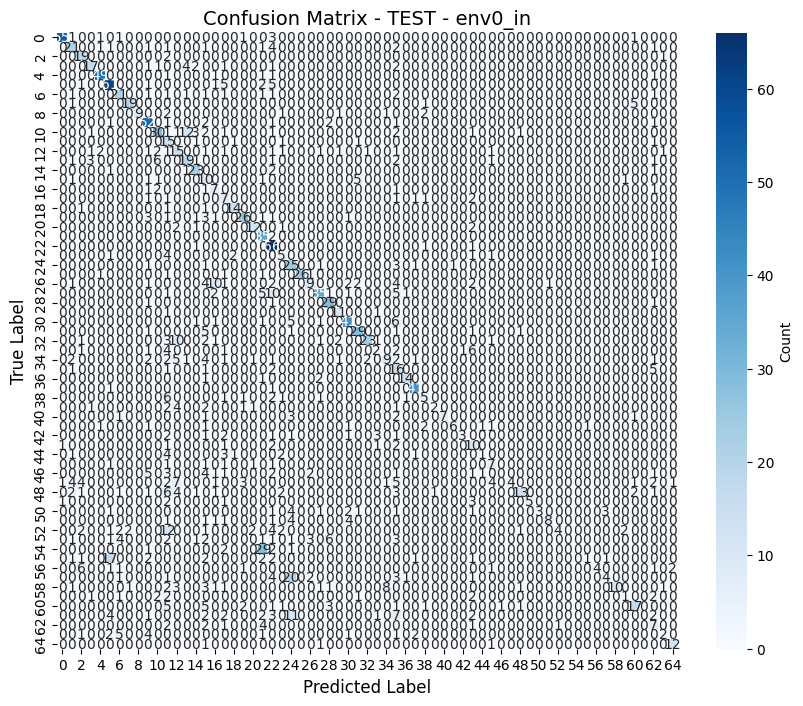


TRAIN - env1_in:
  Loss: 0.0599
  Accuracy: 0.9599, Precision: 0.9611, Recall: 0.9599, F1: 0.9603
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.png


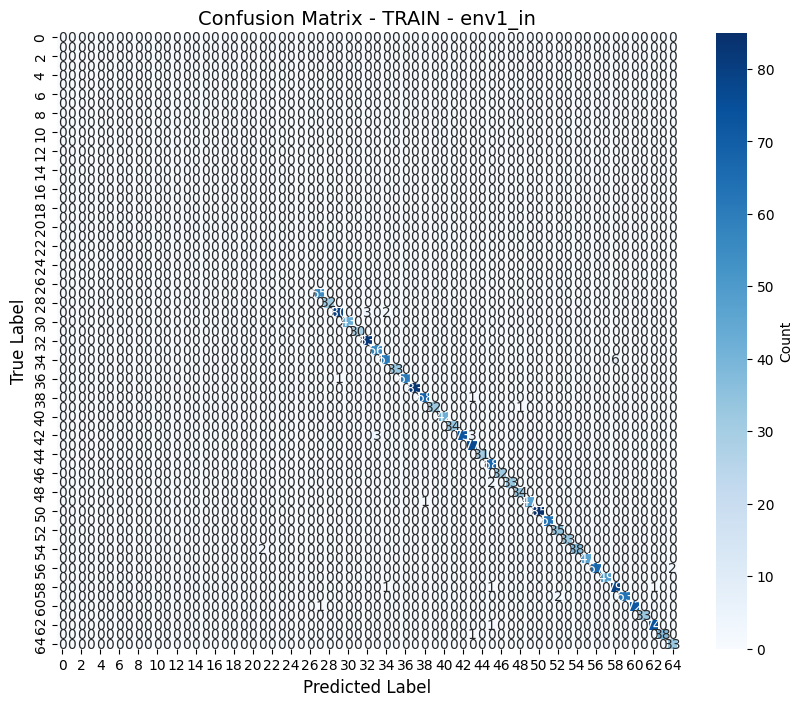


TRAIN - env2_in:
  Loss: 0.0326
  Accuracy: 0.8985, Precision: 0.9003, Recall: 0.8985, F1: 0.8993
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.png


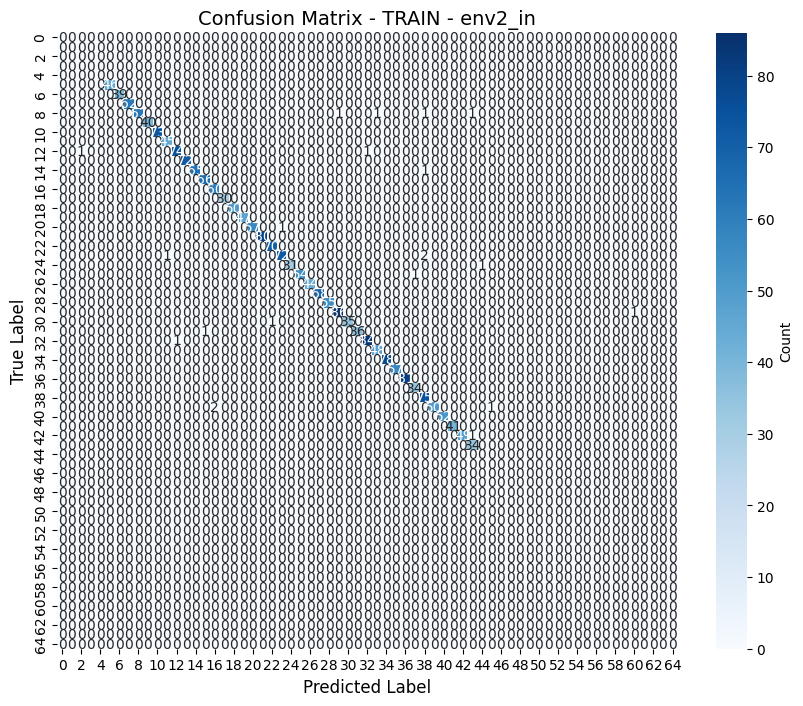


TRAIN - env3_in:
  Loss: 0.0174
  Accuracy: 0.9691, Precision: 0.9698, Recall: 0.9691, F1: 0.9694
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.png


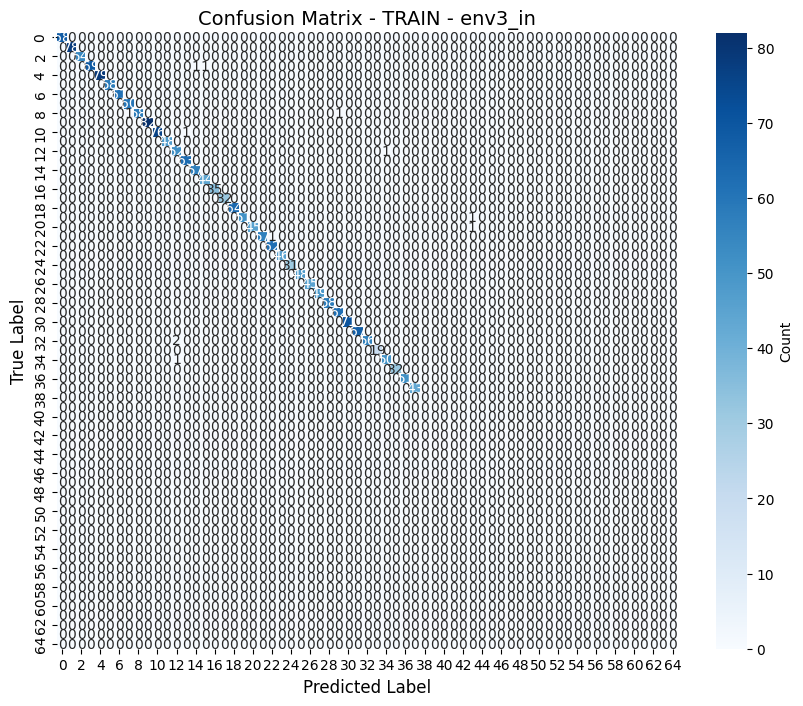


OTHER - env0_out:
  Loss: 2.5930
  Accuracy: 0.4913, Precision: 0.5751, Recall: 0.4913, F1: 0.4814
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.png


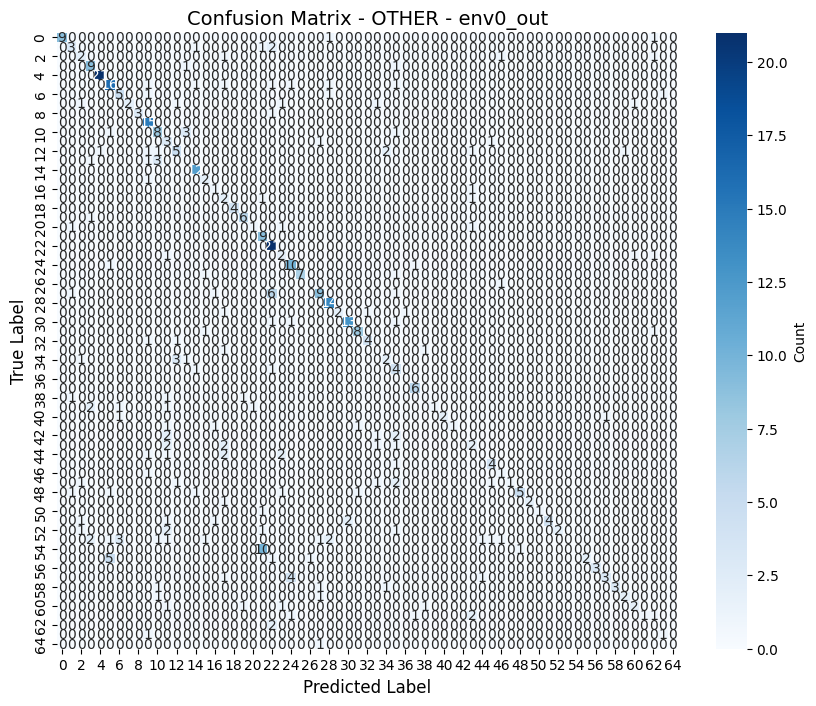


VAL - env1_out:
  Loss: 1.0114
  Accuracy: 0.5883, Precision: 0.6301, Recall: 0.5883, F1: 0.5987
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.png


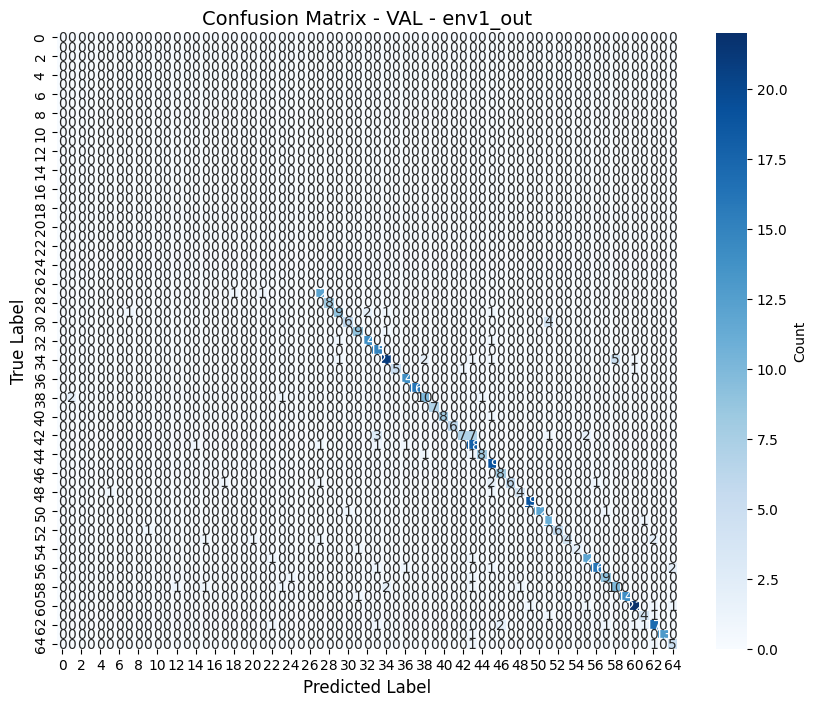


VAL - env2_out:
  Loss: 0.4822
  Accuracy: 0.8186, Precision: 0.8380, Recall: 0.8186, F1: 0.8225
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.png


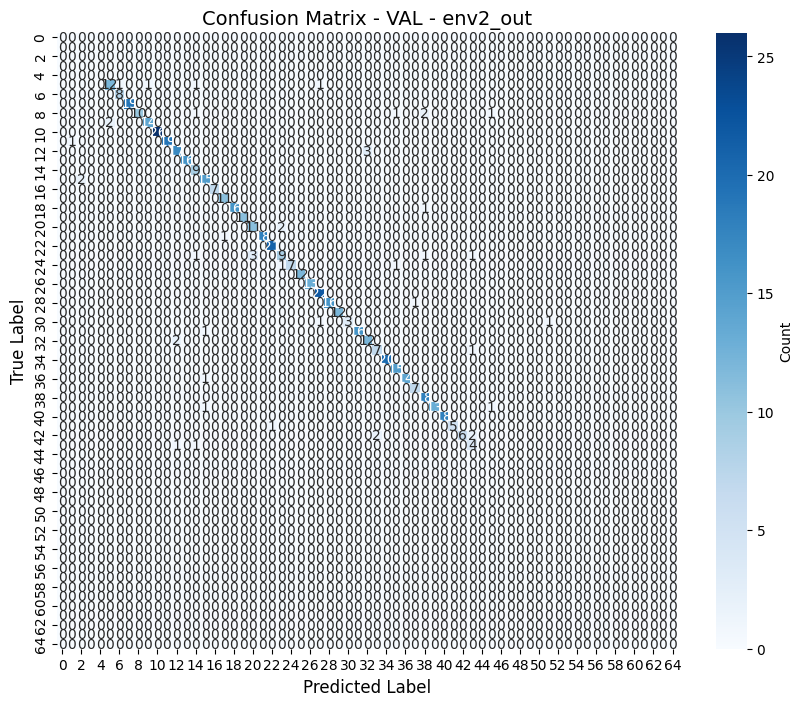


VAL - env3_out:
  Loss: 0.5324
  Accuracy: 0.8146, Precision: 0.8267, Recall: 0.8146, F1: 0.8182
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.png


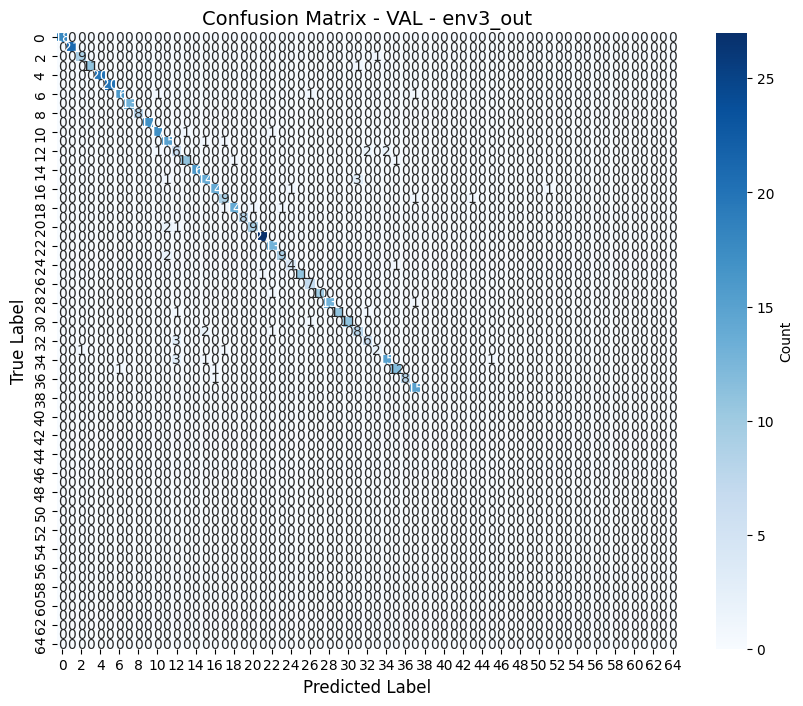


Training curves saved to: /kaggle/working/experiments/third_experiment/logs/training_curves_OfficeHome.png


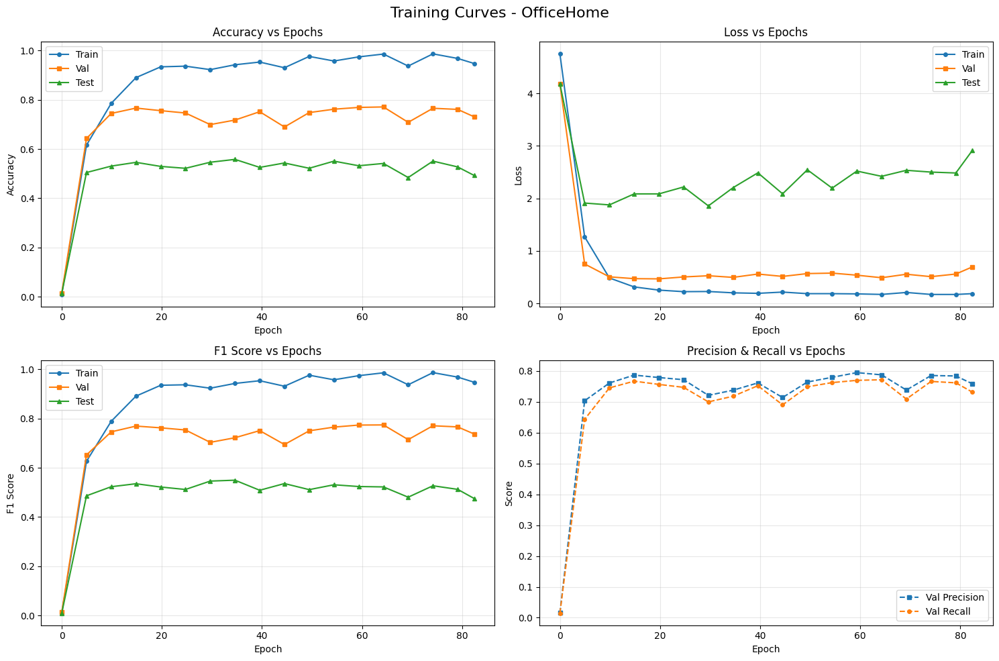

Epoch time plot saved to: /kaggle/working/experiments/third_experiment/logs/epoch_times_OfficeHome.png


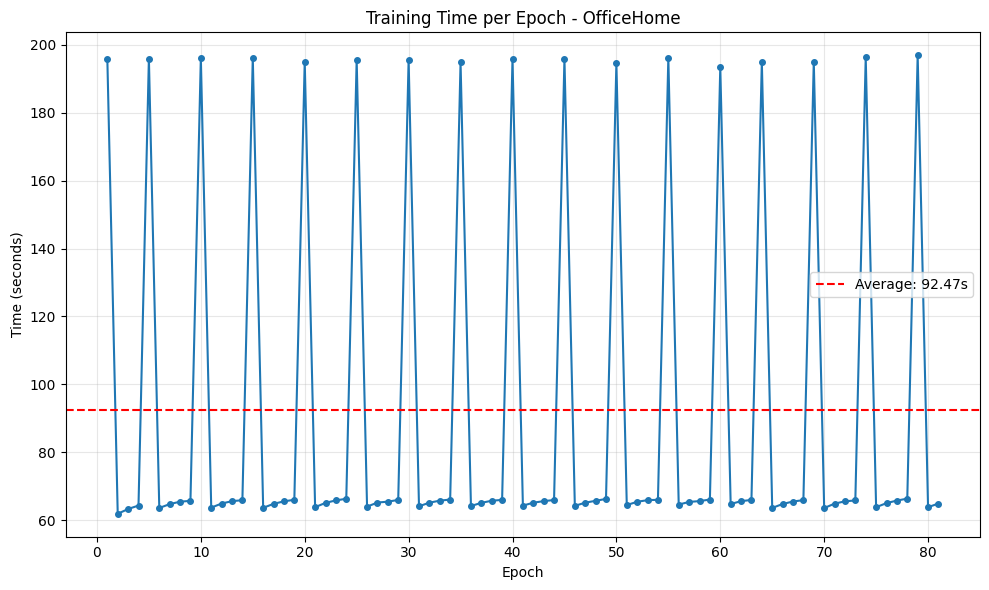


All results saved to: /kaggle/working/experiments/third_experiment/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_OfficeHome.png
  - epoch_times_OfficeHome.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)

✓ Experiment complete!
  Results: /kaggle/working/experiments/third_experiment/metrics_oh.csv
  Best model: /kaggle/working/experiments/third_experiment/best_model_oh.ckpt
  Config: /kaggle/working/experiments/third_experiment/config_oh.json
CONFUSION MATRICES:

confusion_matrix_OTHER_env0_out.png


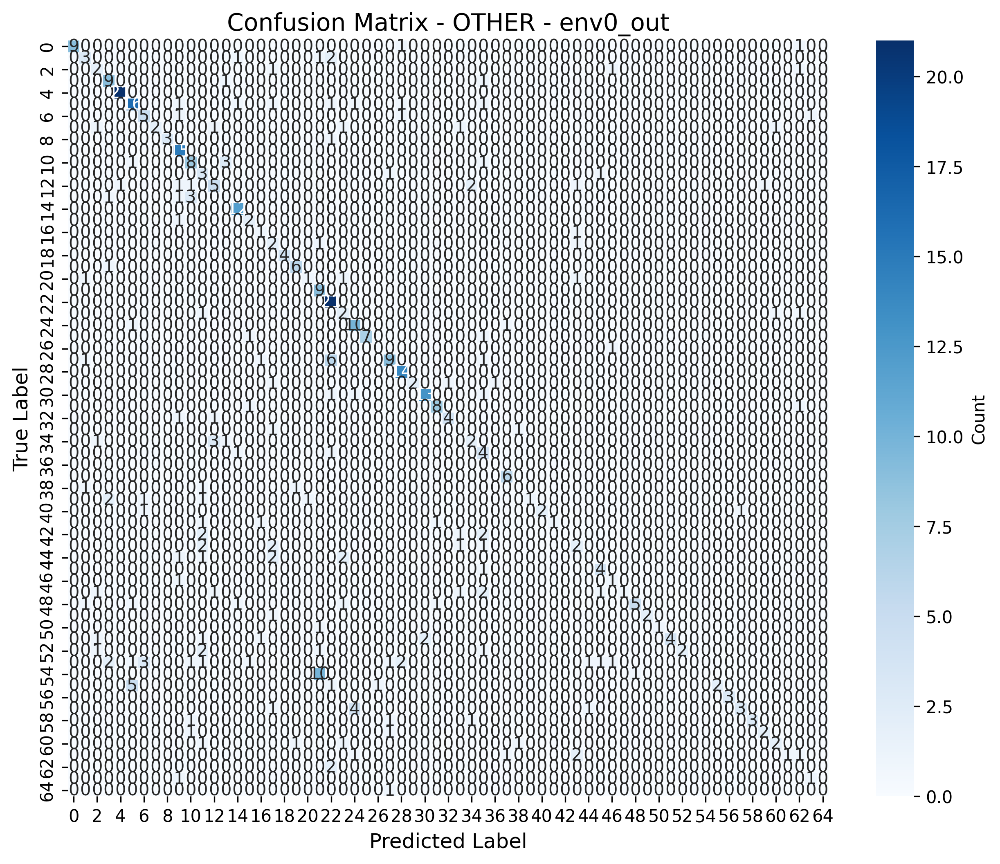


confusion_matrix_TEST_env0_in.png


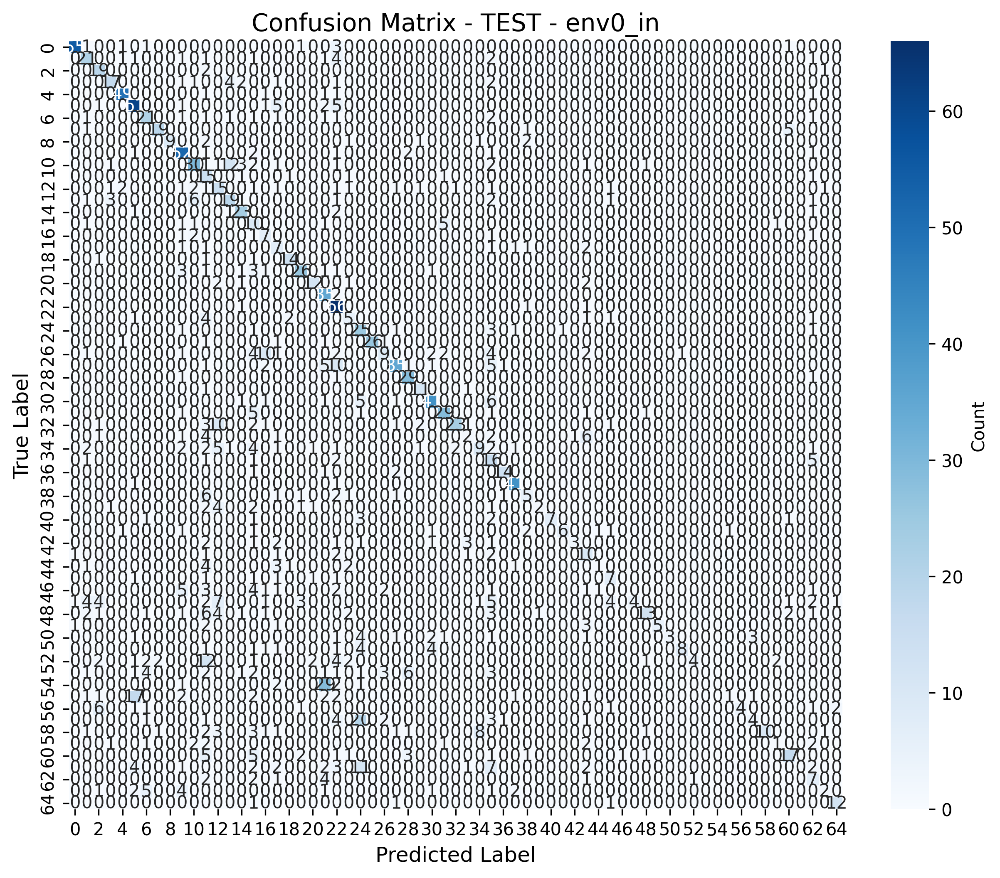


confusion_matrix_TRAIN_env1_in.png


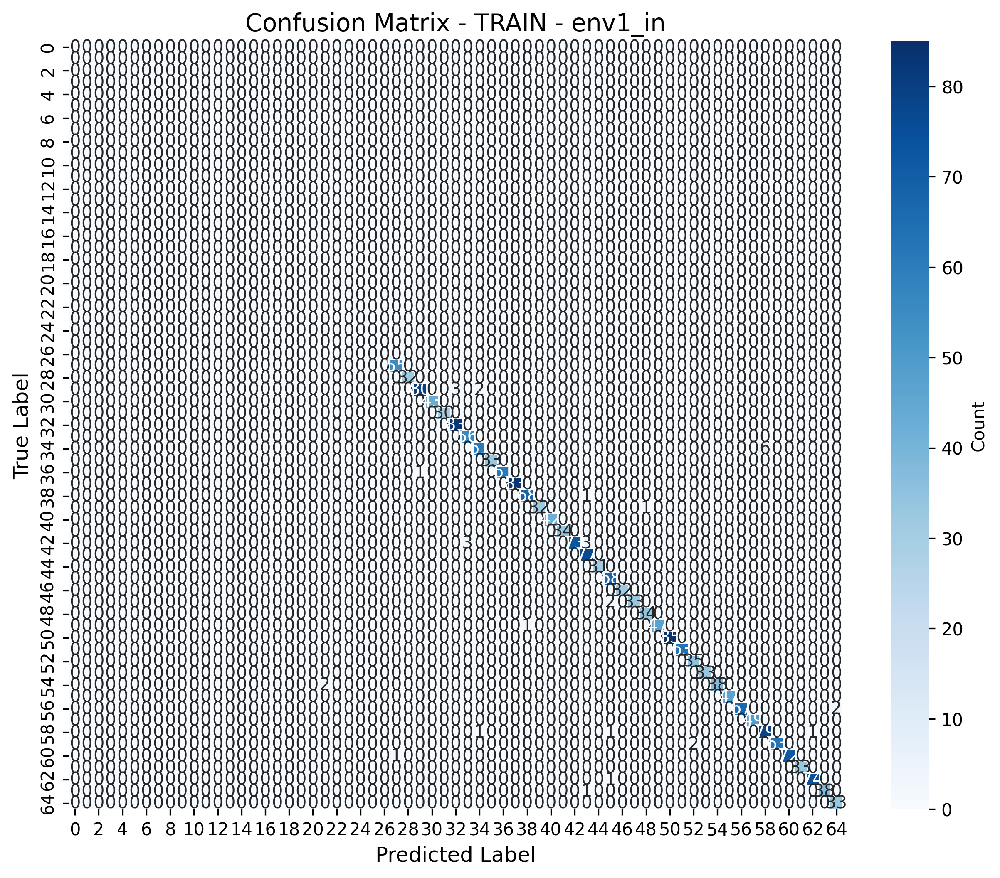


confusion_matrix_TRAIN_env2_in.png


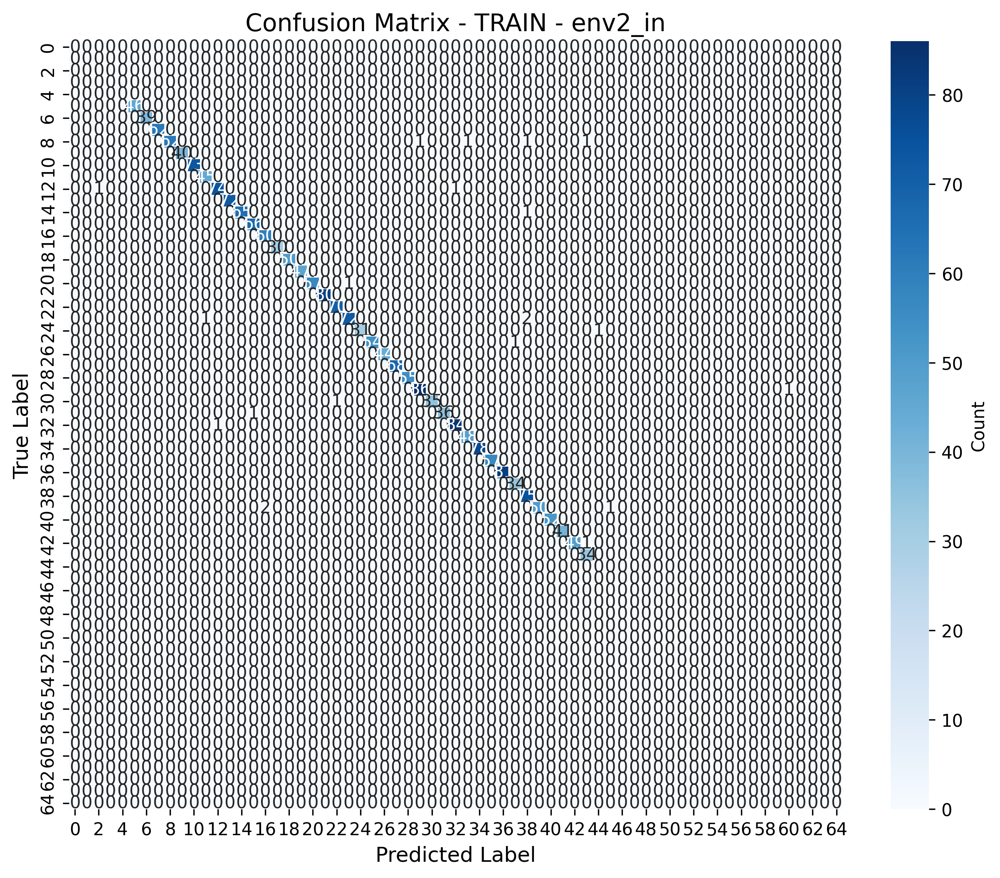


confusion_matrix_TRAIN_env3_in.png


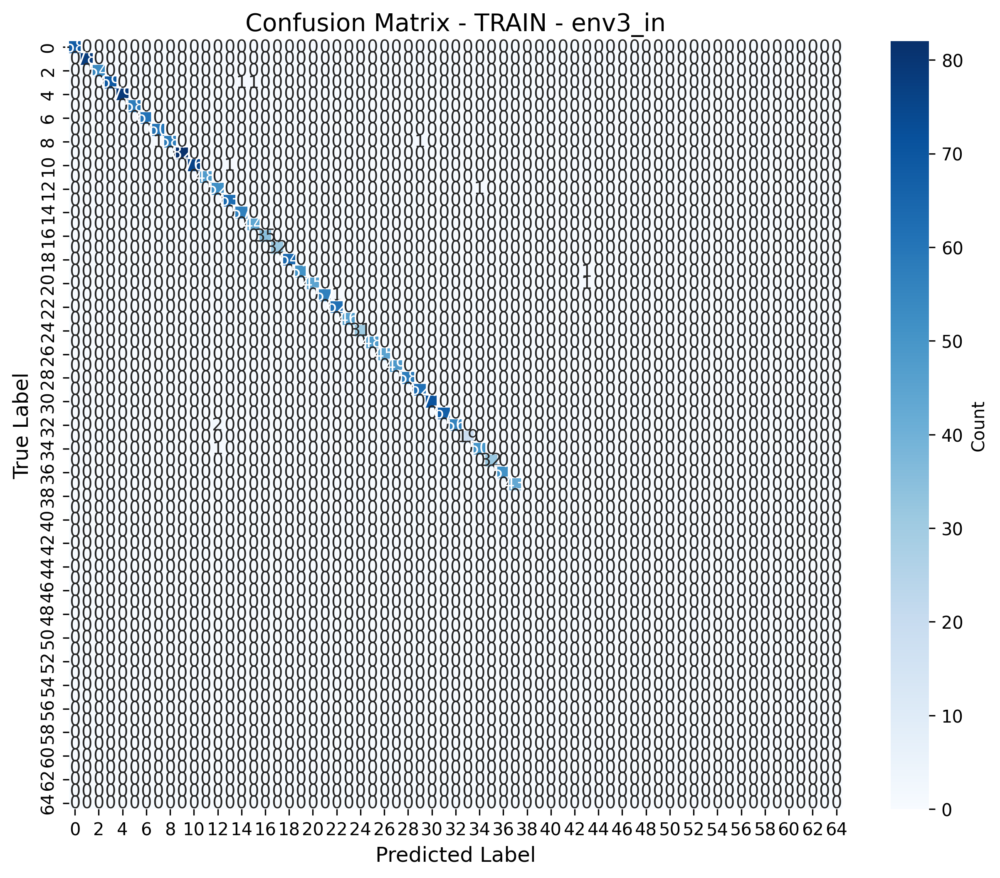


confusion_matrix_VAL_env1_out.png


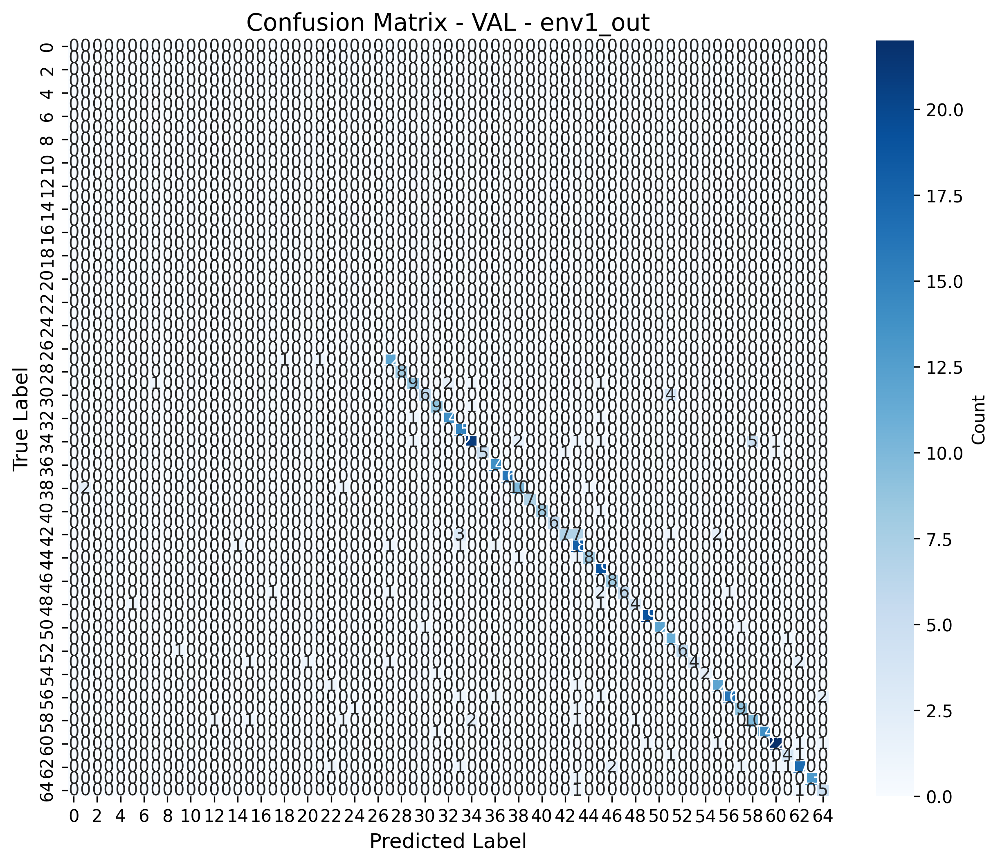


confusion_matrix_VAL_env2_out.png


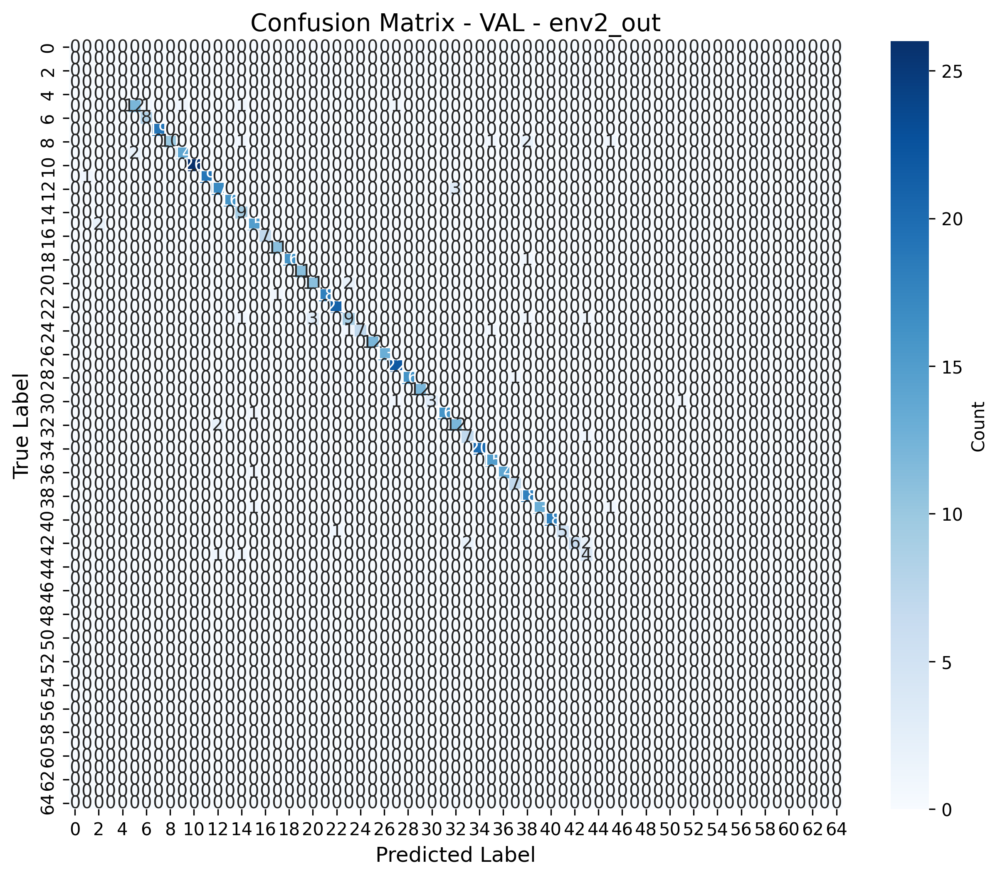


confusion_matrix_VAL_env3_out.png


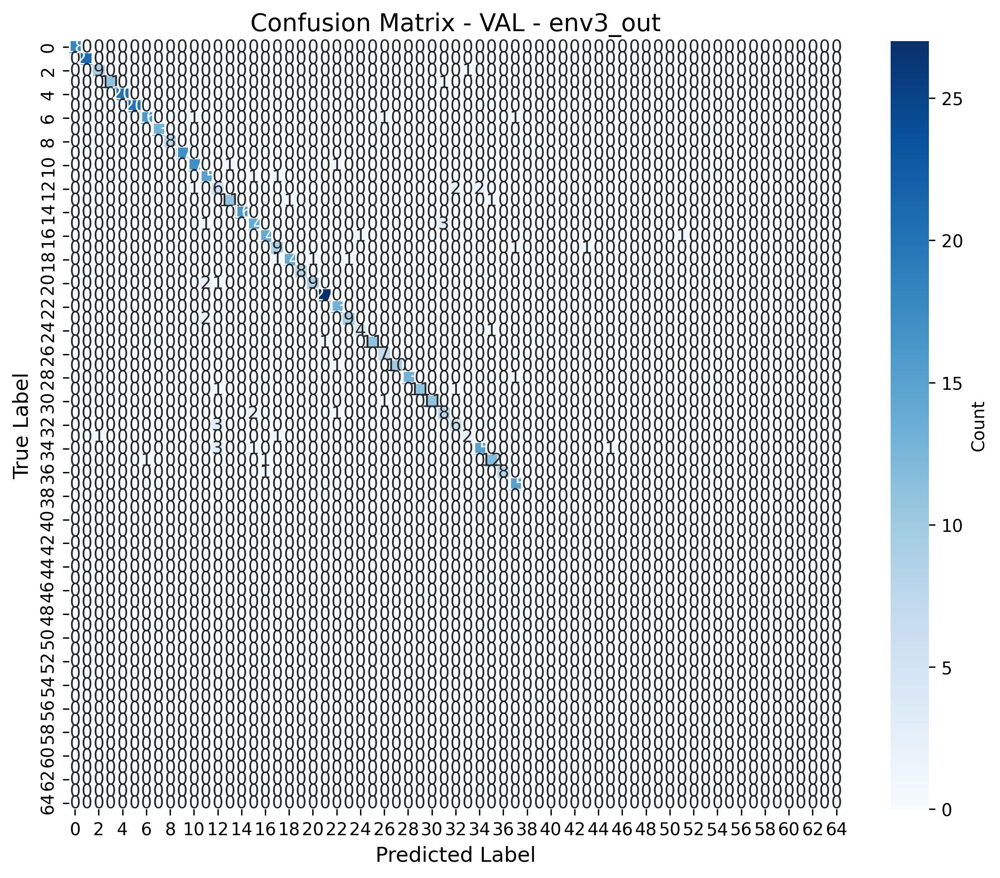



TRAINING CURVES:


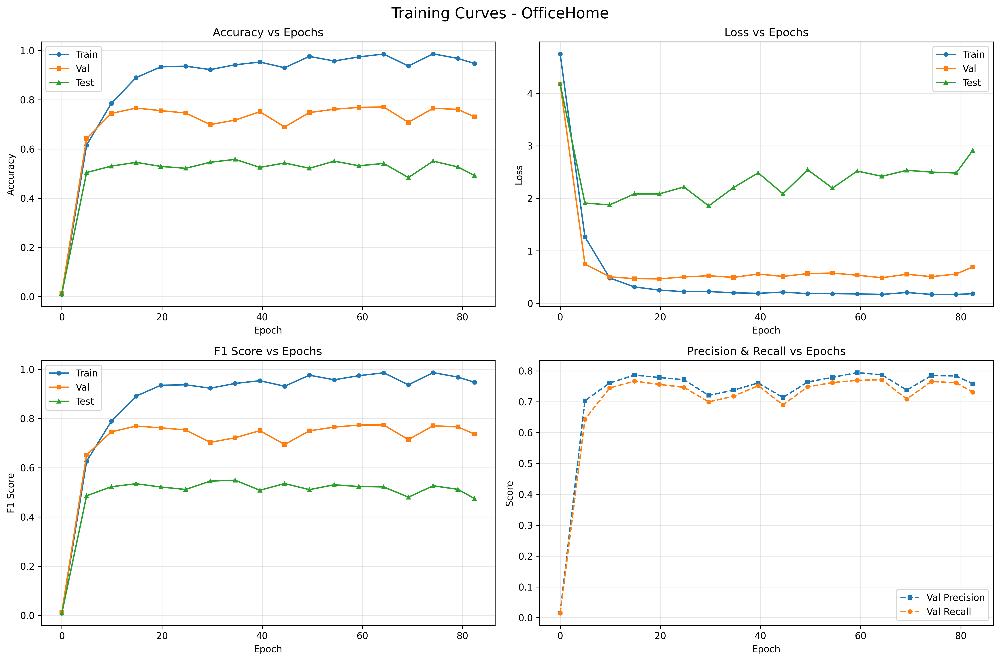

In [36]:


fit_simple(
exp_dir=str(exp_dir),
logger=logger,
seed=config.get("seed", 0),
trial_seed=config.get("trial_seed", 0),
hparams_seed=config.get("hparams_seed", 0),
algorithm_name=config["algo"],
dataset_name=dataset_name,
data_dir=config["data_dir"][dataset_name],
num_workers=config.get("num_workers", 4),
test_envs=[config["test_set_id"]],
overlap_type=config.get("overlap", "none"),
holdout_fraction=config.get("holdout_fraction", 0.2),
n_steps=config.get("n_epochs"),  # Changed to epochs!
checkpoint_freq=config.get("checkpoint_freq"),  # In epochs
model_checkpoint=config.get("model_checkpoint", {
    "metric": "val/acc",
    "maximize": True
}),
num_domain_linked_classes=config.get("num_domain_linked_classes"),
num_classes=config.get("num_classes"),
# AutoAugmentation specific
auto_augment=config.get("auto_augment", False),
augment_search_epochs=config.get("augment_search_epochs", 10),
)

logging.info(f"Experiment complete. Results saved to {exp_dir}")
print(f"\n✓ Experiment complete!")
print(f"  Results: {exp_dir / 'metrics_oh.csv'}")
print(f"  Best model: {exp_dir / 'best_model_oh.ckpt'}")
print(f"  Config: {exp_dir / 'config_oh.json'}")

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display, Image
import os

log_dir = f"/kaggle/working/experiments/{exp_name_oh}/logs"

# Get all confusion matrix plot files
cm_files = [f for f in os.listdir(log_dir) if f.startswith('confusion_matrix_') and f.endswith('.png')]

# Display all confusion matrices
print("CONFUSION MATRICES:")
print("="*60)
for cm_file in sorted(cm_files):
    print(f"\n{cm_file}")
    display(Image(filename=os.path.join(log_dir, cm_file)))

# Display training curves
print("\n\nTRAINING CURVES:")
print("="*60)
display(Image(filename=os.path.join(log_dir, 'training_curves_OfficeHome.png')))




## PACS

In [37]:
output_dir = "/kaggle/working/experiments"
if not os.path.exists(output_dir):
    os.mkdir(output_dir)
exp_name_pacs = input()
config["name"] = exp_name_pacs

exp_name_pacs = config["name"] or f"{config['algo']}_{config['dataset']}_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
exp_dir = Path(output_dir) / exp_name_pacs
exp_dir.mkdir(parents=True, exist_ok=True)
log_dir = exp_dir / 'logs'
log_dir.mkdir(parents=True, exist_ok=True)
# Setup logging
config_logging()
logging.info(f"Starting experiment: {exp_name_pacs}")
logging.info(f"Output directory: {exp_dir}")

# Save config to experiment directory
with open(exp_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)


logger = CSVLogger(log_dir / 'metrics.csv',  root_dir=log_dir)## VLCS

 third_experiment


In [38]:
dataset_name_pacs = config["dataset"][0]
dataset_name_pacs

'PACS'

Seed set to 0


/kaggle/input/pacs-dataset/kfold
Model checkpoint frequency: 300


  0%|          | 0/5001 [00:48<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
step_time: 48.3908s
TRAIN:
  loss: 3.1277
  acc: 0.0999
  precision: 0.1026
  recall: 0.0999
  f1: 0.0833
  oacc: 0.0544
  nacc: 0.2138
VAL:
  loss: 1.9637
  acc: 0.1037
  precision: 0.1761
  recall: 0.1037
  f1: 0.0854
  oacc: 0.0520
  nacc: 0.2067
TEST:
  loss: 1.9551
  acc: 0.1315
  precision: 0.1006
  recall: 0.1315
  f1: 0.0996
  oacc: 0.0389
  nacc: 0.3630
OTHER:
  loss: 1.9640
  acc: 0.1228
  precision: 0.0991
  recall: 0.1228
  f1: 0.0851
  oacc: 0.0236
  nacc: 0.3708


  6%|▌         | 300/5001 [06:48<1:24:03,  1.07s/it]


=== Step 300 (Epoch 14.16) ===
step_time: 50.7368s
TRAIN:
  loss: 0.8562
  acc: 0.9900
  precision: 0.9902
  recall: 0.9900
  f1: 0.9899
  oacc: 0.6592
  nacc: 0.3320
VAL:
  loss: 0.1176
  acc: 0.8994
  precision: 0.9039
  recall: 0.8994
  f1: 0.9008
  oacc: 0.6409
  nacc: 0.3227
TEST:
  loss: 1.0684
  acc: 0.7282
  precision: 0.8064
  recall: 0.7282
  f1: 0.6941
  oacc: 0.8563
  nacc: 0.4080
OTHER:
  loss: 1.2011
  acc: 0.7434
  precision: 0.7976
  recall: 0.7434
  f1: 0.6867
  oacc: 0.8744
  nacc: 0.4158


 12%|█▏        | 600/5001 [13:04<1:20:10,  1.09s/it] 


=== Step 600 (Epoch 28.32) ===
step_time: 50.9942s
TRAIN:
  loss: 0.6977
  acc: 0.9255
  precision: 0.9258
  recall: 0.9255
  f1: 0.9255
  oacc: 0.6604
  nacc: 0.3328
VAL:
  loss: 0.0919
  acc: 0.8622
  precision: 0.8649
  recall: 0.8622
  f1: 0.8632
  oacc: 0.6449
  nacc: 0.3239
TEST:
  loss: 1.2845
  acc: 0.7042
  precision: 0.8322
  recall: 0.7042
  f1: 0.6826
  oacc: 0.8219
  nacc: 0.4100
OTHER:
  loss: 1.4419
  acc: 0.7035
  precision: 0.8170
  recall: 0.7035
  f1: 0.6636
  oacc: 0.8360
  nacc: 0.3723


 18%|█▊        | 900/5001 [19:20<1:14:11,  1.09s/it] 


=== Step 900 (Epoch 42.48) ===
step_time: 50.7993s
TRAIN:
  loss: 0.6756
  acc: 0.9989
  precision: 0.9989
  recall: 0.9989
  f1: 0.9989
  oacc: 0.6663
  nacc: 0.3320
VAL:
  loss: 0.0957
  acc: 0.9101
  precision: 0.9119
  recall: 0.9101
  f1: 0.9108
  oacc: 0.6527
  nacc: 0.3181
TEST:
  loss: 0.9598
  acc: 0.7424
  precision: 0.8241
  recall: 0.7424
  f1: 0.7270
  oacc: 0.8414
  nacc: 0.4949
OTHER:
  loss: 1.2920
  acc: 0.7534
  precision: 0.8288
  recall: 0.7534
  f1: 0.7147
  oacc: 0.8625
  nacc: 0.4807


 24%|██▍       | 1200/5001 [25:37<1:09:05,  1.09s/it]


=== Step 1200 (Epoch 56.64) ===
step_time: 50.9224s
TRAIN:
  loss: 0.6766
  acc: 0.9964
  precision: 0.9966
  recall: 0.9964
  f1: 0.9964
  oacc: 0.6652
  nacc: 0.3297
VAL:
  loss: 0.1185
  acc: 0.9763
  precision: 0.9765
  recall: 0.9763
  f1: 0.9759
  oacc: 0.6536
  nacc: 0.3187
TEST:
  loss: 1.5606
  acc: 0.6993
  precision: 0.8365
  recall: 0.6993
  f1: 0.6763
  oacc: 0.8243
  nacc: 0.3867
OTHER:
  loss: 2.1128
  acc: 0.7102
  precision: 0.8351
  recall: 0.7102
  f1: 0.6679
  oacc: 0.8466
  nacc: 0.3690


 30%|███       | 1501/5001 [31:54<15:41:07, 16.13s/it]


=== Step 1500 (Epoch 70.80) ===
step_time: 51.1408s
TRAIN:
  loss: 0.6681
  acc: 0.9313
  precision: 0.9316
  recall: 0.9313
  f1: 0.9315
  oacc: 0.6648
  nacc: 0.3333
VAL:
  loss: 0.1411
  acc: 0.9065
  precision: 0.9079
  recall: 0.9065
  f1: 0.9064
  oacc: 0.6484
  nacc: 0.3207
TEST:
  loss: 2.8578
  acc: 0.5719
  precision: 0.8439
  recall: 0.5719
  f1: 0.5643
  oacc: 0.6742
  nacc: 0.3161
OTHER:
  loss: 3.0629
  acc: 0.6204
  precision: 0.8555
  recall: 0.6204
  f1: 0.6079
  oacc: 0.7431
  nacc: 0.3134


 36%|███▌      | 1801/5001 [38:10<14:22:21, 16.17s/it]


=== Step 1800 (Epoch 84.96) ===
step_time: 51.2614s
TRAIN:
  loss: 0.6860
  acc: 0.9253
  precision: 0.9274
  recall: 0.9253
  f1: 0.9262
  oacc: 0.6600
  nacc: 0.3333
VAL:
  loss: 0.1285
  acc: 0.8340
  precision: 0.8408
  recall: 0.8340
  f1: 0.8367
  oacc: 0.6402
  nacc: 0.3267
TEST:
  loss: 1.0537
  acc: 0.7173
  precision: 0.8533
  recall: 0.7173
  f1: 0.7003
  oacc: 0.7972
  nacc: 0.5175
OTHER:
  loss: 1.4229
  acc: 0.7048
  precision: 0.8303
  recall: 0.7048
  f1: 0.6687
  oacc: 0.7891
  nacc: 0.4942


 42%|████▏     | 2101/5001 [44:26<13:01:04, 16.16s/it]


=== Step 2100 (Epoch 99.12) ===
step_time: 51.2302s
TRAIN:
  loss: 0.6635
  acc: 0.9988
  precision: 0.9989
  recall: 0.9988
  f1: 0.9988
  oacc: 0.6658
  nacc: 0.3331
VAL:
  loss: 0.1604
  acc: 0.9055
  precision: 0.9096
  recall: 0.9055
  f1: 0.9068
  oacc: 0.6486
  nacc: 0.3190
TEST:
  loss: 1.1098
  acc: 0.7471
  precision: 0.8064
  recall: 0.7471
  f1: 0.7374
  oacc: 0.8161
  nacc: 0.5745
OTHER:
  loss: 1.4230
  acc: 0.7470
  precision: 0.8012
  recall: 0.7470
  f1: 0.7188
  oacc: 0.8456
  nacc: 0.5005


 48%|████▊     | 2400/5001 [50:42<47:15,  1.09s/it]   


=== Step 2400 (Epoch 113.27) ===
step_time: 50.8618s
TRAIN:
  loss: 0.6682
  acc: 0.9979
  precision: 0.9979
  recall: 0.9979
  f1: 0.9979
  oacc: 0.6655
  nacc: 0.3320
VAL:
  loss: 0.1107
  acc: 0.9756
  precision: 0.9766
  recall: 0.9756
  f1: 0.9756
  oacc: 0.6546
  nacc: 0.3147
TEST:
  loss: 1.0545
  acc: 0.7535
  precision: 0.8280
  recall: 0.7535
  f1: 0.7362
  oacc: 0.8568
  nacc: 0.4952
OTHER:
  loss: 1.2771
  acc: 0.7245
  precision: 0.8137
  recall: 0.7245
  f1: 0.6989
  oacc: 0.8406
  nacc: 0.4345


 54%|█████▍    | 2701/5001 [56:58<10:17:00, 16.10s/it]


=== Step 2700 (Epoch 127.43) ===
step_time: 51.0217s
TRAIN:
  loss: 0.6678
  acc: 0.9992
  precision: 0.9992
  recall: 0.9992
  f1: 0.9992
  oacc: 0.6660
  nacc: 0.3333
VAL:
  loss: 0.0603
  acc: 0.8464
  precision: 0.8481
  recall: 0.8464
  f1: 0.8471
  oacc: 0.6515
  nacc: 0.3227
TEST:
  loss: 1.0831
  acc: 0.7572
  precision: 0.8332
  recall: 0.7572
  f1: 0.7455
  oacc: 0.8486
  nacc: 0.5289
OTHER:
  loss: 1.3501
  acc: 0.7328
  precision: 0.8186
  recall: 0.7328
  f1: 0.7052
  oacc: 0.8371
  nacc: 0.4720


 60%|██████    | 3001/5001 [1:03:13<8:55:49, 16.07s/it]


=== Step 3000 (Epoch 141.59) ===
step_time: 50.9456s
TRAIN:
  loss: 0.6561
  acc: 0.9997
  precision: 0.9997
  recall: 0.9997
  f1: 0.9997
  oacc: 0.6664
  nacc: 0.3333
VAL:
  loss: 0.1360
  acc: 0.9759
  precision: 0.9754
  recall: 0.9759
  f1: 0.9742
  oacc: 0.6531
  nacc: 0.3190
TEST:
  loss: 1.9859
  acc: 0.6935
  precision: 0.8458
  recall: 0.6935
  f1: 0.6680
  oacc: 0.8173
  nacc: 0.3839
OTHER:
  loss: 2.4123
  acc: 0.7105
  precision: 0.8380
  recall: 0.7105
  f1: 0.6696
  oacc: 0.8507
  nacc: 0.3601


 66%|██████▌   | 3301/5001 [1:09:29<7:36:23, 16.11s/it]


=== Step 3300 (Epoch 155.75) ===
step_time: 51.0515s
TRAIN:
  loss: 0.6930
  acc: 0.7907
  precision: 0.7928
  recall: 0.7907
  f1: 0.7914
  oacc: 0.6574
  nacc: 0.3333
VAL:
  loss: 0.2507
  acc: 0.8284
  precision: 0.8375
  recall: 0.8284
  f1: 0.8303
  oacc: 0.6323
  nacc: 0.3236
TEST:
  loss: 1.6986
  acc: 0.7116
  precision: 0.8398
  recall: 0.7116
  f1: 0.6838
  oacc: 0.7887
  nacc: 0.5189
OTHER:
  loss: 2.1169
  acc: 0.7063
  precision: 0.8039
  recall: 0.7063
  f1: 0.6650
  oacc: 0.8019
  nacc: 0.4671


 72%|███████▏  | 3600/5001 [1:15:45<25:21,  1.09s/it]  


=== Step 3600 (Epoch 169.91) ===
step_time: 50.9097s
TRAIN:
  loss: 0.6588
  acc: 1.0000
  precision: 1.0000
  recall: 1.0000
  f1: 1.0000
  oacc: 0.6667
  nacc: 0.3333
VAL:
  loss: 0.0759
  acc: 0.9833
  precision: 0.9841
  recall: 0.9833
  f1: 0.9836
  oacc: 0.6568
  nacc: 0.3247
TEST:
  loss: 1.3586
  acc: 0.7440
  precision: 0.8607
  recall: 0.7440
  f1: 0.7379
  oacc: 0.8391
  nacc: 0.5063
OTHER:
  loss: 1.6767
  acc: 0.7392
  precision: 0.8511
  recall: 0.7392
  f1: 0.7201
  oacc: 0.8419
  nacc: 0.4825


 78%|███████▊  | 3901/5001 [1:22:00<4:54:30, 16.06s/it]


=== Step 3900 (Epoch 184.07) ===
step_time: 50.9216s
TRAIN:
  loss: 0.6998
  acc: 0.8555
  precision: 0.8555
  recall: 0.8555
  f1: 0.8552
  oacc: 0.6600
  nacc: 0.3229
VAL:
  loss: 0.1749
  acc: 0.7530
  precision: 0.7586
  recall: 0.7530
  f1: 0.7540
  oacc: 0.6377
  nacc: 0.3066
TEST:
  loss: 1.3569
  acc: 0.6673
  precision: 0.7815
  recall: 0.6673
  f1: 0.6290
  oacc: 0.7879
  nacc: 0.3660
OTHER:
  loss: 1.5318
  acc: 0.6813
  precision: 0.7837
  recall: 0.6813
  f1: 0.6280
  oacc: 0.8152
  nacc: 0.3467


 84%|████████▍ | 4200/5001 [1:28:16<14:31,  1.09s/it]  


=== Step 4200 (Epoch 198.23) ===
step_time: 50.8634s
TRAIN:
  loss: 0.6572
  acc: 0.9999
  precision: 0.9999
  recall: 0.9999
  f1: 0.9999
  oacc: 0.6666
  nacc: 0.3333
VAL:
  loss: 0.0847
  acc: 0.9206
  precision: 0.9219
  recall: 0.9206
  f1: 0.9212
  oacc: 0.6581
  nacc: 0.3259
TEST:
  loss: 1.1681
  acc: 0.7821
  precision: 0.8606
  recall: 0.7821
  f1: 0.7734
  oacc: 0.8758
  nacc: 0.5478
OTHER:
  loss: 1.6939
  acc: 0.7591
  precision: 0.8438
  recall: 0.7591
  f1: 0.7398
  oacc: 0.8529
  nacc: 0.5248


 90%|█████████ | 4501/5001 [1:34:32<2:13:48, 16.06s/it]


=== Step 4500 (Epoch 212.39) ===
step_time: 50.8924s
TRAIN:
  loss: 0.6594
  acc: 0.9981
  precision: 0.9981
  recall: 0.9981
  f1: 0.9981
  oacc: 0.6652
  nacc: 0.3333
VAL:
  loss: 0.1008
  acc: 0.9757
  precision: 0.9779
  recall: 0.9757
  f1: 0.9762
  oacc: 0.6498
  nacc: 0.3270
TEST:
  loss: 1.0098
  acc: 0.7791
  precision: 0.8420
  recall: 0.7791
  f1: 0.7707
  oacc: 0.8578
  nacc: 0.5824
OTHER:
  loss: 1.3083
  acc: 0.7916
  precision: 0.8463
  recall: 0.7916
  f1: 0.7735
  oacc: 0.8771
  nacc: 0.5779


 96%|█████████▌| 4800/5001 [1:40:47<03:37,  1.08s/it]  


=== Step 4800 (Epoch 226.55) ===
step_time: 51.0282s
TRAIN:
  loss: 0.6535
  acc: 0.9999
  precision: 0.9999
  recall: 0.9999
  f1: 0.9999
  oacc: 0.6667
  nacc: 0.3331
VAL:
  loss: 0.0887
  acc: 0.9845
  precision: 0.9860
  recall: 0.9845
  f1: 0.9851
  oacc: 0.6583
  nacc: 0.3233
TEST:
  loss: 1.1342
  acc: 0.7692
  precision: 0.8332
  recall: 0.7692
  f1: 0.7590
  oacc: 0.8520
  nacc: 0.5621
OTHER:
  loss: 1.5316
  acc: 0.7731
  precision: 0.8428
  recall: 0.7731
  f1: 0.7504
  oacc: 0.8790
  nacc: 0.5083


100%|██████████| 5001/5001 [1:45:13<00:00,  1.26s/it]



=== Step 5000 (Epoch 235.99) ===
step_time: 50.8513s
TRAIN:
  loss: 0.6559
  acc: 1.0000
  precision: 1.0000
  recall: 1.0000
  f1: 1.0000
  oacc: 0.6667
  nacc: 0.3333
VAL:
  loss: 0.0664
  acc: 0.9814
  precision: 0.9812
  recall: 0.9814
  f1: 0.9812
  oacc: 0.6582
  nacc: 0.3173
TEST:
  loss: 1.1771
  acc: 0.7717
  precision: 0.8462
  recall: 0.7717
  f1: 0.7640
  oacc: 0.8306
  nacc: 0.6243
OTHER:
  loss: 1.4323
  acc: 0.7701
  precision: 0.8399
  recall: 0.7701
  f1: 0.7527
  oacc: 0.8560
  nacc: 0.5553

TRAINING COMPLETED
Total training time: 6313.90s (105.23 minutes)
Average time per epoch: 27.56s
Total epochs: 227


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 1.1799
  Accuracy: 0.7717, Precision: 0.8462, Recall: 0.7717, F1: 0.7640
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0_in.png


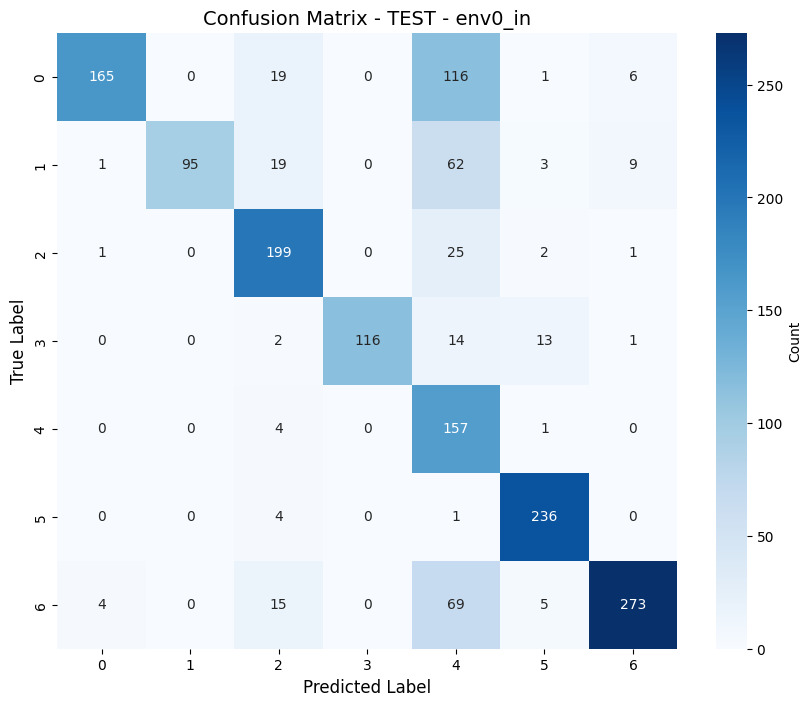


TRAIN - env1_in:
  Loss: 0.0001
  Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1: 1.0000
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.png


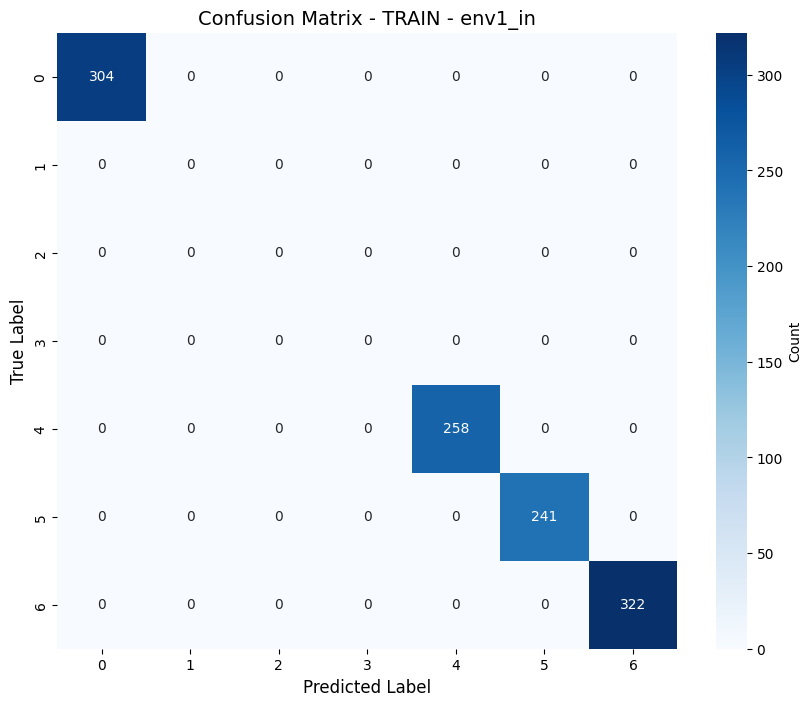


TRAIN - env2_in:
  Loss: 0.0001
  Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1: 1.0000
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.png


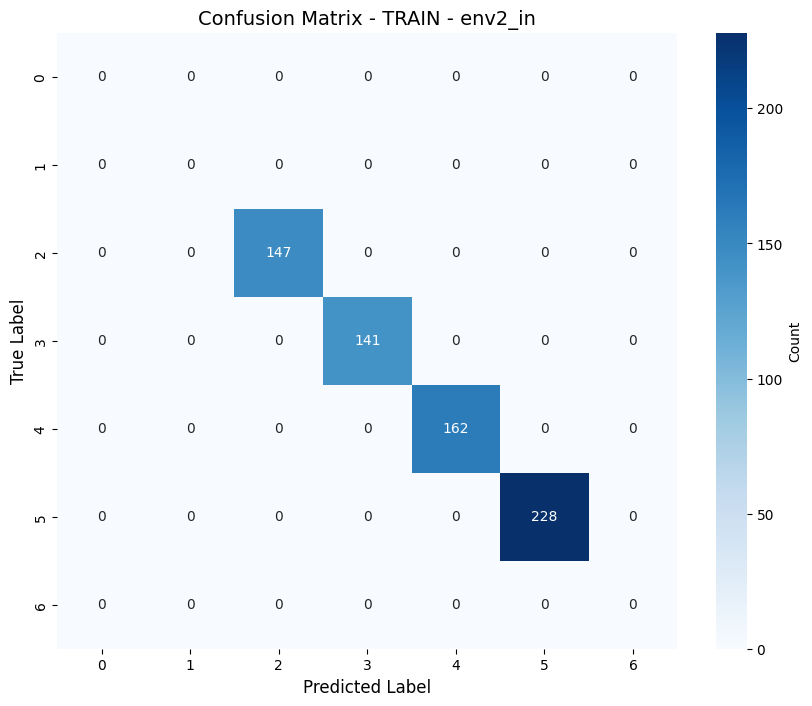


TRAIN - env3_in:
  Loss: 0.0007
  Accuracy: 0.9988, Precision: 0.9988, Recall: 0.9988, F1: 0.9988
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.png


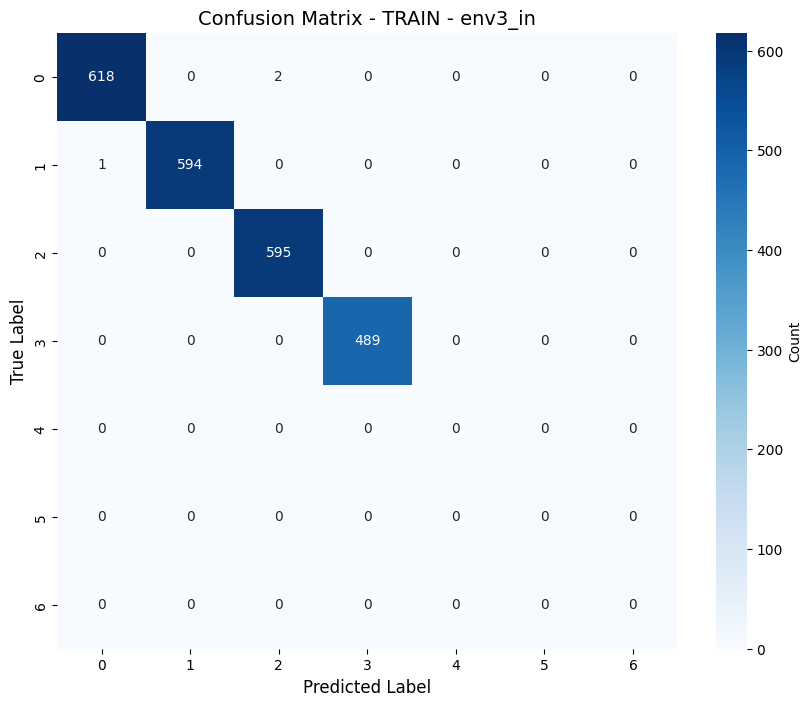


OTHER - env0_out:
  Loss: 1.4587
  Accuracy: 0.7701, Precision: 0.8399, Recall: 0.7701, F1: 0.7527
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.png


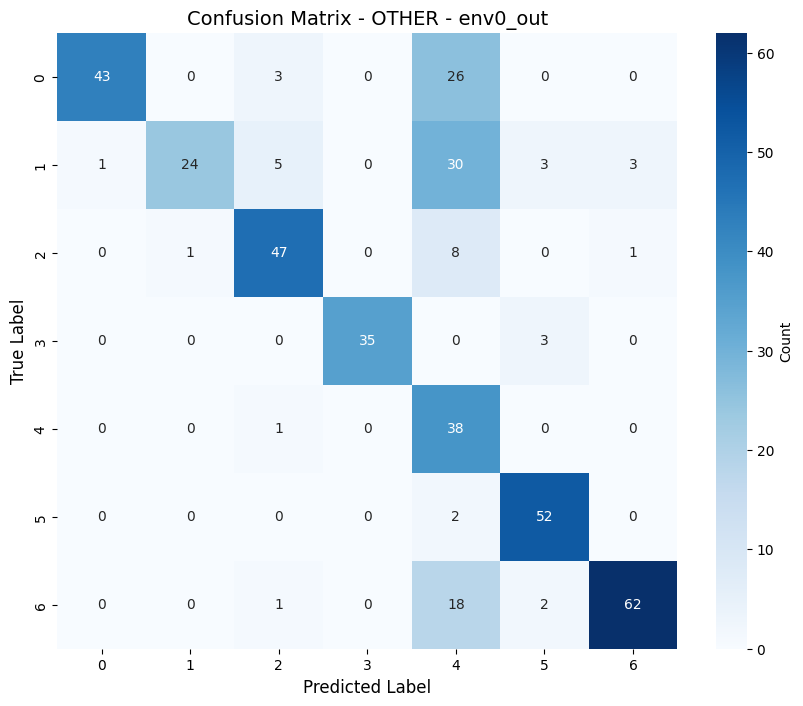


VAL - env1_out:
  Loss: 0.1277
  Accuracy: 0.6366, Precision: 0.6406, Recall: 0.6366, F1: 0.6385
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.png


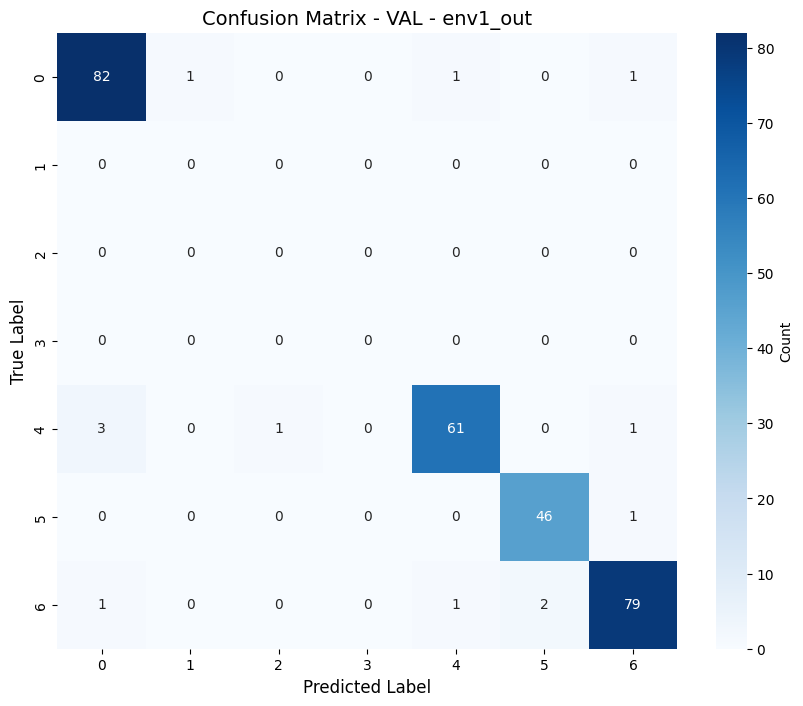


VAL - env2_out:
  Loss: 0.0158
  Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1: 1.0000
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.png


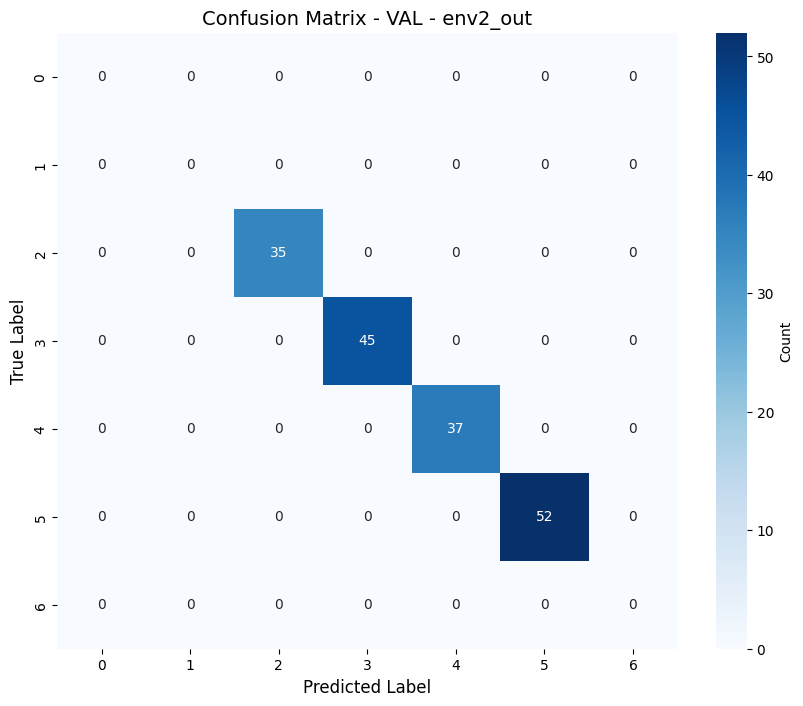


VAL - env3_out:
  Loss: 0.0793
  Accuracy: 0.7719, Precision: 0.7735, Recall: 0.7719, F1: 0.7727
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.png


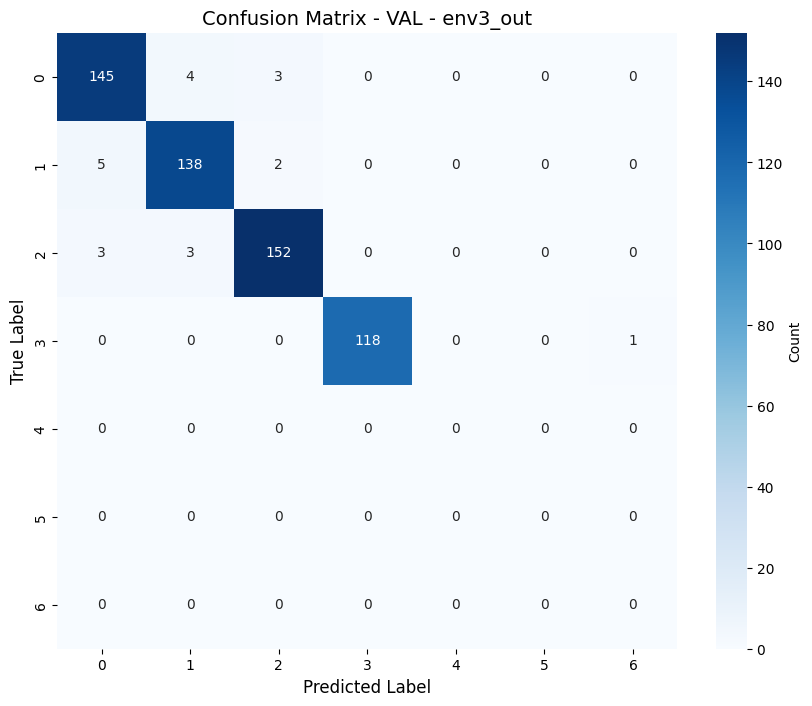


Training curves saved to: /kaggle/working/experiments/third_experiment/logs/training_curves_PACS.png


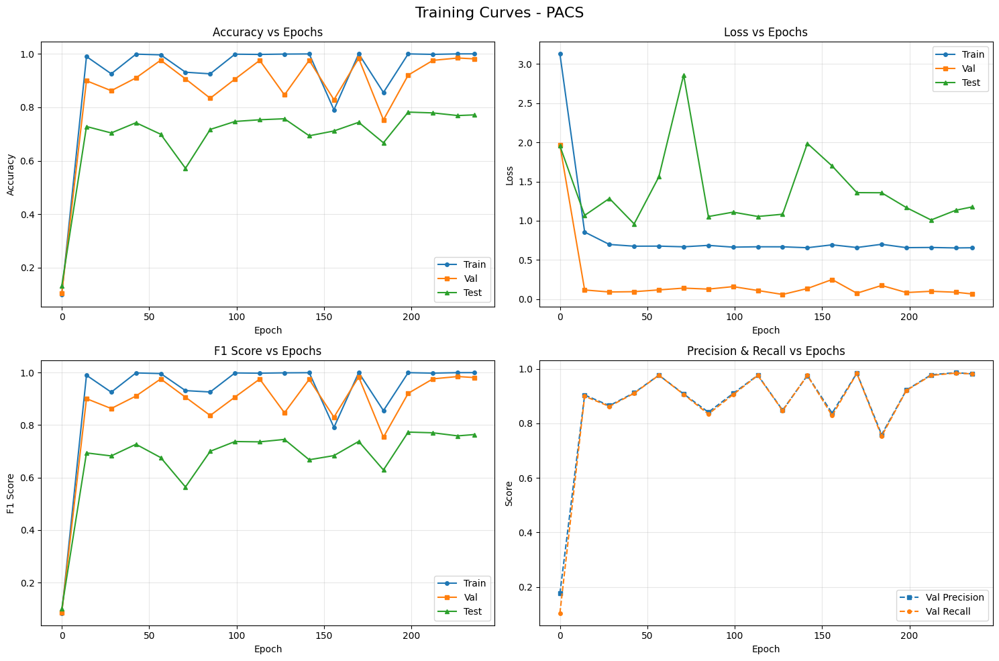

Epoch time plot saved to: /kaggle/working/experiments/third_experiment/logs/epoch_times_PACS.png


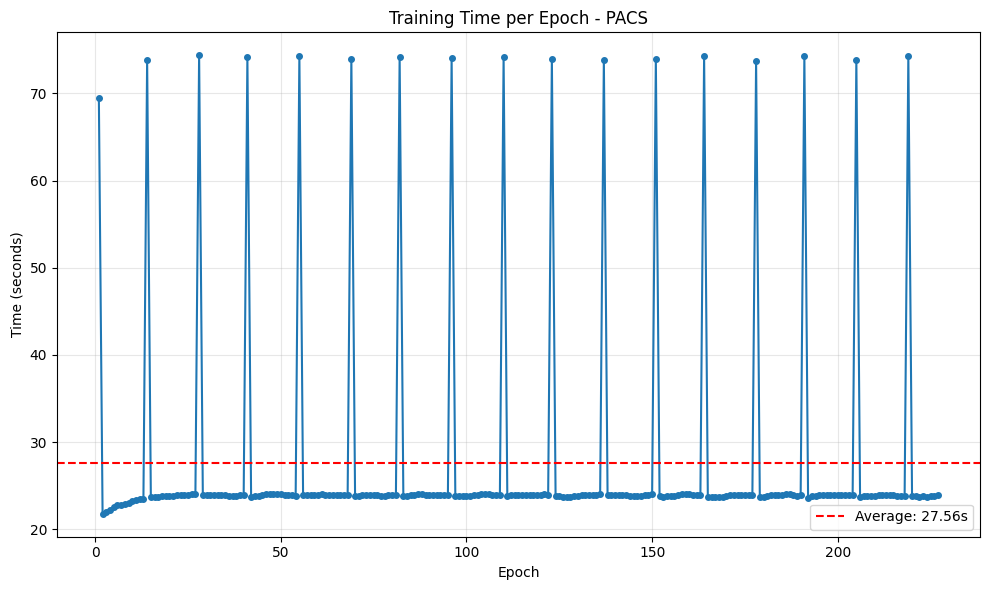


All results saved to: /kaggle/working/experiments/third_experiment/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_PACS.png
  - epoch_times_PACS.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)

✓ Experiment complete!
  Results: /kaggle/working/experiments/third_experiment/metrics_pacs.csv
  Best model: /kaggle/working/experiments/third_experiment/best_model_pacs.ckpt
  Config: /kaggle/working/experiments/third_experiment/config_pacs.json
CONFUSION MATRICES:

confusion_matrix_OTHER_env0_out.png


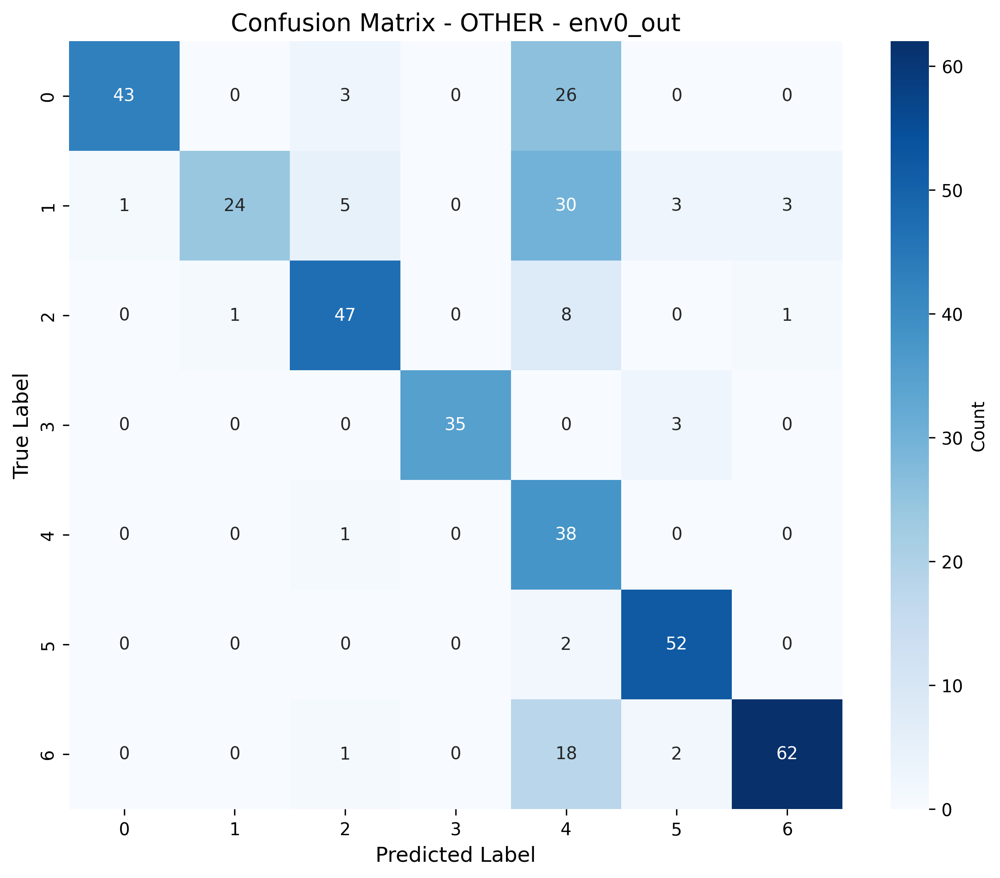


confusion_matrix_TEST_env0_in.png


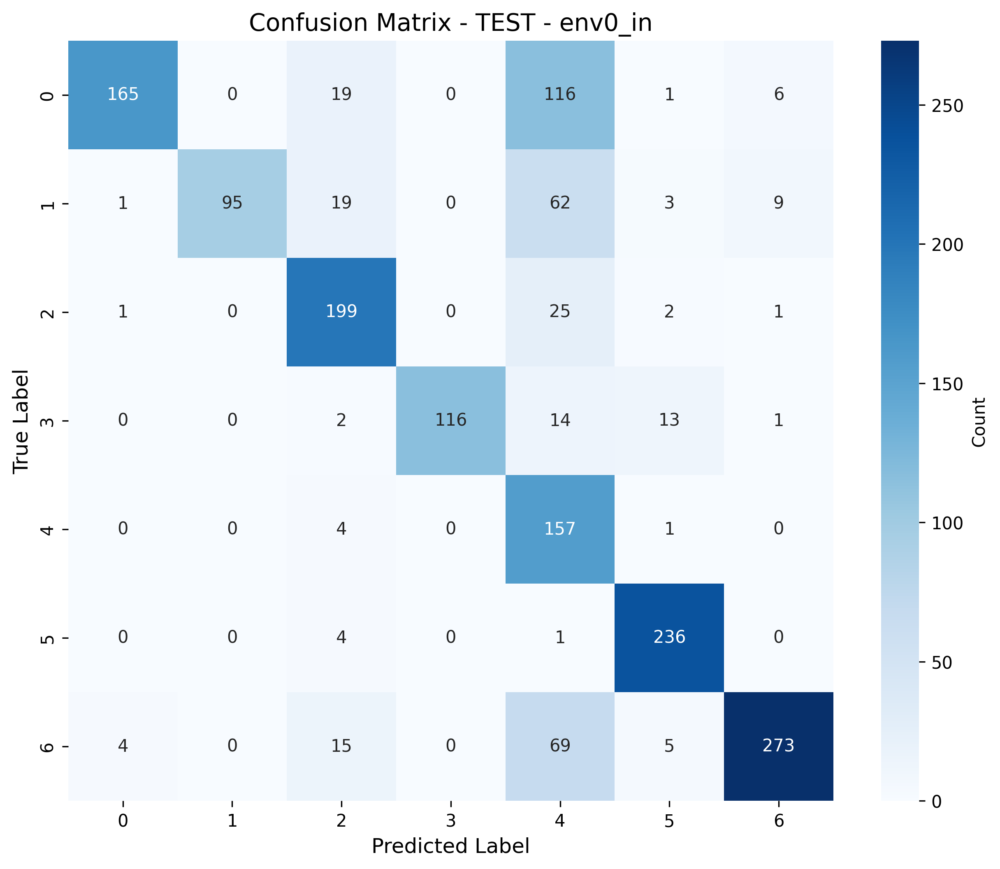


confusion_matrix_TRAIN_env1_in.png


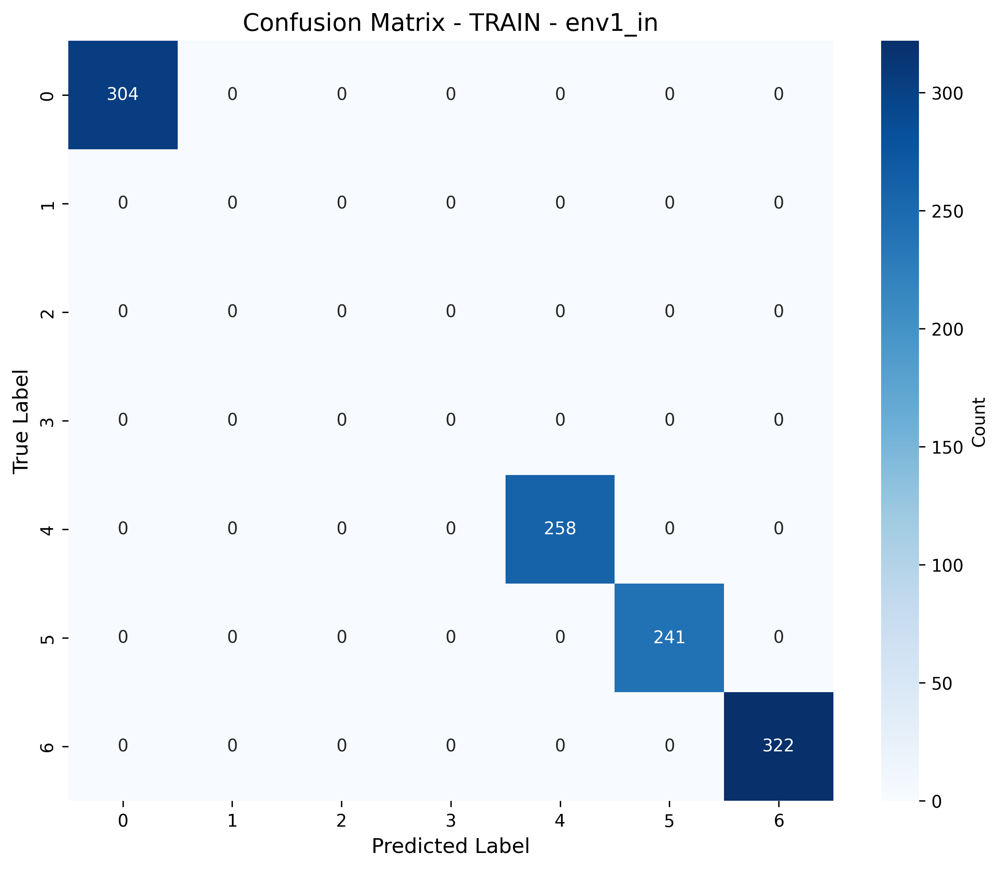


confusion_matrix_TRAIN_env2_in.png


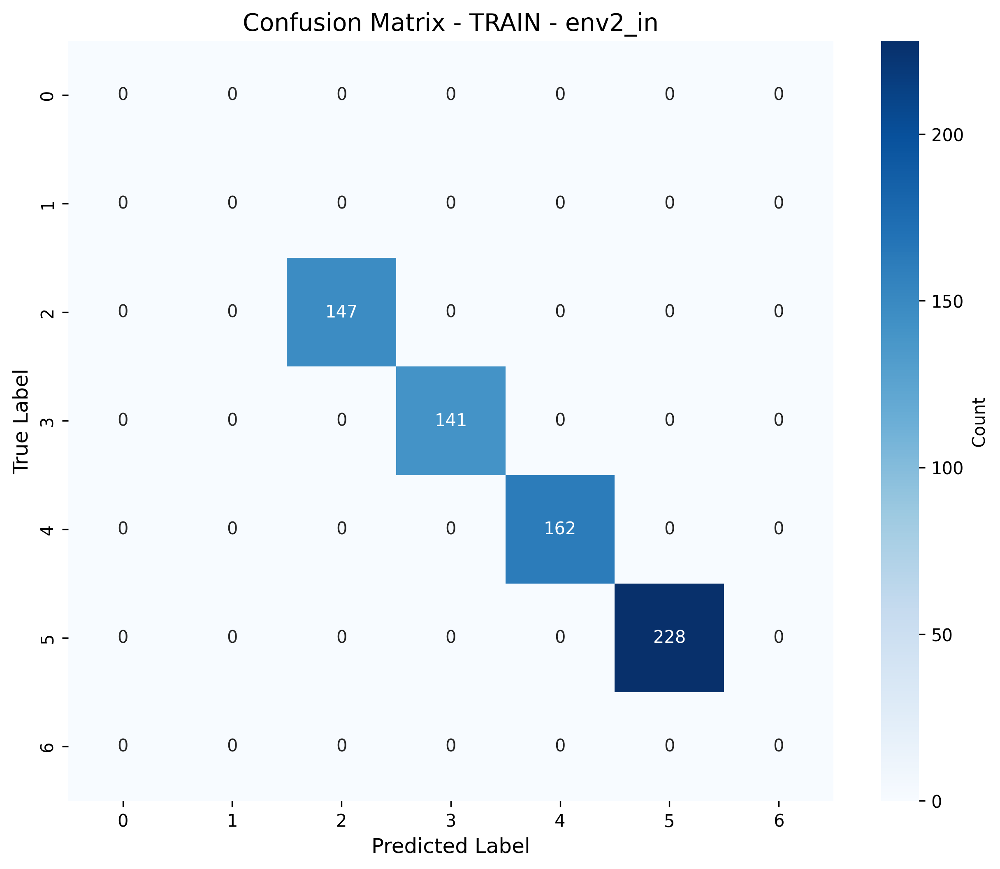


confusion_matrix_TRAIN_env3_in.png


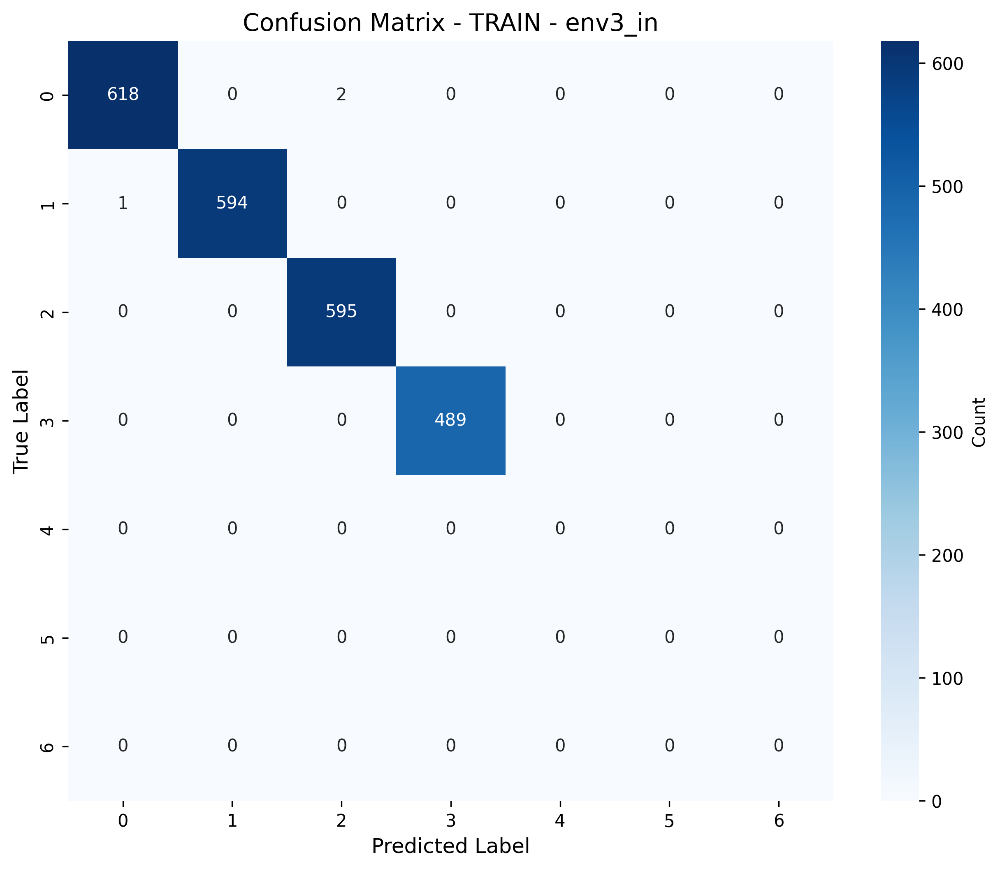


confusion_matrix_VAL_env1_out.png


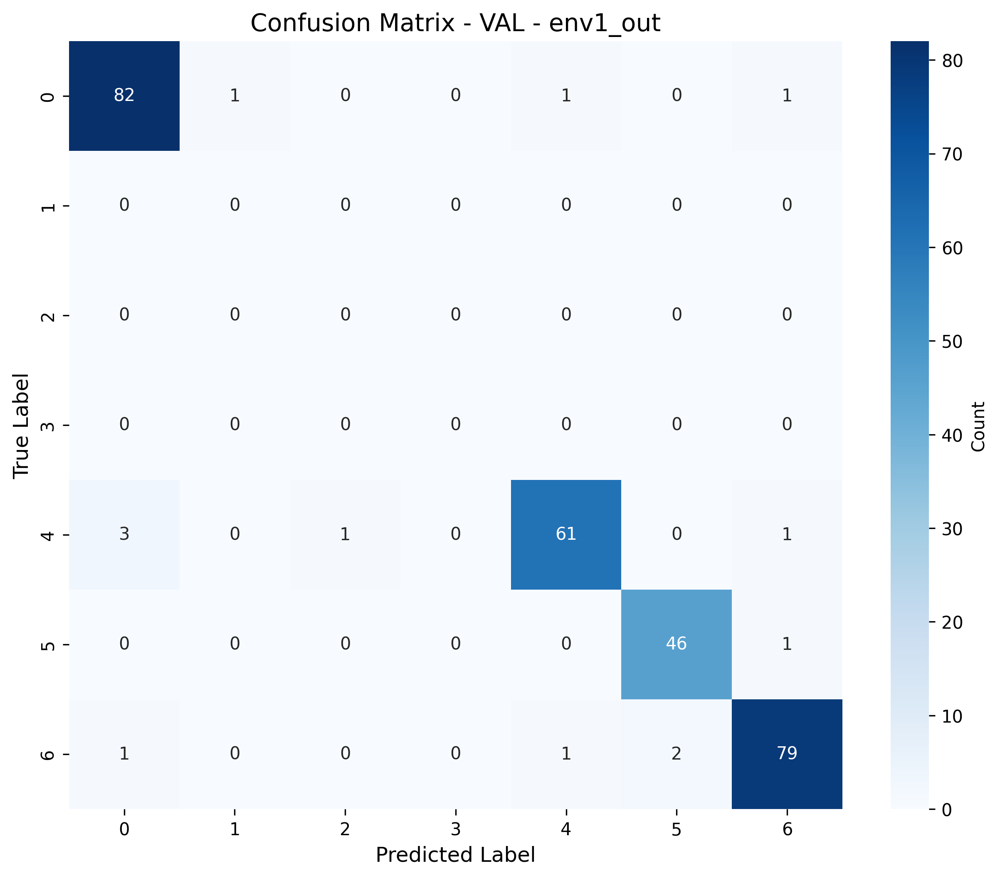


confusion_matrix_VAL_env2_out.png


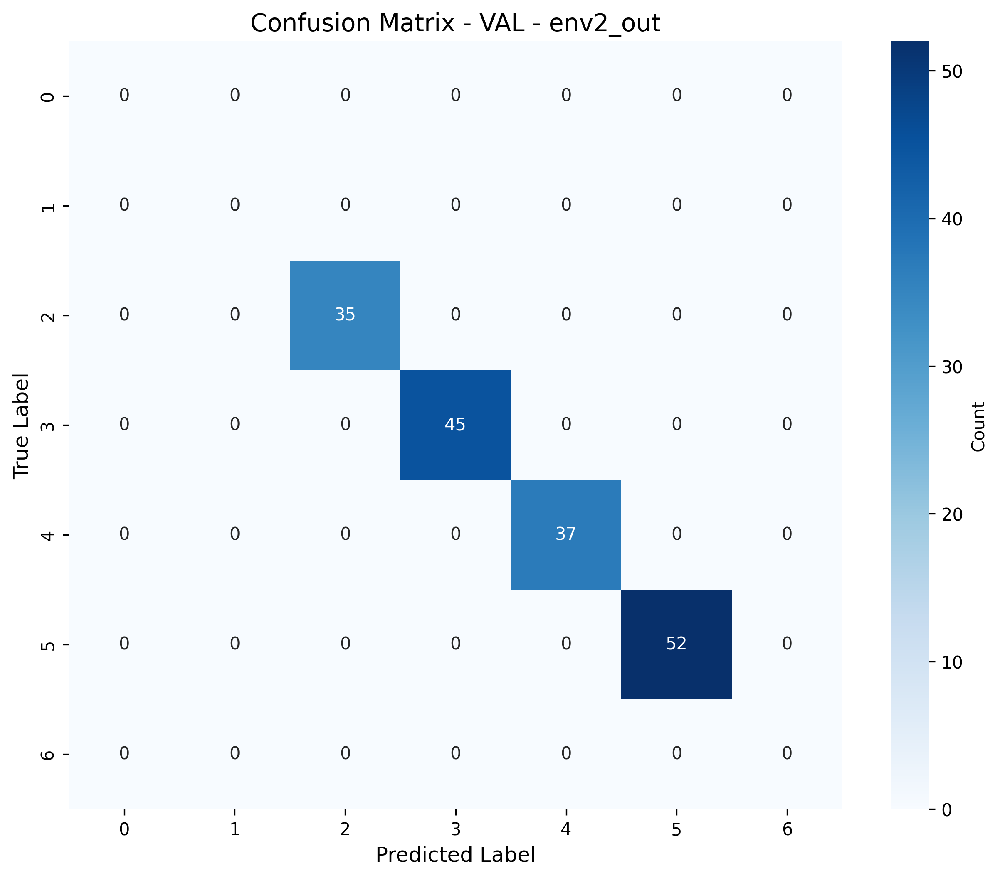


confusion_matrix_VAL_env3_out.png


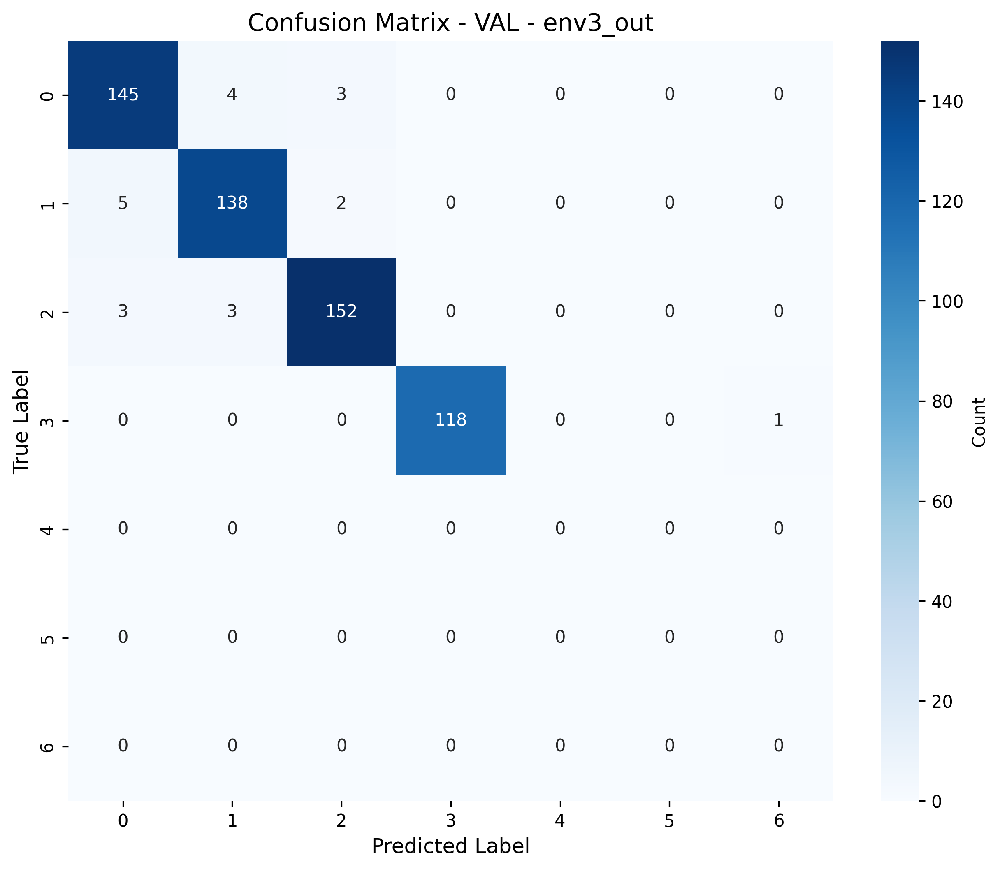



TRAINING CURVES:


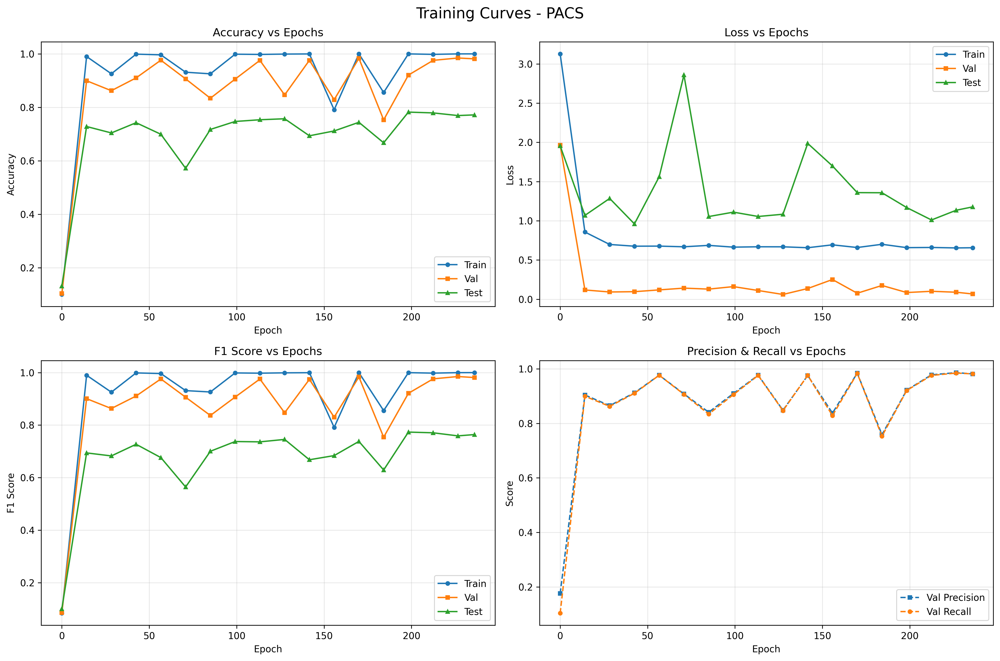

In [39]:


fit_simple(
exp_dir=str(exp_dir),
logger=logger,
seed=config.get("seed", 0),
trial_seed=config.get("trial_seed", 0),
hparams_seed=config.get("hparams_seed", 0),
algorithm_name=config["algo"],
dataset_name=dataset_name_pacs,
data_dir=config["data_dir"][dataset_name_pacs],
num_workers=config.get("num_workers", 4),
test_envs=[config["test_set_id"]],
overlap_type=config.get("overlap", "none"),
holdout_fraction=config.get("holdout_fraction", 0.2),
n_steps=config.get("n_epochs"),  # Changed to epochs!
checkpoint_freq=config.get("checkpoint_freq"),  # In epochs
model_checkpoint=config.get("model_checkpoint", {
    "metric": "val/acc",
    "maximize": True
}),
num_domain_linked_classes=config.get("num_domain_linked_classes"),
num_classes=config.get("num_classes"),
# AutoAugmentation specific
auto_augment=config.get("auto_augment", False),
augment_search_epochs=config.get("augment_search_epochs", 10),
)

logging.info(f"Experiment complete. Results saved to {exp_dir}")
print(f"\n✓ Experiment complete!")
print(f"  Results: {exp_dir / 'metrics_pacs.csv'}")
print(f"  Best model: {exp_dir / 'best_model_pacs.ckpt'}")
print(f"  Config: {exp_dir / 'config_pacs.json'}")


import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display, Image
import os

log_dir = f"/kaggle/working/experiments/{exp_name_pacs}/logs"

# Get all confusion matrix plot files
cm_files = [f for f in os.listdir(log_dir) if f.startswith('confusion_matrix_') and f.endswith('.png')]

# Display all confusion matrices
print("CONFUSION MATRICES:")
print("="*60)
for cm_file in sorted(cm_files):
    print(f"\n{cm_file}")
    display(Image(filename=os.path.join(log_dir, cm_file)))

# Display training curves
print("\n\nTRAINING CURVES:")
print("="*60)
display(Image(filename=os.path.join(log_dir, 'training_curves_PACS.png')))

# # Display epoch times
# print("\n\nEPOCH TIMES:")
# print("="*60)
# display(Image(filename=os.path.join(log_dir, 'epoch_times_PACS.png')))


## VLCS

In [40]:
output_dir = "/kaggle/working/experiments"
if not os.path.exists(output_dir):
    os.mkdir(output_dir)
exp_name_vlcs = input()
config["name"] = exp_name_vlcs

exp_name_vlcs = config["name"] or f"{config['algo']}_{config['dataset']}_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
exp_dir = Path(output_dir) / exp_name_vlcs
exp_dir.mkdir(parents=True, exist_ok=True)
log_dir = exp_dir / 'logs'
log_dir.mkdir(parents=True, exist_ok=True)
# Setup logging
config_logging()
logging.info(f"Starting experiment: {exp_name_vlcs}")
logging.info(f"Output directory: {exp_dir}")

# Save config to experiment directory
with open(exp_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)


logger = CSVLogger(log_dir / 'metrics.csv',  root_dir=log_dir)## VLCS

 third_experiment


In [41]:
dataset_name_vlcs = config["dataset"][1]
dataset_name_vlcs

'VLCS'

Seed set to 0


Model checkpoint frequency: 300


  0%|          | 0/5001 [01:57<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
step_time: 117.1802s
TRAIN:
  loss: 2.7626
  acc: 0.1473
  precision: 0.2144
  recall: 0.1473
  f1: 0.1579
  oacc: 0.1768
  nacc: 0.0294
VAL:
  loss: 1.5549
  acc: 0.1290
  precision: 0.2077
  recall: 0.1290
  f1: 0.1499
  oacc: 0.1537
  nacc: 0.0303
TEST:
  loss: 1.6702
  acc: 0.0896
  precision: 0.1119
  recall: 0.0896
  f1: 0.0899
  oacc: 0.1096
  nacc: 0.0098
OTHER:
  loss: 1.6724
  acc: 0.0921
  precision: 0.1028
  recall: 0.0921
  f1: 0.0783
  oacc: 0.1152
  nacc: 0.0000


  6%|▌         | 300/5001 [09:26<1:32:21,  1.18s/it] 


=== Step 300 (Epoch 8.82) ===
step_time: 111.3806s
TRAIN:
  loss: 1.2785
  acc: 0.5193
  precision: 0.6068
  recall: 0.5193
  f1: 0.5466
  oacc: 0.5266
  nacc: 0.3075
VAL:
  loss: 0.4476
  acc: 0.4452
  precision: 0.5686
  recall: 0.4452
  f1: 0.4752
  oacc: 0.4478
  nacc: 0.2702
TEST:
  loss: 0.6692
  acc: 0.6626
  precision: 0.7313
  recall: 0.6626
  f1: 0.6543
  oacc: 0.8013
  nacc: 0.1078
OTHER:
  loss: 0.5923
  acc: 0.7156
  precision: 0.7538
  recall: 0.7156
  f1: 0.7144
  oacc: 0.8588
  nacc: 0.1429


 12%|█▏        | 600/5001 [17:00<1:23:02,  1.13s/it] 


=== Step 600 (Epoch 17.65) ===
step_time: 111.2701s
TRAIN:
  loss: 0.9968
  acc: 0.5804
  precision: 0.6418
  recall: 0.5804
  f1: 0.6033
  oacc: 0.5806
  nacc: 0.3310
VAL:
  loss: 0.4612
  acc: 0.4955
  precision: 0.6284
  recall: 0.4955
  f1: 0.5255
  oacc: 0.4507
  nacc: 0.2980
TEST:
  loss: 1.7048
  acc: 0.6018
  precision: 0.6362
  recall: 0.6018
  f1: 0.5200
  oacc: 0.7253
  nacc: 0.1078
OTHER:
  loss: 1.6468
  acc: 0.5965
  precision: 0.6058
  recall: 0.5965
  f1: 0.5002
  oacc: 0.7218
  nacc: 0.0952


 18%|█▊        | 900/5001 [24:32<1:20:04,  1.17s/it] 


=== Step 900 (Epoch 26.47) ===
step_time: 110.9467s
TRAIN:
  loss: 0.8927
  acc: 0.7137
  precision: 0.7211
  recall: 0.7137
  f1: 0.7173
  oacc: 0.6451
  nacc: 0.3316
VAL:
  loss: 0.5838
  acc: 0.4274
  precision: 0.5529
  recall: 0.4274
  f1: 0.4592
  oacc: 0.4623
  nacc: 0.2879
TEST:
  loss: 1.2262
  acc: 0.6955
  precision: 0.7005
  recall: 0.6955
  f1: 0.6205
  oacc: 0.8473
  nacc: 0.0882
OTHER:
  loss: 0.9948
  acc: 0.6686
  precision: 0.6693
  recall: 0.6686
  f1: 0.5987
  oacc: 0.8238
  nacc: 0.0476


 24%|██▍       | 1200/5001 [32:06<1:11:05,  1.12s/it]


=== Step 1200 (Epoch 35.29) ===
step_time: 112.6268s
TRAIN:
  loss: 0.8620
  acc: 0.6981
  precision: 0.6984
  recall: 0.6981
  f1: 0.6982
  oacc: 0.6643
  nacc: 0.3333
VAL:
  loss: 0.5345
  acc: 0.4440
  precision: 0.5208
  recall: 0.4440
  f1: 0.4683
  oacc: 0.4773
  nacc: 0.3106
TEST:
  loss: 3.3107
  acc: 0.5995
  precision: 0.4890
  recall: 0.5995
  f1: 0.4671
  oacc: 0.7445
  nacc: 0.0196
OTHER:
  loss: 3.1818
  acc: 0.5687
  precision: 0.4548
  recall: 0.5687
  f1: 0.4253
  oacc: 0.7108
  nacc: 0.0000


 30%|███       | 1501/5001 [39:41<33:16:20, 34.22s/it]


=== Step 1500 (Epoch 44.12) ===
step_time: 111.3818s
TRAIN:
  loss: 0.8505
  acc: 0.7469
  precision: 0.7426
  recall: 0.7469
  f1: 0.7446
  oacc: 0.6638
  nacc: 0.3322
VAL:
  loss: 0.6086
  acc: 0.4337
  precision: 0.4970
  recall: 0.4337
  f1: 0.4552
  oacc: 0.4676
  nacc: 0.2980
TEST:
  loss: 3.8569
  acc: 0.5622
  precision: 0.5038
  recall: 0.5622
  f1: 0.4554
  oacc: 0.6586
  nacc: 0.1765
OTHER:
  loss: 3.7622
  acc: 0.5696
  precision: 0.5085
  recall: 0.5696
  f1: 0.4514
  oacc: 0.6644
  nacc: 0.1905


 36%|███▌      | 1800/5001 [47:12<1:01:09,  1.15s/it] 


=== Step 1800 (Epoch 52.94) ===
step_time: 111.0394s
TRAIN:
  loss: 0.8490
  acc: 0.8319
  precision: 0.8324
  recall: 0.8319
  f1: 0.8321
  oacc: 0.6654
  nacc: 0.3327
VAL:
  loss: 0.5641
  acc: 0.4758
  precision: 0.6158
  recall: 0.4758
  f1: 0.5111
  oacc: 0.4794
  nacc: 0.2854
TEST:
  loss: 1.8960
  acc: 0.6655
  precision: 0.5699
  recall: 0.6655
  f1: 0.5491
  oacc: 0.8196
  nacc: 0.0490
OTHER:
  loss: 1.7643
  acc: 0.6443
  precision: 0.5167
  recall: 0.6443
  f1: 0.5159
  oacc: 0.8054
  nacc: 0.0000


 42%|████▏     | 2101/5001 [54:45<27:31:30, 34.17s/it]


=== Step 2100 (Epoch 61.76) ===
step_time: 111.0822s
TRAIN:
  loss: 0.8315
  acc: 0.9121
  precision: 0.9146
  recall: 0.9121
  f1: 0.9133
  oacc: 0.6622
  nacc: 0.3333
VAL:
  loss: 0.6512
  acc: 0.4842
  precision: 0.5735
  recall: 0.4842
  f1: 0.5034
  oacc: 0.4397
  nacc: 0.2929
TEST:
  loss: 3.2115
  acc: 0.5534
  precision: 0.4850
  recall: 0.5534
  f1: 0.4397
  oacc: 0.6917
  nacc: 0.0000
OTHER:
  loss: 3.0013
  acc: 0.5864
  precision: 0.5098
  recall: 0.5864
  f1: 0.4626
  oacc: 0.7330
  nacc: 0.0000


 48%|████▊     | 2401/5001 [1:02:22<24:56:25, 34.53s/it]


=== Step 2400 (Epoch 70.59) ===
step_time: 112.1929s
TRAIN:
  loss: 0.8392
  acc: 0.8270
  precision: 0.8327
  recall: 0.8270
  f1: 0.8298
  oacc: 0.6618
  nacc: 0.3333
VAL:
  loss: 0.6221
  acc: 0.4598
  precision: 0.5430
  recall: 0.4598
  f1: 0.4821
  oacc: 0.4435
  nacc: 0.3005
TEST:
  loss: 3.2392
  acc: 0.5096
  precision: 0.4782
  recall: 0.5096
  f1: 0.4009
  oacc: 0.6149
  nacc: 0.0882
OTHER:
  loss: 3.0564
  acc: 0.5054
  precision: 0.4706
  recall: 0.5054
  f1: 0.3768
  oacc: 0.6079
  nacc: 0.0952


 54%|█████▍    | 2701/5001 [1:09:58<21:52:19, 34.23s/it]


=== Step 2700 (Epoch 79.41) ===
step_time: 111.0348s
TRAIN:
  loss: 0.8357
  acc: 0.7789
  precision: 0.7824
  recall: 0.7789
  f1: 0.7806
  oacc: 0.6612
  nacc: 0.3333
VAL:
  loss: 0.7040
  acc: 0.4211
  precision: 0.5591
  recall: 0.4211
  f1: 0.4487
  oacc: 0.4519
  nacc: 0.2980
TEST:
  loss: 3.5657
  acc: 0.5370
  precision: 0.4877
  recall: 0.5370
  f1: 0.4260
  oacc: 0.6615
  nacc: 0.0392
OTHER:
  loss: 3.4449
  acc: 0.5417
  precision: 0.4633
  recall: 0.5417
  f1: 0.4046
  oacc: 0.6771
  nacc: 0.0000


 60%|██████    | 3001/5001 [1:17:31<19:06:12, 34.39s/it]


=== Step 3000 (Epoch 88.24) ===
step_time: 111.8886s
TRAIN:
  loss: 0.8294
  acc: 0.9996
  precision: 0.9996
  recall: 0.9996
  f1: 0.9996
  oacc: 0.6664
  nacc: 0.3333
VAL:
  loss: 0.6346
  acc: 0.4788
  precision: 0.6155
  recall: 0.4788
  f1: 0.5104
  oacc: 0.4683
  nacc: 0.2955
TEST:
  loss: 4.4728
  acc: 0.5389
  precision: 0.4765
  recall: 0.5389
  f1: 0.4244
  oacc: 0.6711
  nacc: 0.0098
OTHER:
  loss: 4.3850
  acc: 0.5299
  precision: 0.4803
  recall: 0.5299
  f1: 0.4122
  oacc: 0.6623
  nacc: 0.0000


 66%|██████▌   | 3301/5001 [1:25:03<16:06:30, 34.11s/it]


=== Step 3300 (Epoch 97.06) ===
step_time: 110.9303s
TRAIN:
  loss: 0.8347
  acc: 0.8307
  precision: 0.8270
  recall: 0.8307
  f1: 0.8288
  oacc: 0.6646
  nacc: 0.3333
VAL:
  loss: 0.8169
  acc: 0.5031
  precision: 0.5813
  recall: 0.5031
  f1: 0.5338
  oacc: 0.4603
  nacc: 0.2929
TEST:
  loss: 2.4097
  acc: 0.6138
  precision: 0.5467
  recall: 0.6138
  f1: 0.5109
  oacc: 0.7403
  nacc: 0.1078
OTHER:
  loss: 2.3241
  acc: 0.6137
  precision: 0.5165
  recall: 0.6137
  f1: 0.4803
  oacc: 0.7552
  nacc: 0.0476


 72%|███████▏  | 3601/5001 [1:32:36<13:19:34, 34.27s/it]


=== Step 3600 (Epoch 105.88) ===
step_time: 111.4816s
TRAIN:
  loss: 0.8363
  acc: 0.9139
  precision: 0.9160
  recall: 0.9139
  f1: 0.9149
  oacc: 0.6645
  nacc: 0.3333
VAL:
  loss: 0.9158
  acc: 0.4511
  precision: 0.5560
  recall: 0.4511
  f1: 0.4762
  oacc: 0.4373
  nacc: 0.2879
TEST:
  loss: 2.0018
  acc: 0.6104
  precision: 0.5913
  recall: 0.6104
  f1: 0.5488
  oacc: 0.7630
  nacc: 0.0000
OTHER:
  loss: 1.8546
  acc: 0.6031
  precision: 0.5915
  recall: 0.6031
  f1: 0.5372
  oacc: 0.7539
  nacc: 0.0000


 78%|███████▊  | 3901/5001 [1:40:10<10:26:31, 34.17s/it]


=== Step 3900 (Epoch 114.71) ===
step_time: 111.1628s
TRAIN:
  loss: 0.8652
  acc: 0.7695
  precision: 0.7782
  recall: 0.7695
  f1: 0.7738
  oacc: 0.6506
  nacc: 0.3333
VAL:
  loss: 0.6976
  acc: 0.4049
  precision: 0.4676
  recall: 0.4049
  f1: 0.4269
  oacc: 0.4279
  nacc: 0.3131
TEST:
  loss: 4.3222
  acc: 0.5205
  precision: 0.4819
  recall: 0.5205
  f1: 0.4276
  oacc: 0.6115
  nacc: 0.1569
OTHER:
  loss: 4.3796
  acc: 0.5402
  precision: 0.4455
  recall: 0.5402
  f1: 0.4105
  oacc: 0.6633
  nacc: 0.0476


 84%|████████▍ | 4200/5001 [1:47:36<15:01,  1.13s/it]   


=== Step 4200 (Epoch 123.53) ===
step_time: 110.3706s
TRAIN:
  loss: 0.8310
  acc: 0.9165
  precision: 0.9166
  recall: 0.9165
  f1: 0.9165
  oacc: 0.6665
  nacc: 0.3333
VAL:
  loss: 0.8022
  acc: 0.4507
  precision: 0.5582
  recall: 0.4507
  f1: 0.4835
  oacc: 0.4883
  nacc: 0.3005
TEST:
  loss: 4.9843
  acc: 0.5898
  precision: 0.5367
  recall: 0.5898
  f1: 0.4758
  oacc: 0.7054
  nacc: 0.1275
OTHER:
  loss: 4.8978
  acc: 0.5831
  precision: 0.5652
  recall: 0.5831
  f1: 0.4575
  oacc: 0.7050
  nacc: 0.0952


 90%|█████████ | 4501/5001 [1:55:04<4:44:14, 34.11s/it]


=== Step 4500 (Epoch 132.35) ===
step_time: 110.9908s
TRAIN:
  loss: 0.8213
  acc: 0.8290
  precision: 0.8329
  recall: 0.8290
  f1: 0.8309
  oacc: 0.6632
  nacc: 0.3333
VAL:
  loss: 0.8648
  acc: 0.5036
  precision: 0.6020
  recall: 0.5036
  f1: 0.5349
  oacc: 0.4559
  nacc: 0.3056
TEST:
  loss: 3.2983
  acc: 0.6445
  precision: 0.6735
  recall: 0.6445
  f1: 0.5838
  oacc: 0.7198
  nacc: 0.3431
OTHER:
  loss: 2.9881
  acc: 0.6119
  precision: 0.6230
  recall: 0.6119
  f1: 0.5286
  oacc: 0.7173
  nacc: 0.1905


 96%|█████████▌| 4801/5001 [2:02:32<1:53:46, 34.13s/it]


=== Step 4800 (Epoch 141.18) ===
step_time: 111.0298s
TRAIN:
  loss: 0.8323
  acc: 0.8314
  precision: 0.8328
  recall: 0.8314
  f1: 0.8321
  oacc: 0.6655
  nacc: 0.3310
VAL:
  loss: 0.9667
  acc: 0.4404
  precision: 0.5696
  recall: 0.4404
  f1: 0.4759
  oacc: 0.4469
  nacc: 0.2601
TEST:
  loss: 2.9732
  acc: 0.6071
  precision: 0.6743
  recall: 0.6071
  f1: 0.5483
  oacc: 0.6903
  nacc: 0.2745
OTHER:
  loss: 2.8982
  acc: 0.5881
  precision: 0.5639
  recall: 0.5881
  f1: 0.4891
  oacc: 0.6994
  nacc: 0.1429


100%|██████████| 5001/5001 [2:08:10<00:00,  1.54s/it]  



=== Step 5000 (Epoch 147.06) ===
step_time: 111.0795s
TRAIN:
  loss: 0.8408
  acc: 0.9130
  precision: 0.9143
  recall: 0.9130
  f1: 0.9136
  oacc: 0.6635
  nacc: 0.3333
VAL:
  loss: 0.8302
  acc: 0.4531
  precision: 0.5377
  recall: 0.4531
  f1: 0.4766
  oacc: 0.4524
  nacc: 0.2955
TEST:
  loss: 3.6620
  acc: 0.6221
  precision: 0.5953
  recall: 0.6221
  f1: 0.5275
  oacc: 0.7286
  nacc: 0.1961
OTHER:
  loss: 3.5064
  acc: 0.5986
  precision: 0.5135
  recall: 0.5986
  f1: 0.4741
  oacc: 0.7482
  nacc: 0.0000

TRAINING COMPLETED
Total training time: 7690.88s (128.18 minutes)
Average time per epoch: 51.55s
Total epochs: 147


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 3.6130
  Accuracy: 0.6221, Precision: 0.5953, Recall: 0.6221, F1: 0.5275
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0_in.png


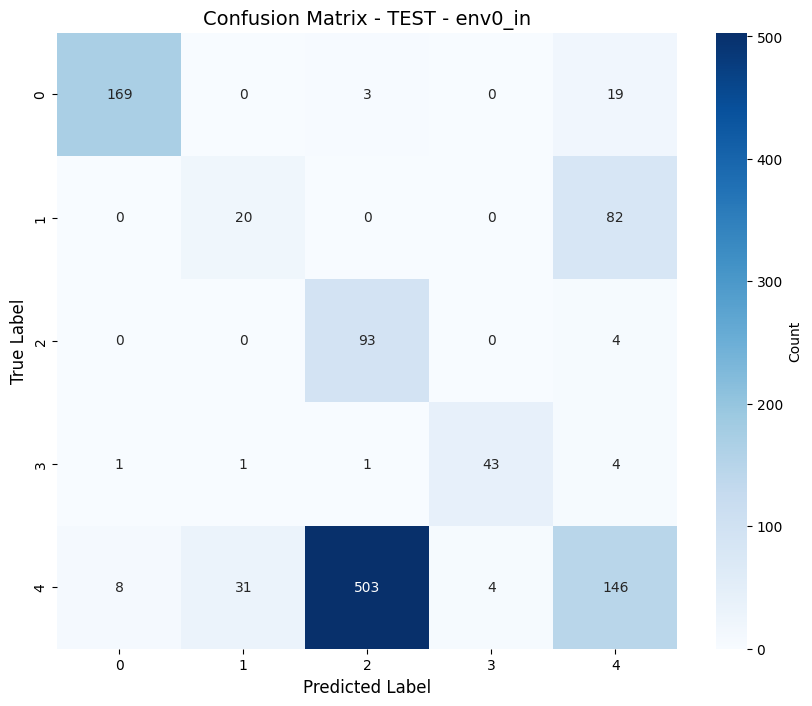


TRAIN - env1_in:
  Loss: 0.0060
  Accuracy: 0.5963, Precision: 0.5998, Recall: 0.5963, F1: 0.5980
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.png


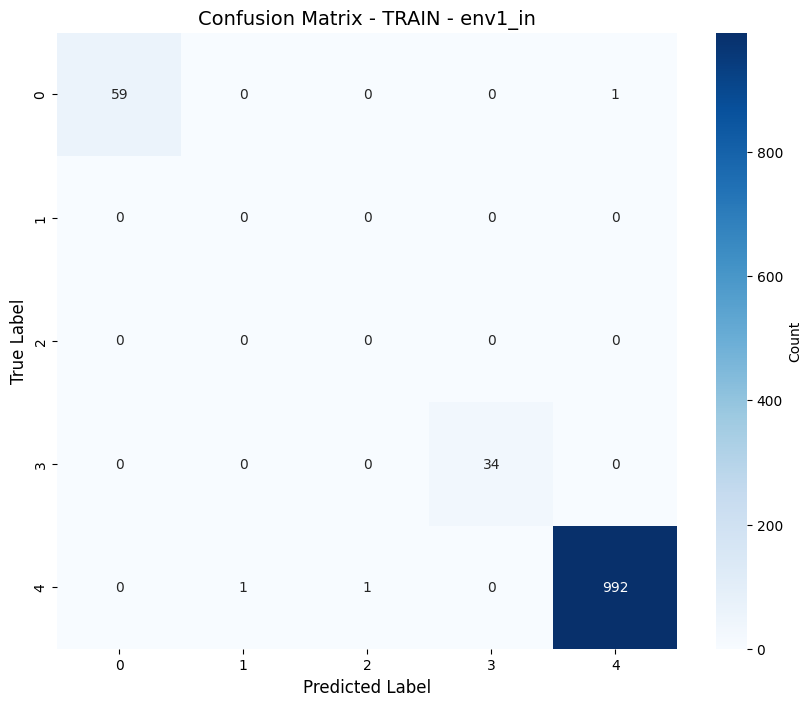


TRAIN - env2_in:
  Loss: 0.0301
  Accuracy: 0.9927, Precision: 0.9914, Recall: 0.9927, F1: 0.9920
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.png


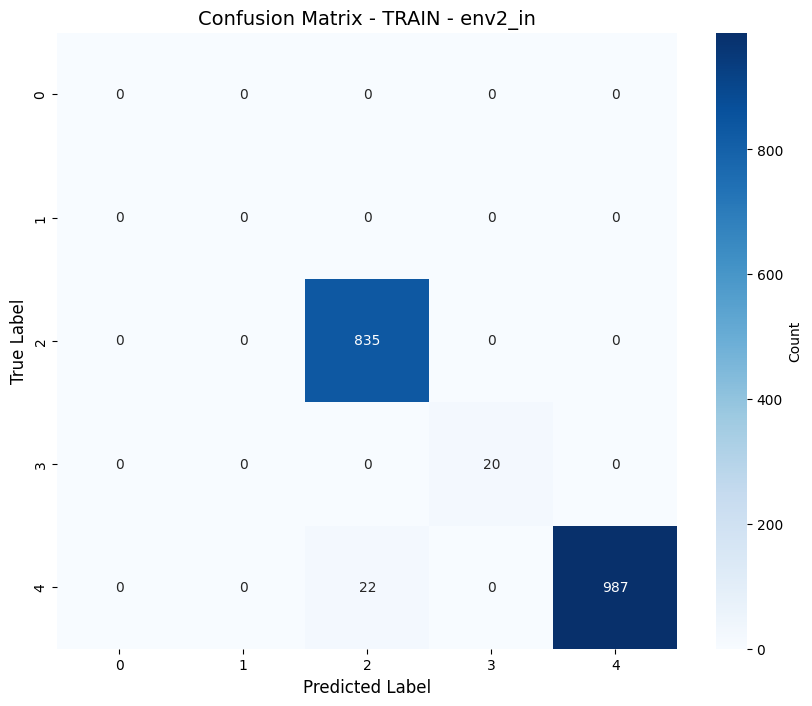


TRAIN - env3_in:
  Loss: 0.0023
  Accuracy: 0.9994, Precision: 0.9990, Recall: 0.9994, F1: 0.9992
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.png


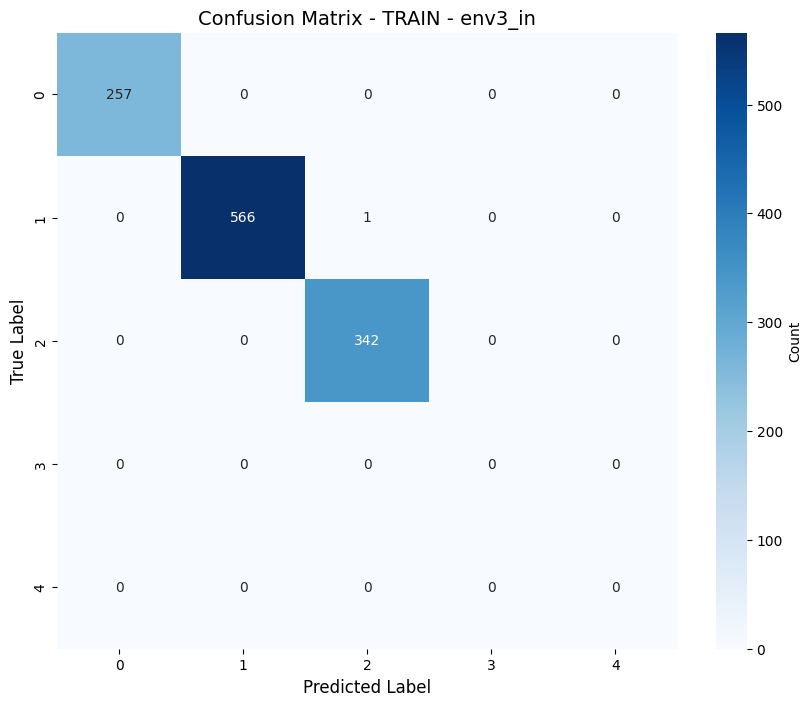


OTHER - env0_out:
  Loss: 3.4874
  Accuracy: 0.5986, Precision: 0.5135, Recall: 0.5986, F1: 0.4741
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.png


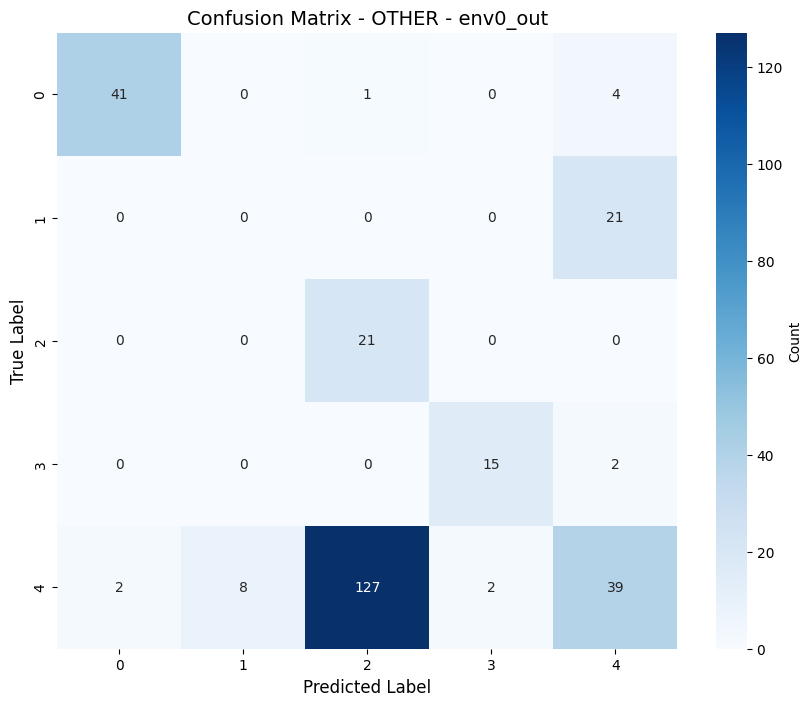


VAL - env1_out:
  Loss: 0.6138
  Accuracy: 0.3418, Precision: 0.3785, Recall: 0.3418, F1: 0.3580
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.png


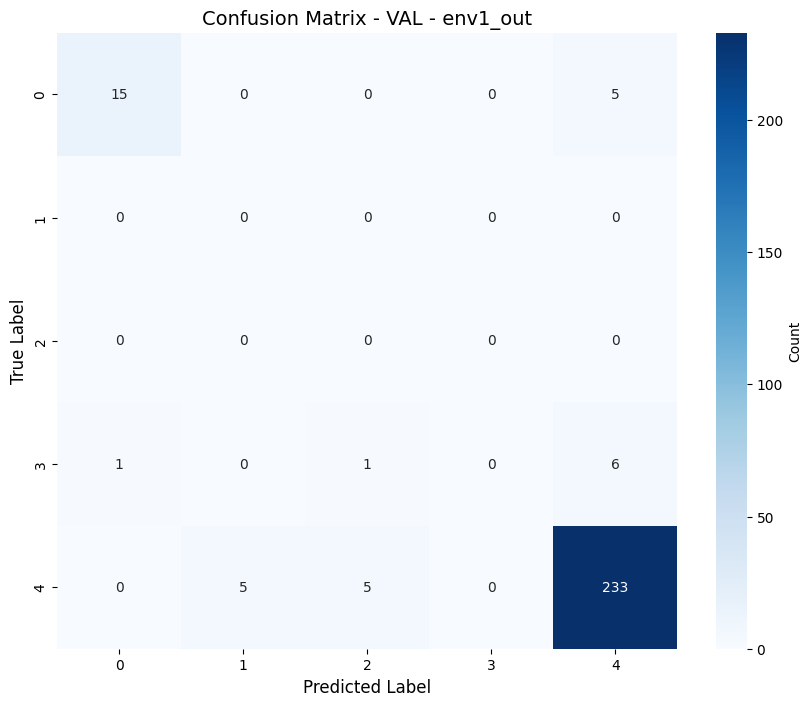


VAL - env2_out:
  Loss: 1.2465
  Accuracy: 0.4879, Precision: 0.6609, Recall: 0.4879, F1: 0.5228
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.png


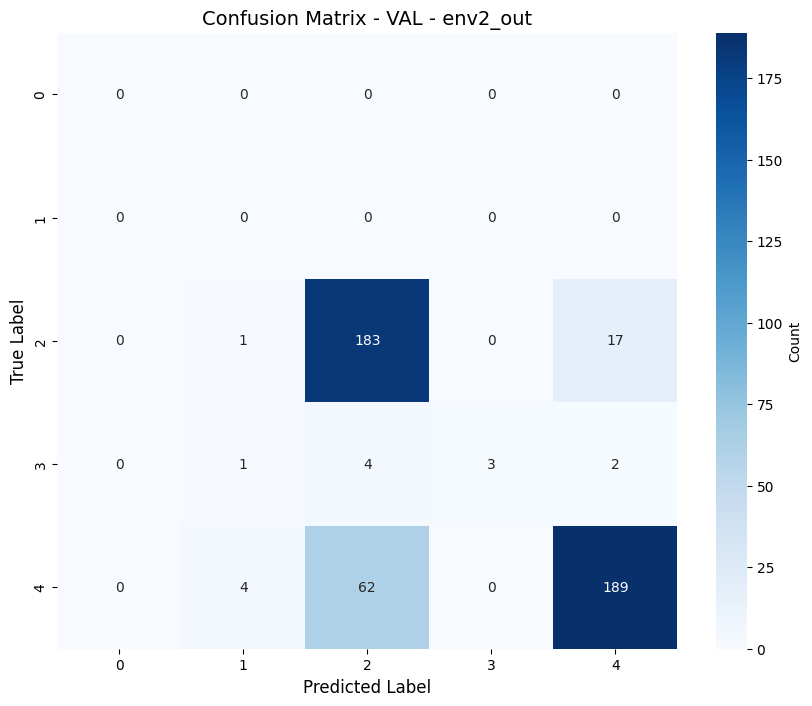


VAL - env3_out:
  Loss: 0.5689
  Accuracy: 0.5357, Precision: 0.5811, Recall: 0.5357, F1: 0.5567
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.png


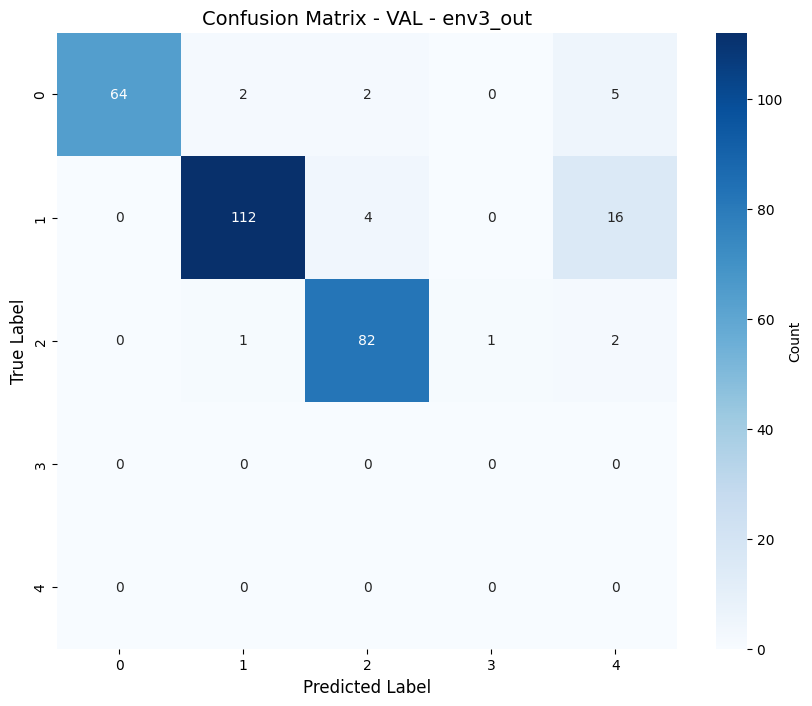


Training curves saved to: /kaggle/working/experiments/third_experiment/logs/training_curves_VLCS.png


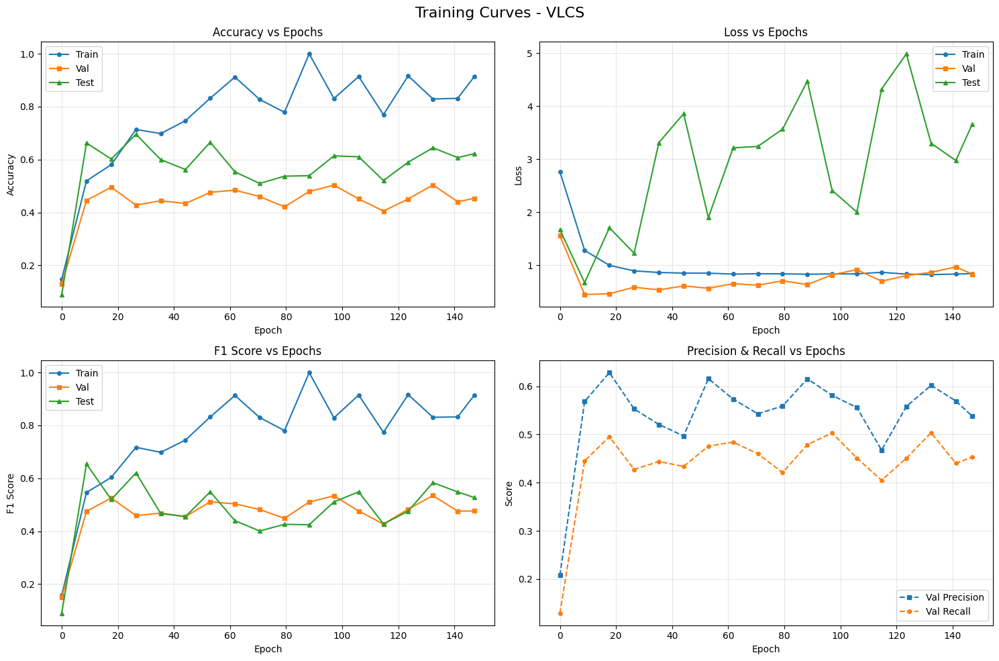

Epoch time plot saved to: /kaggle/working/experiments/third_experiment/logs/epoch_times_VLCS.png


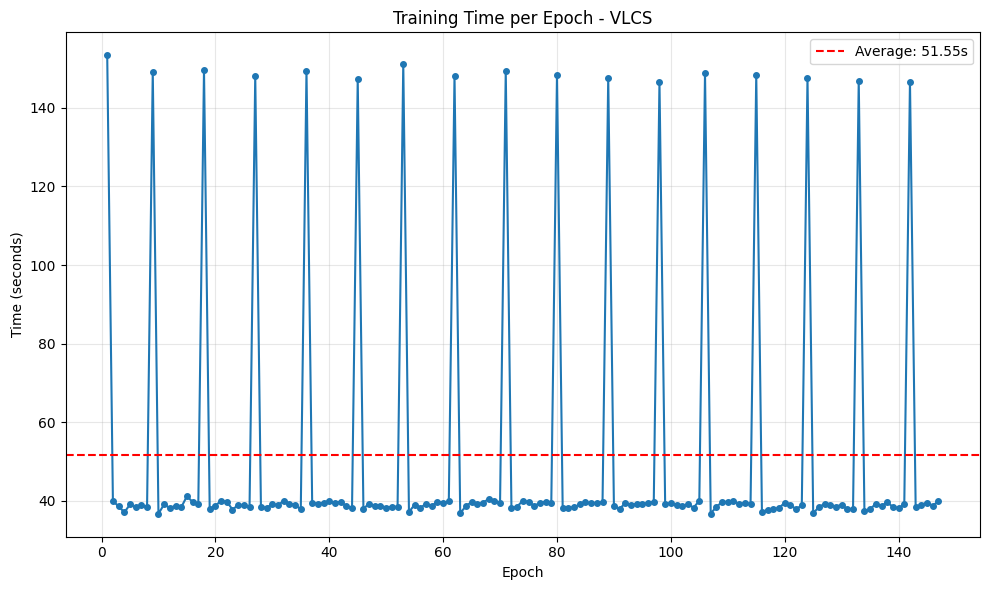


All results saved to: /kaggle/working/experiments/third_experiment/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_VLCS.png
  - epoch_times_VLCS.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)

✓ Experiment complete!
  Results: /kaggle/working/experiments/third_experiment/metrics_vlcs.csv
  Best model: /kaggle/working/experiments/third_experiment/best_model_vlcs.ckpt
  Config: /kaggle/working/experiments/third_experiment/config_vlcs.json
CONFUSION MATRICES:

confusion_matrix_OTHER_env0_out.png


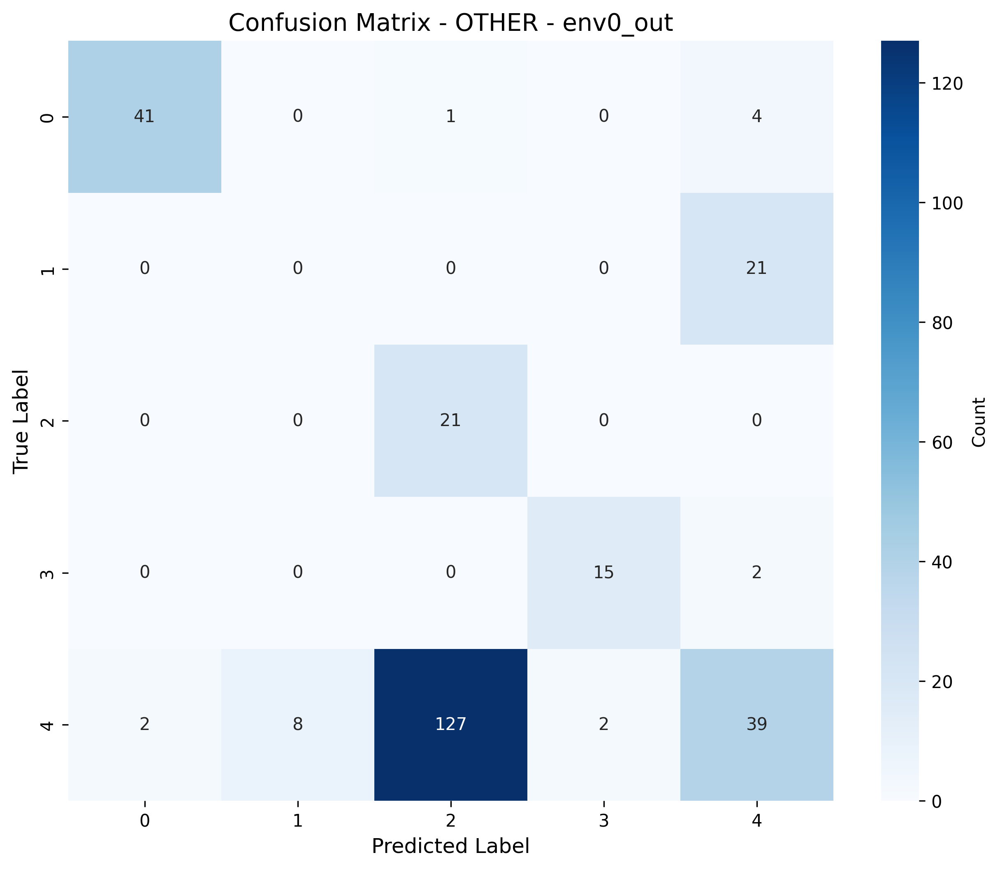


confusion_matrix_TEST_env0_in.png


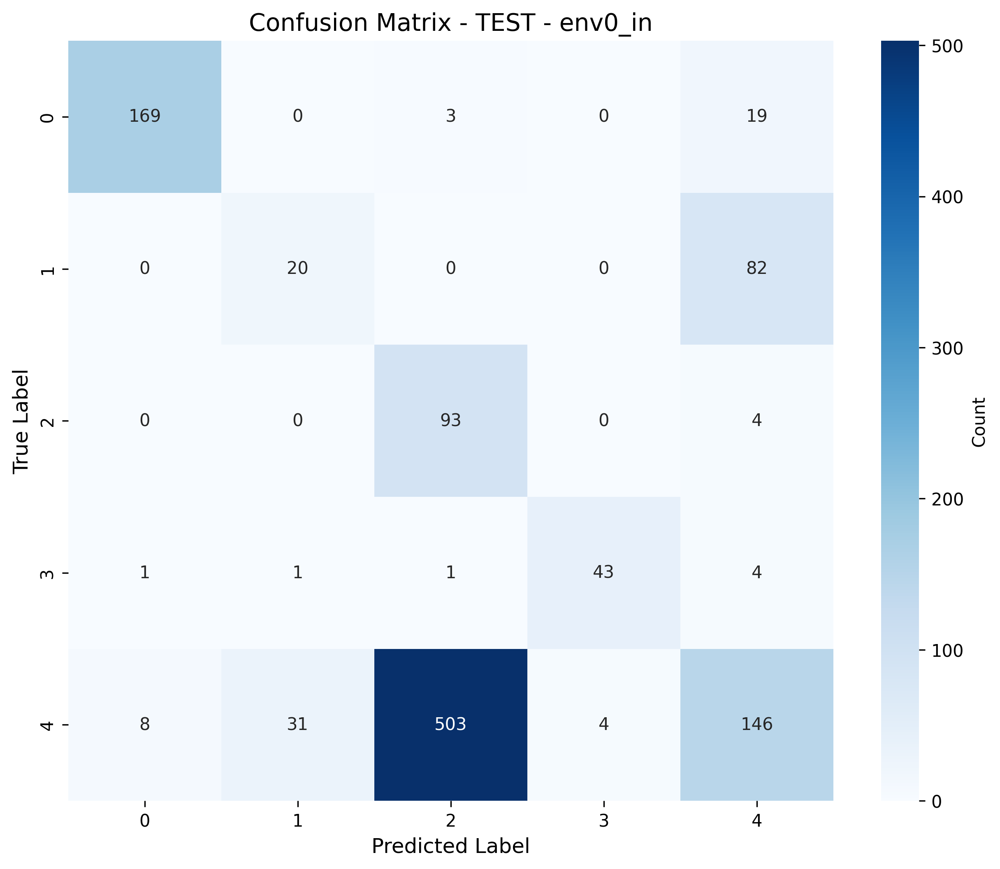


confusion_matrix_TRAIN_env1_in.png


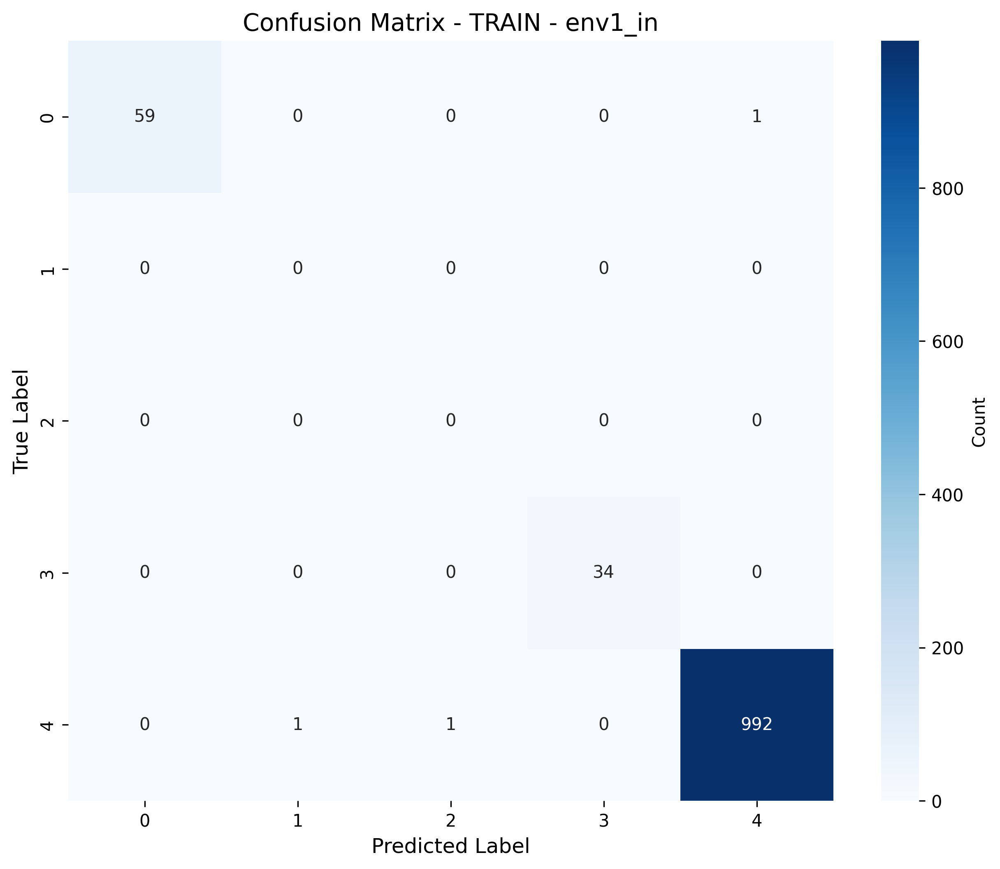


confusion_matrix_TRAIN_env2_in.png


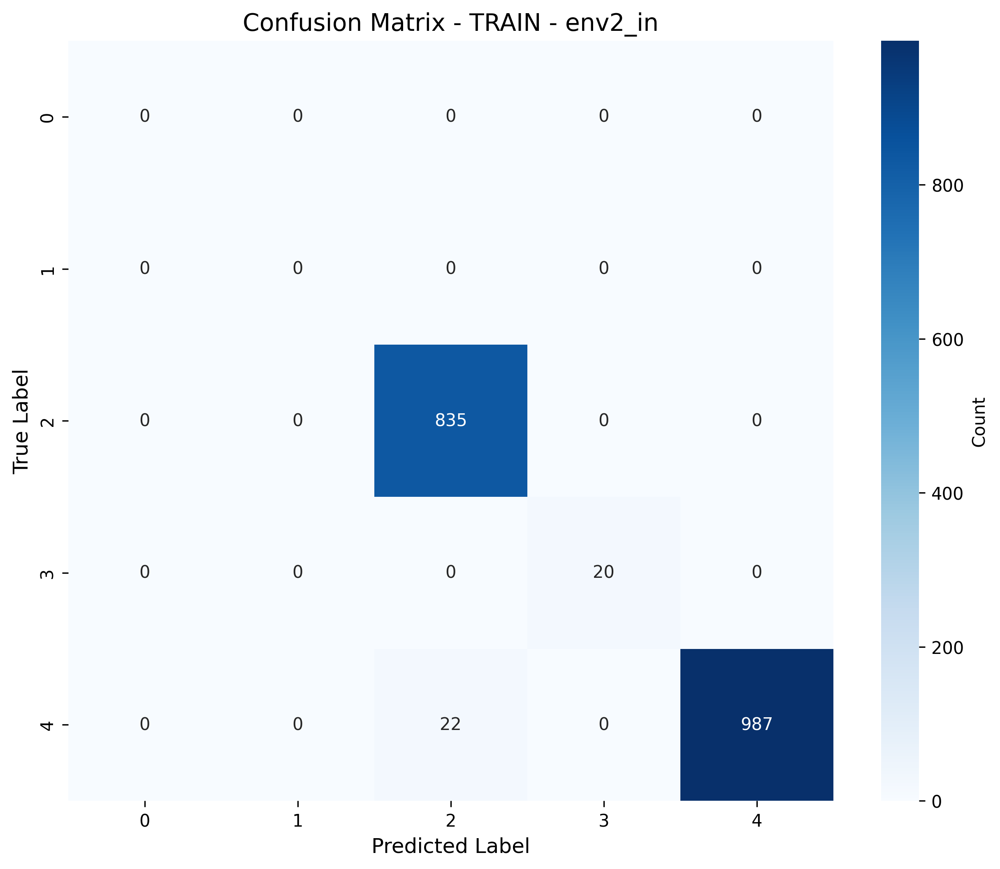


confusion_matrix_TRAIN_env3_in.png


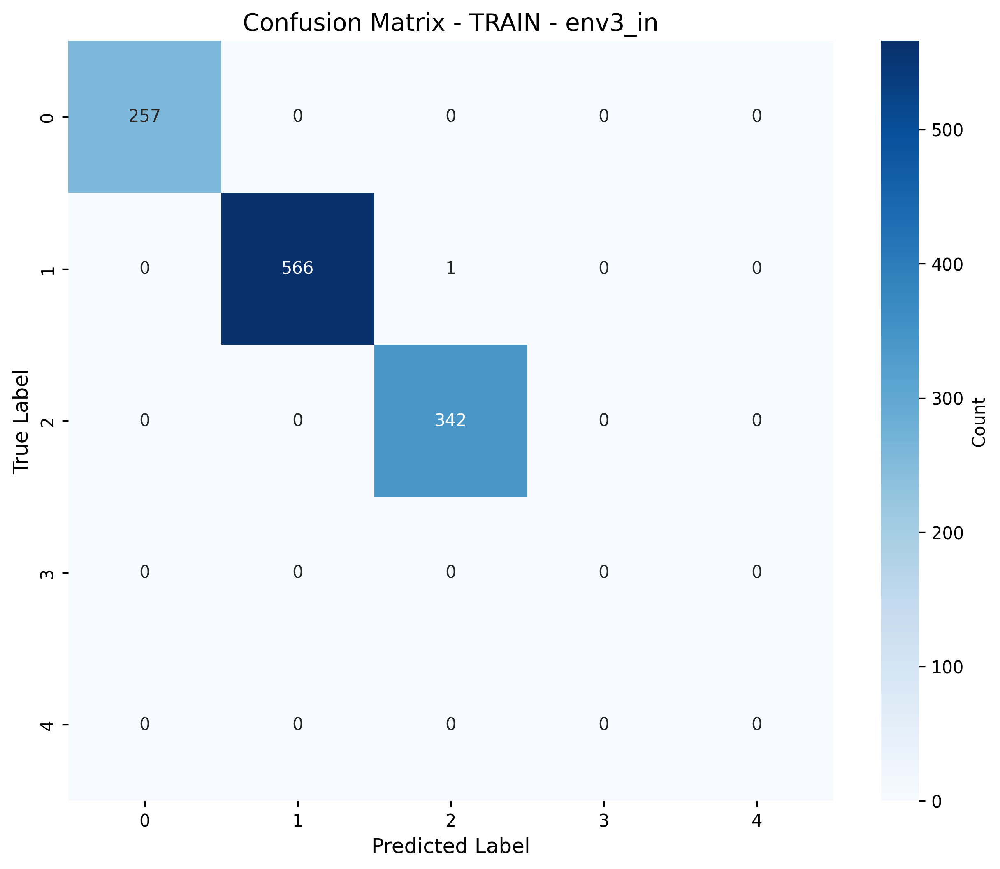


confusion_matrix_VAL_env1_out.png


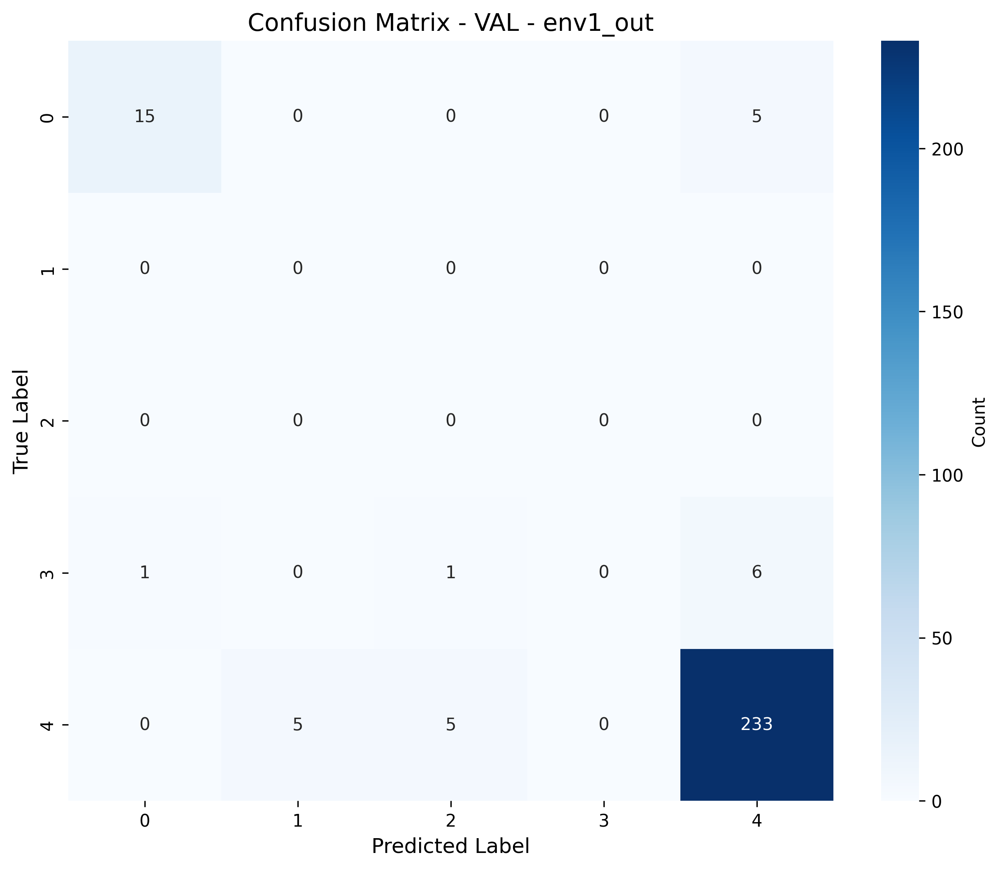


confusion_matrix_VAL_env2_out.png


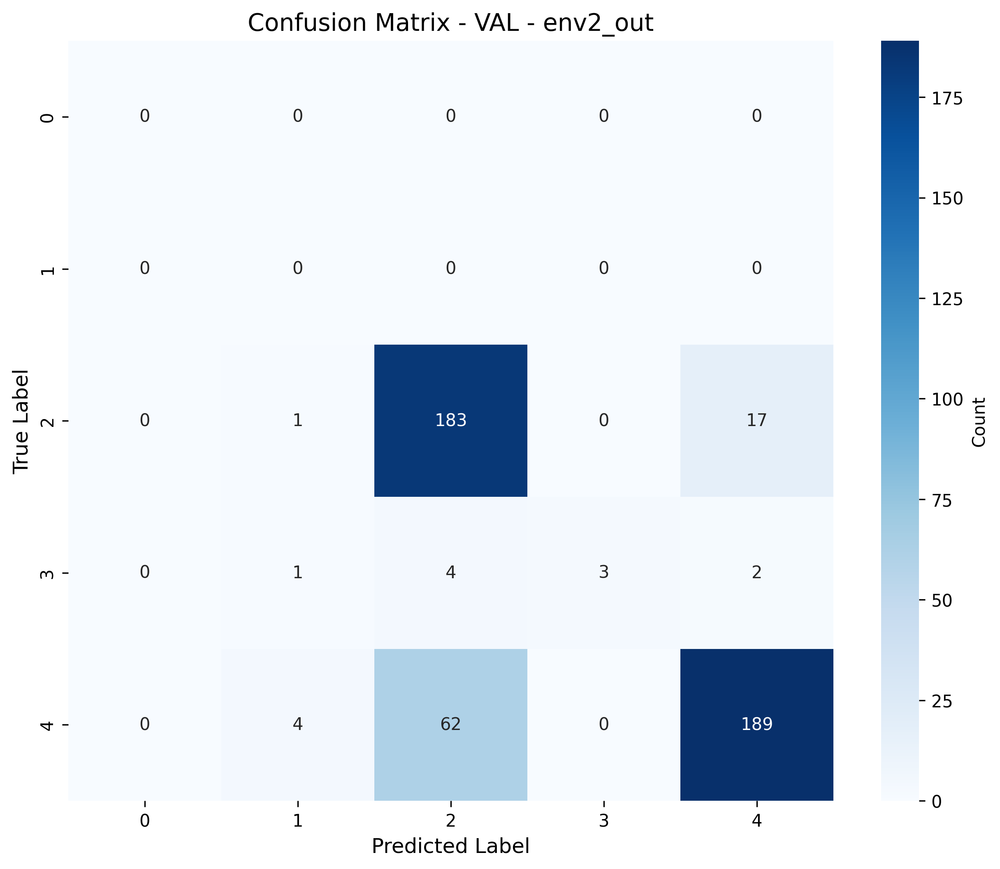


confusion_matrix_VAL_env3_out.png


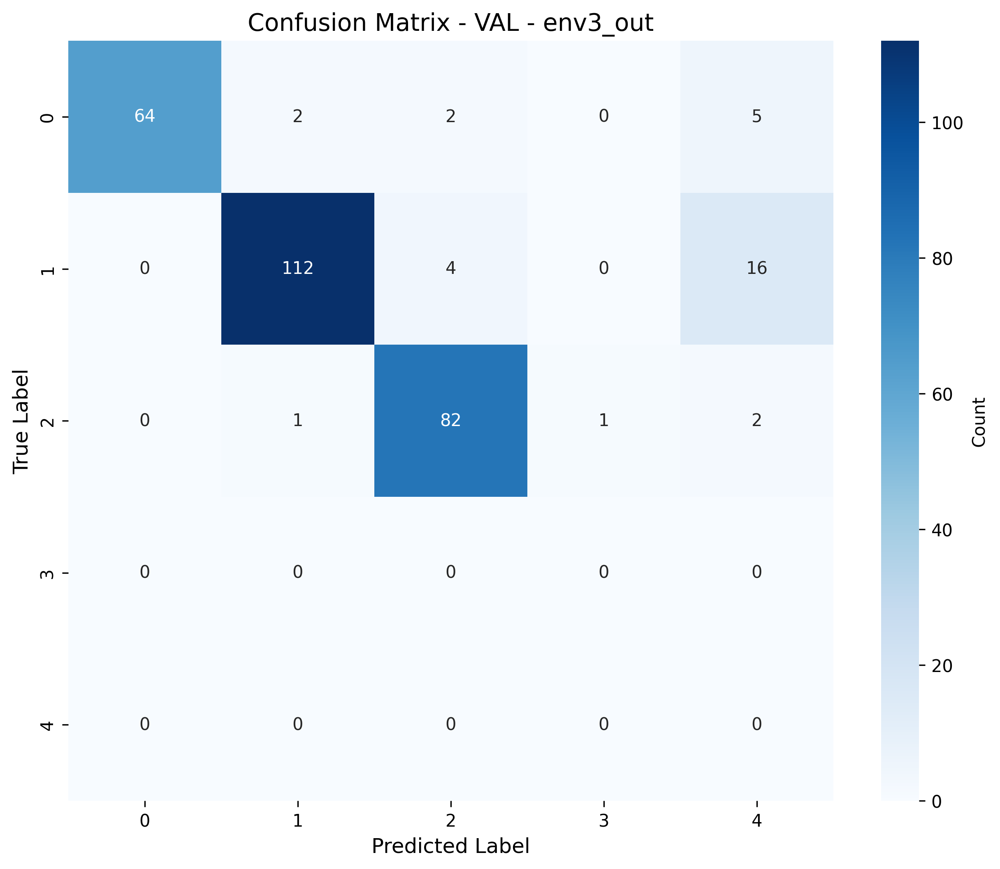



TRAINING CURVES:


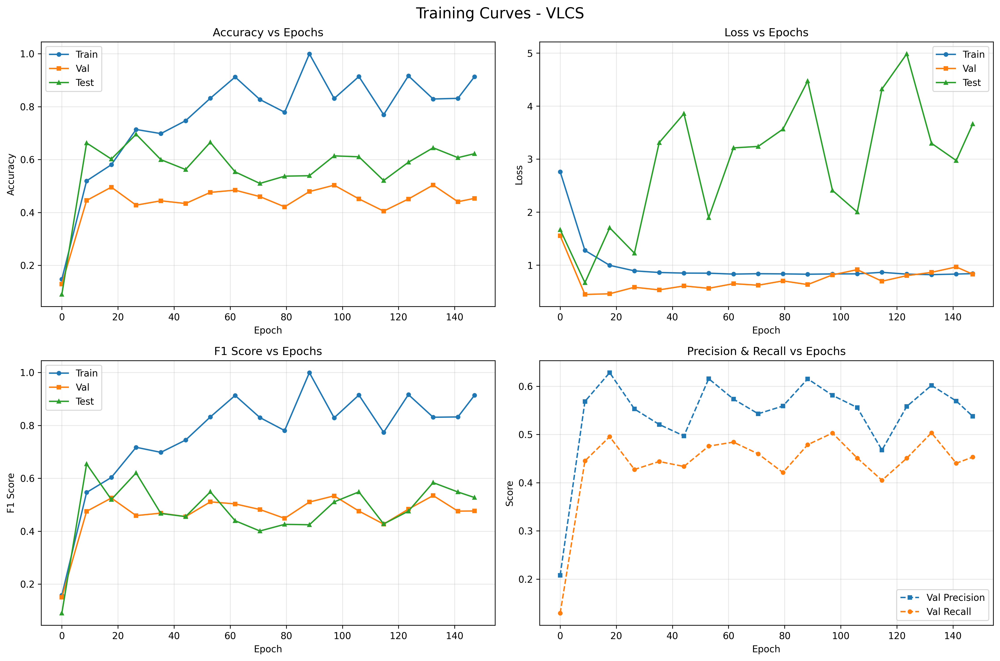

In [42]:


fit_simple(
exp_dir=str(exp_dir),
logger=logger,
seed=config.get("seed", 0),
trial_seed=config.get("trial_seed", 0),
hparams_seed=config.get("hparams_seed", 0),
algorithm_name=config["algo"],
dataset_name=dataset_name_vlcs,
data_dir=config["data_dir"][dataset_name_vlcs],
num_workers=config.get("num_workers", 4),
test_envs=[config["test_set_id"]],
overlap_type=config.get("overlap", "none"),
holdout_fraction=config.get("holdout_fraction", 0.2),
n_steps=config.get("n_epochs"),  # Changed to epochs!
checkpoint_freq=config.get("checkpoint_freq"),  # In epochs
model_checkpoint=config.get("model_checkpoint", {
    "metric": "val/acc",
    "maximize": True
}),
num_domain_linked_classes=config.get("num_domain_linked_classes"),
num_classes=config.get("num_classes"),
# AutoAugmentation specific
auto_augment=config.get("auto_augment", False),
augment_search_epochs=config.get("augment_search_epochs", 10),
)

logging.info(f"Experiment complete. Results saved to {exp_dir}")
print(f"\n✓ Experiment complete!")
print(f"  Results: {exp_dir / 'metrics_vlcs.csv'}")
print(f"  Best model: {exp_dir / 'best_model_vlcs.ckpt'}")
print(f"  Config: {exp_dir / 'config_vlcs.json'}")



import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display, Image
import os

log_dir = f"/kaggle/working/experiments/{exp_name_vlcs}/logs"

# Get all confusion matrix plot files
cm_files = [f for f in os.listdir(log_dir) if f.startswith('confusion_matrix_') and f.endswith('.png')]

# Display all confusion matrices
print("CONFUSION MATRICES:")
print("="*60)
for cm_file in sorted(cm_files):
    print(f"\n{cm_file}")
    display(Image(filename=os.path.join(log_dir, cm_file)))

# Display training curves
print("\n\nTRAINING CURVES:")
print("="*60)
display(Image(filename=os.path.join(log_dir, 'training_curves_VLCS.png')))


# DADA Train

# OfficeHome

In [28]:
config = {
    "data_dir": {
        "OfficeHome": "/kaggle/input/officehome",
        "VLCS": "/kaggle/input/vlcsdataset",
        "PACS": "/kaggle/input/pacs-dataset",
    },

    "algo": "ERM",
    "seed": 0,
    "trial_seed": 0,
    "hparams_seed": 0,
    "num_workers": 4,
    "test_set_id": 0,
    "num_classes": 65,   # OfficeHome
    "n_epochs": 5001,
    "auto_augment": True,
}

Seed set to 0


DEBUG: overlap_type=100
DEBUG: domain_class_filter=[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]]
DEBUG: len(domain_class_filter)=3
DEBUG: test_envs=[0]
num_envs=4, num_filters=3, domain_class_filter=[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:02<00:00, 20.0MB/s]


Model checkpoint frequency: 300


  0%|          | 0/5001 [03:18<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
step_time: 198.2459s
TRAIN:
  loss: 4.3317
  acc: 0.0105
  precision: 0.0075
  recall: 0.0105
  f1: 0.0050
  oacc: 0.0105
  nacc: -1.0000
VAL:
  loss: 4.3158
  acc: 0.0132
  precision: 0.0107
  recall: 0.0132
  f1: 0.0073
  oacc: 0.0132
  nacc: -1.0000
TEST:
  loss: 4.3886
  acc: 0.0121
  precision: 0.0043
  recall: 0.0121
  f1: 0.0055
  oacc: 0.0121
  nacc: -1.0000
OTHER:
  loss: 4.3253
  acc: 0.0044
  precision: 0.0009
  recall: 0.0044
  f1: 0.0014
  oacc: 0.0044
  nacc: -1.0000


  6%|▌         | 300/5001 [09:25<55:48,  1.40it/s]   


=== Step 300 (Epoch 4.94) ===
step_time: 180.2140s
TRAIN:
  loss: 0.9072
  acc: 0.7845
  precision: 0.8180
  recall: 0.7845
  f1: 0.7856
  oacc: 0.7845
  nacc: -1.0000
VAL:
  loss: 1.1200
  acc: 0.6779
  precision: 0.7105
  recall: 0.6779
  f1: 0.6669
  oacc: 0.6779
  nacc: -1.0000
TEST:
  loss: 2.4659
  acc: 0.4295
  precision: 0.5401
  recall: 0.4295
  f1: 0.4263
  oacc: 0.4295
  nacc: -1.0000
OTHER:
  loss: 2.4272
  acc: 0.3596
  precision: 0.4620
  recall: 0.3596
  f1: 0.3602
  oacc: 0.3596
  nacc: -1.0000


 12%|█▏        | 600/5001 [15:29<51:30,  1.42it/s]   


=== Step 600 (Epoch 9.89) ===
step_time: 182.7295s
TRAIN:
  loss: 0.3868
  acc: 0.8992
  precision: 0.9084
  recall: 0.8992
  f1: 0.9001
  oacc: 0.8992
  nacc: -1.0000
VAL:
  loss: 0.9646
  acc: 0.7496
  precision: 0.7601
  recall: 0.7496
  f1: 0.7379
  oacc: 0.7496
  nacc: -1.0000
TEST:
  loss: 2.4063
  acc: 0.4671
  precision: 0.5296
  recall: 0.4671
  f1: 0.4549
  oacc: 0.4671
  nacc: -1.0000
OTHER:
  loss: 2.2826
  acc: 0.4489
  precision: 0.5046
  recall: 0.4489
  f1: 0.4318
  oacc: 0.4489
  nacc: -1.0000


 18%|█▊        | 900/5001 [21:32<39:46,  1.72it/s]   


=== Step 900 (Epoch 14.83) ===
step_time: 179.6327s
TRAIN:
  loss: 0.2608
  acc: 0.9260
  precision: 0.9320
  recall: 0.9260
  f1: 0.9246
  oacc: 0.9260
  nacc: -1.0000
VAL:
  loss: 1.0080
  acc: 0.7555
  precision: 0.7737
  recall: 0.7555
  f1: 0.7449
  oacc: 0.7555
  nacc: -1.0000
TEST:
  loss: 2.6457
  acc: 0.4729
  precision: 0.5624
  recall: 0.4729
  f1: 0.4674
  oacc: 0.4729
  nacc: -1.0000
OTHER:
  loss: 2.5179
  acc: 0.4278
  precision: 0.5110
  recall: 0.4278
  f1: 0.4168
  oacc: 0.4278
  nacc: -1.0000


 24%|██▍       | 1200/5001 [27:34<34:14,  1.85it/s]  


=== Step 1200 (Epoch 19.77) ===
step_time: 181.1511s
TRAIN:
  loss: 0.1683
  acc: 0.9449
  precision: 0.9510
  recall: 0.9449
  f1: 0.9457
  oacc: 0.9449
  nacc: -1.0000
VAL:
  loss: 0.9735
  acc: 0.7685
  precision: 0.7828
  recall: 0.7685
  f1: 0.7589
  oacc: 0.7685
  nacc: -1.0000
TEST:
  loss: 2.7606
  acc: 0.4761
  precision: 0.5451
  recall: 0.4761
  f1: 0.4714
  oacc: 0.4761
  nacc: -1.0000
OTHER:
  loss: 2.7064
  acc: 0.4634
  precision: 0.4935
  recall: 0.4634
  f1: 0.4419
  oacc: 0.4634
  nacc: -1.0000


 30%|██▉       | 1500/5001 [33:33<36:18,  1.61it/s]   


=== Step 1500 (Epoch 24.72) ===
step_time: 178.0745s
TRAIN:
  loss: 0.1280
  acc: 0.9620
  precision: 0.9628
  recall: 0.9620
  f1: 0.9614
  oacc: 0.9620
  nacc: -1.0000
VAL:
  loss: 1.0502
  acc: 0.7769
  precision: 0.7882
  recall: 0.7769
  f1: 0.7673
  oacc: 0.7769
  nacc: -1.0000
TEST:
  loss: 2.7475
  acc: 0.4796
  precision: 0.5168
  recall: 0.4796
  f1: 0.4721
  oacc: 0.4796
  nacc: -1.0000
OTHER:
  loss: 2.6632
  acc: 0.4754
  precision: 0.5214
  recall: 0.4754
  f1: 0.4610
  oacc: 0.4680
  nacc: -1.0000


 36%|███▌      | 1800/5001 [39:36<38:48,  1.37it/s]   


=== Step 1800 (Epoch 29.66) ===
step_time: 180.1578s
TRAIN:
  loss: 0.0989
  acc: 0.9712
  precision: 0.9714
  recall: 0.9712
  f1: 0.9703
  oacc: 0.9712
  nacc: -1.0000
VAL:
  loss: 1.0506
  acc: 0.7817
  precision: 0.7889
  recall: 0.7817
  f1: 0.7722
  oacc: 0.7817
  nacc: -1.0000
TEST:
  loss: 3.1720
  acc: 0.4855
  precision: 0.5299
  recall: 0.4855
  f1: 0.4682
  oacc: 0.4855
  nacc: -1.0000
OTHER:
  loss: 3.0843
  acc: 0.4727
  precision: 0.5313
  recall: 0.4727
  f1: 0.4428
  oacc: 0.4727
  nacc: -1.0000


 42%|████▏     | 2100/5001 [46:01<37:17,  1.30it/s]   


=== Step 2100 (Epoch 34.60) ===
step_time: 190.3620s
TRAIN:
  loss: 0.0872
  acc: 0.9742
  precision: 0.9761
  recall: 0.9742
  f1: 0.9745
  oacc: 0.9742
  nacc: -1.0000
VAL:
  loss: 1.0744
  acc: 0.7829
  precision: 0.7942
  recall: 0.7829
  f1: 0.7743
  oacc: 0.7829
  nacc: -1.0000
TEST:
  loss: 3.2745
  acc: 0.4573
  precision: 0.5328
  recall: 0.4573
  f1: 0.4443
  oacc: 0.4573
  nacc: -1.0000
OTHER:
  loss: 3.0856
  acc: 0.4625
  precision: 0.5381
  recall: 0.4625
  f1: 0.4358
  oacc: 0.4625
  nacc: -1.0000


 48%|████▊     | 2400/5001 [52:14<22:38,  1.91it/s]   


=== Step 2400 (Epoch 39.55) ===
step_time: 187.2810s
TRAIN:
  loss: 0.0828
  acc: 0.9731
  precision: 0.9746
  recall: 0.9731
  f1: 0.9729
  oacc: 0.9731
  nacc: -1.0000
VAL:
  loss: 1.0434
  acc: 0.7838
  precision: 0.7991
  recall: 0.7838
  f1: 0.7747
  oacc: 0.7838
  nacc: -1.0000
TEST:
  loss: 3.1561
  acc: 0.4733
  precision: 0.5543
  recall: 0.4733
  f1: 0.4687
  oacc: 0.4733
  nacc: -1.0000
OTHER:
  loss: 2.8376
  acc: 0.4687
  precision: 0.5182
  recall: 0.4687
  f1: 0.4434
  oacc: 0.4615
  nacc: -1.0000


 54%|█████▍    | 2701/5001 [58:43<37:16:22, 58.34s/it]


=== Step 2700 (Epoch 44.49) ===
step_time: 192.9903s
TRAIN:
  loss: 0.0733
  acc: 0.9769
  precision: 0.9779
  recall: 0.9769
  f1: 0.9767
  oacc: 0.9769
  nacc: -1.0000
VAL:
  loss: 1.1420
  acc: 0.7813
  precision: 0.7944
  recall: 0.7813
  f1: 0.7741
  oacc: 0.7813
  nacc: -1.0000
TEST:
  loss: 3.3247
  acc: 0.4709
  precision: 0.5161
  recall: 0.4709
  f1: 0.4541
  oacc: 0.4709
  nacc: -1.0000
OTHER:
  loss: 3.1473
  acc: 0.4426
  precision: 0.5098
  recall: 0.4426
  f1: 0.4258
  oacc: 0.4358
  nacc: -1.0000


 60%|█████▉    | 3000/5001 [1:05:17<20:42,  1.61it/s] 


=== Step 3000 (Epoch 49.43) ===
step_time: 193.5902s
TRAIN:
  loss: 0.0687
  acc: 0.9788
  precision: 0.9795
  recall: 0.9788
  f1: 0.9786
  oacc: 0.9788
  nacc: -1.0000
VAL:
  loss: 1.0415
  acc: 0.7858
  precision: 0.7988
  recall: 0.7858
  f1: 0.7781
  oacc: 0.7858
  nacc: -1.0000
TEST:
  loss: 3.0391
  acc: 0.4844
  precision: 0.5222
  recall: 0.4844
  f1: 0.4656
  oacc: 0.4844
  nacc: -1.0000
OTHER:
  loss: 3.0379
  acc: 0.4296
  precision: 0.4740
  recall: 0.4296
  f1: 0.4102
  oacc: 0.4296
  nacc: -1.0000


 66%|██████▌   | 3300/5001 [1:11:49<20:39,  1.37it/s]   


=== Step 3300 (Epoch 54.38) ===
step_time: 193.6794s
TRAIN:
  loss: 0.0570
  acc: 0.9837
  precision: 0.9844
  recall: 0.9837
  f1: 0.9836
  oacc: 0.9837
  nacc: -1.0000
VAL:
  loss: 0.9997
  acc: 0.7877
  precision: 0.7965
  recall: 0.7877
  f1: 0.7794
  oacc: 0.7877
  nacc: -1.0000
TEST:
  loss: 3.0276
  acc: 0.4949
  precision: 0.5512
  recall: 0.4949
  f1: 0.4754
  oacc: 0.4949
  nacc: -1.0000
OTHER:
  loss: 3.0221
  acc: 0.4728
  precision: 0.5260
  recall: 0.4728
  f1: 0.4354
  oacc: 0.4728
  nacc: -1.0000


 72%|███████▏  | 3600/5001 [1:18:19<15:29,  1.51it/s]   


=== Step 3600 (Epoch 59.32) ===
step_time: 194.4048s
TRAIN:
  loss: 0.0716
  acc: 0.9731
  precision: 0.9761
  recall: 0.9731
  f1: 0.9736
  oacc: 0.9731
  nacc: -1.0000
VAL:
  loss: 1.1002
  acc: 0.7749
  precision: 0.7991
  recall: 0.7749
  f1: 0.7689
  oacc: 0.7749
  nacc: -1.0000
TEST:
  loss: 3.3658
  acc: 0.4634
  precision: 0.5557
  recall: 0.4634
  f1: 0.4676
  oacc: 0.4634
  nacc: -1.0000
OTHER:
  loss: 3.1621
  acc: 0.4640
  precision: 0.5434
  recall: 0.4640
  f1: 0.4568
  oacc: 0.4568
  nacc: -1.0000


 78%|███████▊  | 3900/5001 [1:24:54<09:36,  1.91it/s]   


=== Step 3900 (Epoch 64.26) ===
step_time: 197.7550s
TRAIN:
  loss: 0.0498
  acc: 0.9841
  precision: 0.9830
  recall: 0.9841
  f1: 0.9833
  oacc: 0.9841
  nacc: -1.0000
VAL:
  loss: 0.9964
  acc: 0.7957
  precision: 0.7986
  recall: 0.7957
  f1: 0.7865
  oacc: 0.7957
  nacc: -1.0000
TEST:
  loss: 3.3603
  acc: 0.4788
  precision: 0.5408
  recall: 0.4788
  f1: 0.4673
  oacc: 0.4788
  nacc: -1.0000
OTHER:
  loss: 3.1009
  acc: 0.4410
  precision: 0.5291
  recall: 0.4410
  f1: 0.4347
  oacc: 0.4410
  nacc: -1.0000


 84%|████████▍ | 4201/5001 [1:31:02<11:58:33, 53.89s/it]


=== Step 4200 (Epoch 69.21) ===
step_time: 178.2407s
TRAIN:
  loss: 0.0681
  acc: 0.9783
  precision: 0.9774
  recall: 0.9783
  f1: 0.9768
  oacc: 0.9783
  nacc: -1.0000
VAL:
  loss: 1.1695
  acc: 0.7645
  precision: 0.7731
  recall: 0.7645
  f1: 0.7498
  oacc: 0.7645
  nacc: -1.0000
TEST:
  loss: 3.2740
  acc: 0.4707
  precision: 0.5345
  recall: 0.4707
  f1: 0.4558
  oacc: 0.4707
  nacc: -1.0000
OTHER:
  loss: 3.1879
  acc: 0.4358
  precision: 0.4910
  recall: 0.4358
  f1: 0.4196
  oacc: 0.4358
  nacc: -1.0000


 90%|████████▉ | 4500/5001 [1:37:05<07:12,  1.16it/s]   


=== Step 4500 (Epoch 74.15) ===
step_time: 179.2128s
TRAIN:
  loss: 0.0472
  acc: 0.9871
  precision: 0.9874
  recall: 0.9871
  f1: 0.9869
  oacc: 0.9871
  nacc: -1.0000
VAL:
  loss: 1.0719
  acc: 0.7958
  precision: 0.7997
  recall: 0.7958
  f1: 0.7879
  oacc: 0.7958
  nacc: -1.0000
TEST:
  loss: 3.1723
  acc: 0.4905
  precision: 0.5434
  recall: 0.4905
  f1: 0.4779
  oacc: 0.4905
  nacc: -1.0000
OTHER:
  loss: 3.1518
  acc: 0.4374
  precision: 0.5090
  recall: 0.4374
  f1: 0.4269
  oacc: 0.4374
  nacc: -1.0000


 96%|█████████▌| 4801/5001 [1:43:04<2:59:03, 53.72s/it]


=== Step 4800 (Epoch 79.09) ===
step_time: 177.6810s
TRAIN:
  loss: 0.0435
  acc: 0.9877
  precision: 0.9878
  recall: 0.9877
  f1: 0.9875
  oacc: 0.9877
  nacc: -1.0000
VAL:
  loss: 1.1490
  acc: 0.7872
  precision: 0.7946
  recall: 0.7872
  f1: 0.7769
  oacc: 0.7872
  nacc: -1.0000
TEST:
  loss: 3.3550
  acc: 0.4687
  precision: 0.5161
  recall: 0.4687
  f1: 0.4552
  oacc: 0.4687
  nacc: -1.0000
OTHER:
  loss: 3.0713
  acc: 0.4527
  precision: 0.5074
  recall: 0.4527
  f1: 0.4337
  oacc: 0.4527
  nacc: -1.0000


100%|██████████| 5001/5001 [1:48:07<00:00,  1.30s/it]  



=== Step 5000 (Epoch 82.39) ===
step_time: 181.4968s
TRAIN:
  loss: 0.0531
  acc: 0.9835
  precision: 0.9853
  recall: 0.9835
  f1: 0.9837
  oacc: 0.9835
  nacc: -1.0000
VAL:
  loss: 1.0677
  acc: 0.7860
  precision: 0.8047
  recall: 0.7860
  f1: 0.7776
  oacc: 0.7860
  nacc: -1.0000
TEST:
  loss: 2.8805
  acc: 0.4881
  precision: 0.5225
  recall: 0.4881
  f1: 0.4736
  oacc: 0.4881
  nacc: -1.0000
OTHER:
  loss: 2.8165
  acc: 0.4458
  precision: 0.5044
  recall: 0.4458
  f1: 0.4287
  oacc: 0.4458
  nacc: -1.0000

TRAINING COMPLETED
Total training time: 6487.43s (108.12 minutes)
Average time per epoch: 77.39s
Total epochs: 81


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 2.8834
  Accuracy: 0.4881, Precision: 0.5225, Recall: 0.4881, F1: 0.4736
  Saved CSV to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_TEST_env0_in.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_mat

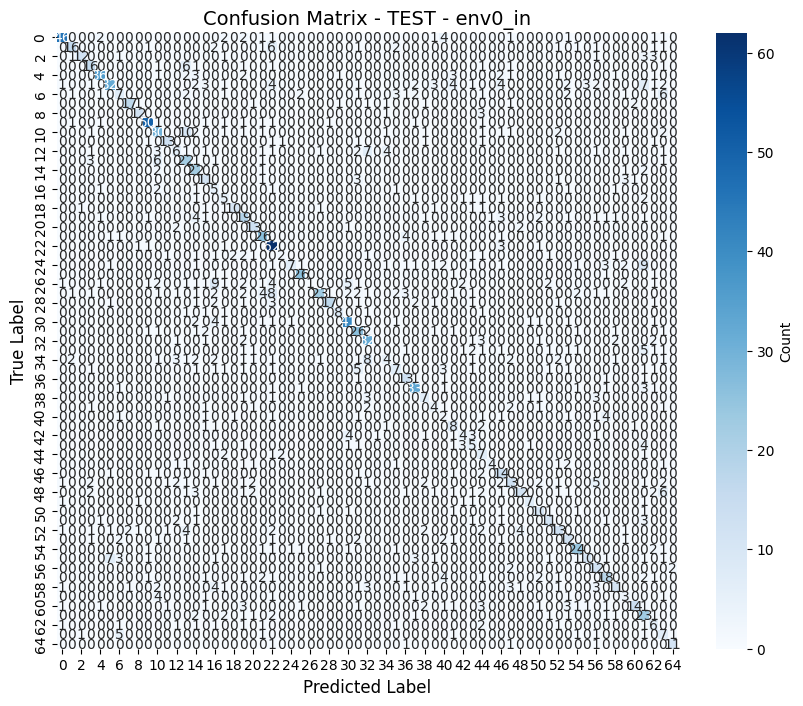


TRAIN - env1_in:
  Loss: 0.0733
  Accuracy: 0.9766, Precision: 0.9780, Recall: 0.9766, F1: 0.9767
  Saved CSV to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_TRAIN_env1_in.png


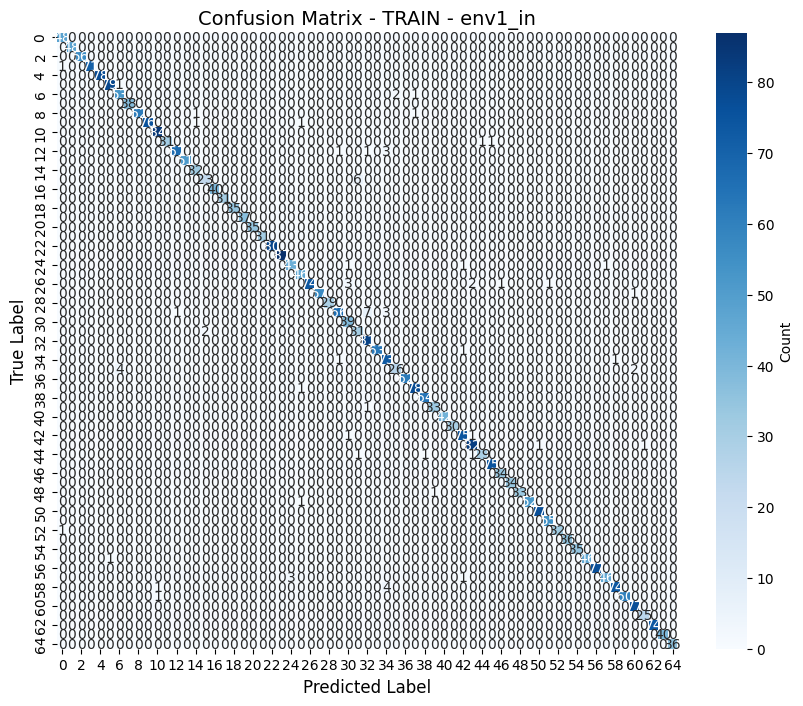


TRAIN - env2_in:
  Loss: 0.0442
  Accuracy: 0.9878, Precision: 0.9883, Recall: 0.9878, F1: 0.9877
  Saved CSV to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_TRAIN_env2_in.png


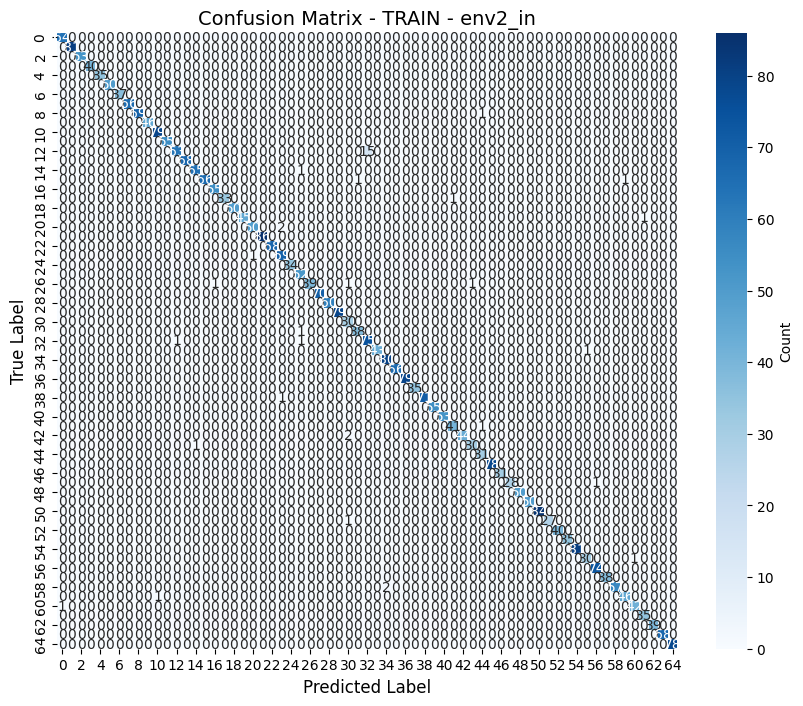


TRAIN - env3_in:
  Loss: 0.0533
  Accuracy: 0.9847, Precision: 0.9865, Recall: 0.9847, F1: 0.9846
  Saved CSV to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_TRAIN_env3_in.png


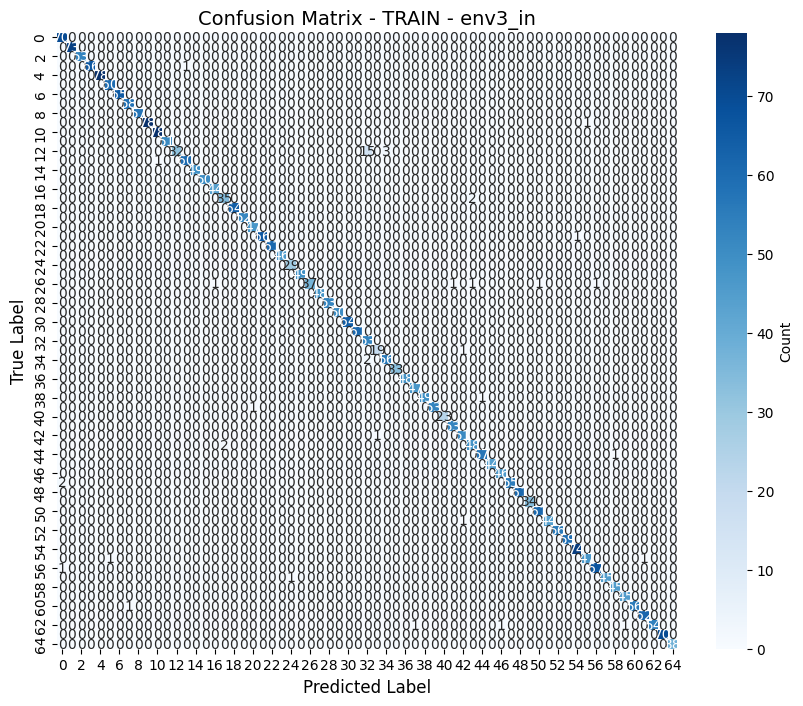


OTHER - env0_out:
  Loss: 2.7734
  Accuracy: 0.4458, Precision: 0.5044, Recall: 0.4458, F1: 0.4287
  Saved CSV to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_OTHER_env0_out.png


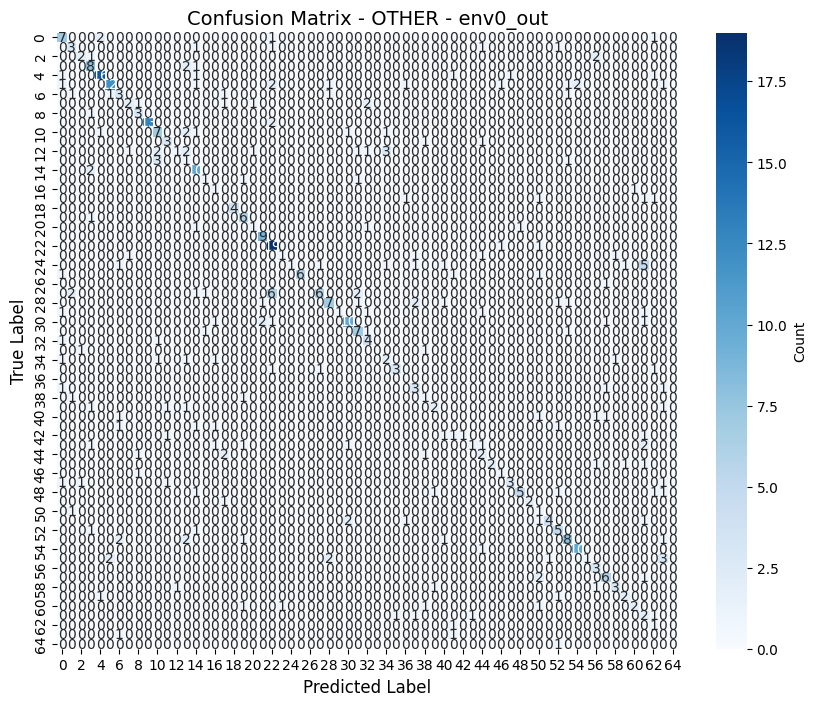


VAL - env1_out:
  Loss: 1.4243
  Accuracy: 0.7723, Precision: 0.7712, Recall: 0.7723, F1: 0.7545
  Saved CSV to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_VAL_env1_out.png


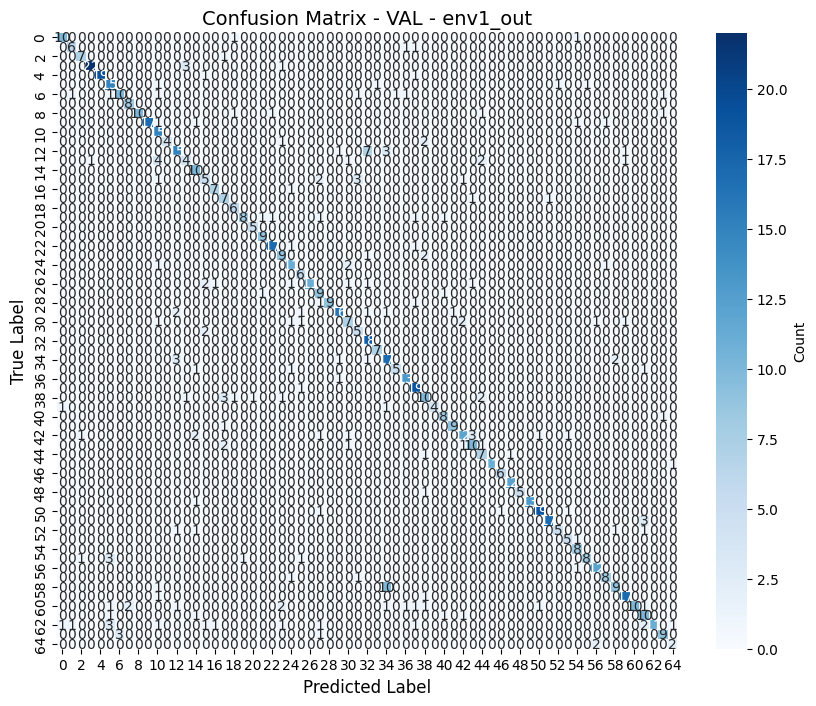


VAL - env2_out:
  Loss: 0.7123
  Accuracy: 0.8385, Precision: 0.8479, Recall: 0.8385, F1: 0.8304
  Saved CSV to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_VAL_env2_out.png


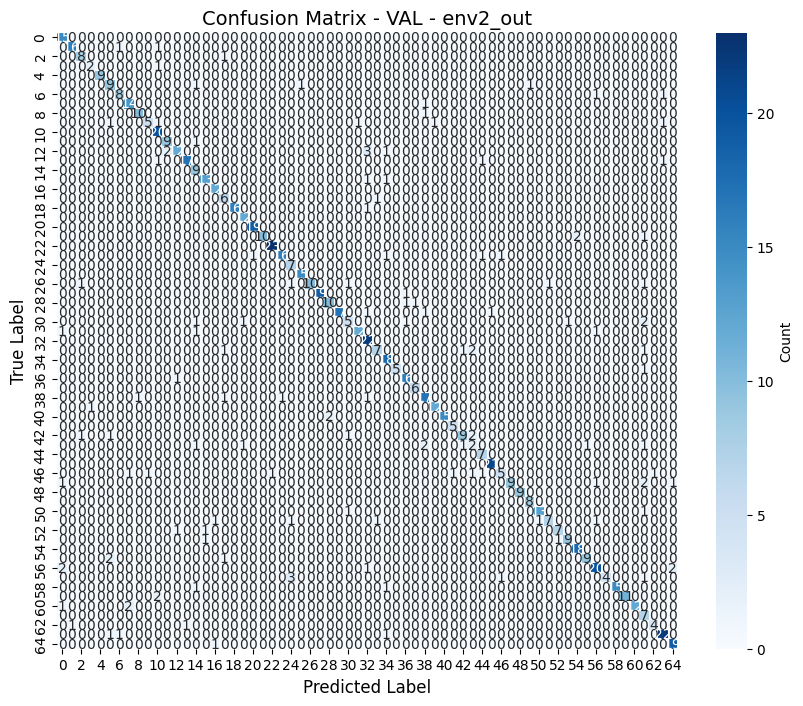


VAL - env3_out:
  Loss: 1.1258
  Accuracy: 0.7356, Precision: 0.7717, Recall: 0.7356, F1: 0.7343
  Saved CSV to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/confusion_matrix_VAL_env3_out.png


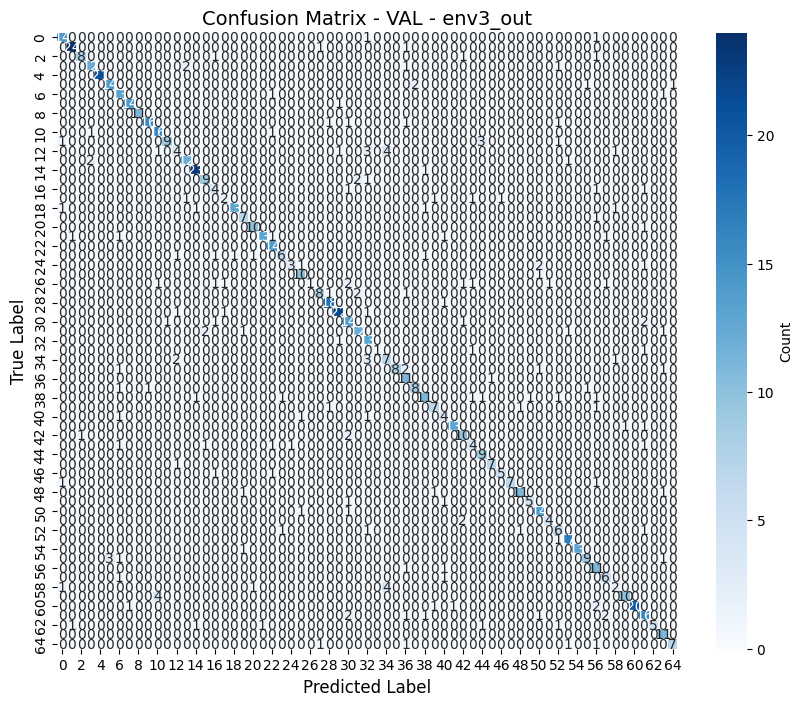


Training curves saved to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/training_curves_OfficeHome.png


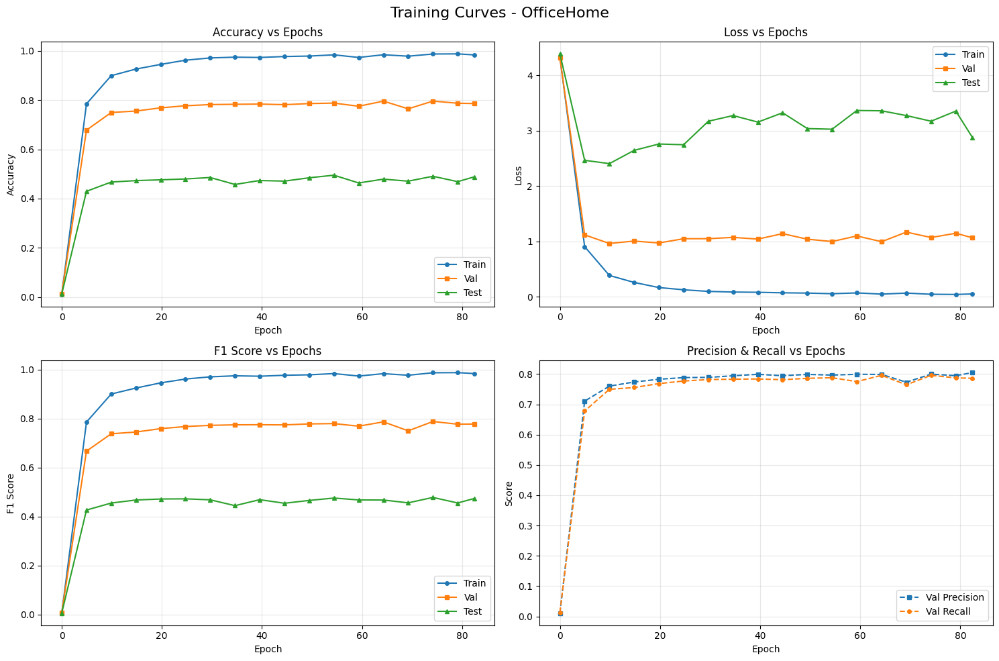

Epoch time plot saved to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs/epoch_times_OfficeHome.png


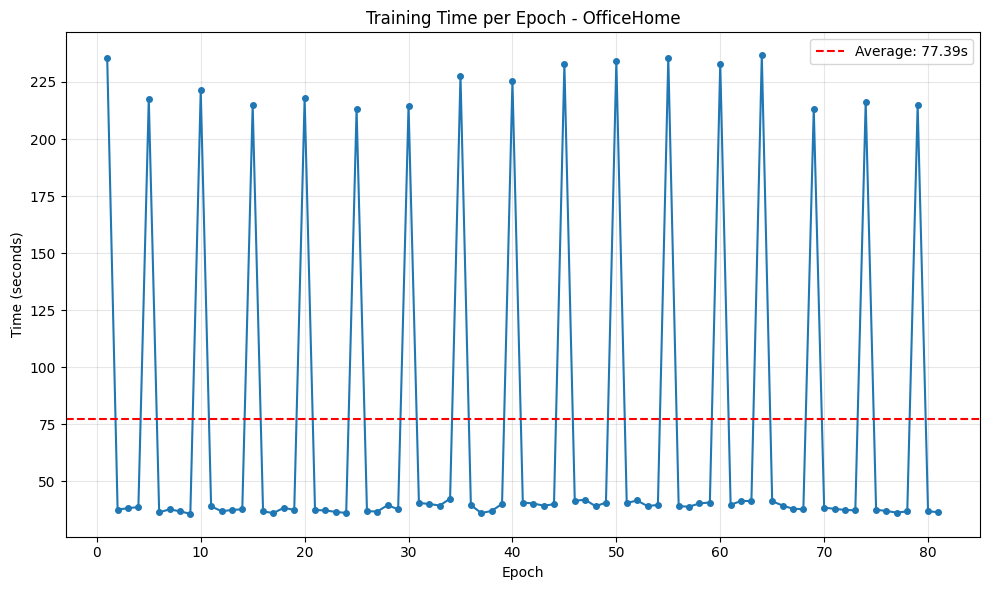


All results saved to: /kaggle/working/experiments/experiment_with_officehome_SimpleDiffAug/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_OfficeHome.png
  - epoch_times_OfficeHome.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)


In [29]:
fit_simple(
    exp_dir=str(exp_dir),
    logger=logger,

    seed=0,
    trial_seed=0,
    hparams_seed=0,

    algorithm_name="ERM",
    dataset_name="OfficeHome",
    data_dir="/kaggle/input/officehome/OfficeHome",

    num_workers=4,
    test_envs=[0],
    overlap_type="100",

    holdout_fraction=0.2,
    n_steps=5001,
    checkpoint_freq=300,

    # 🔥 THIS FIX
    model_checkpoint={
        "metric": "val/acc",
        "maximize": True
    },

    num_classes=65,

    auto_augment=True,
    augment_search_epochs=10,
)

# Pacs train with DADA

In [31]:
dataset_name_pacs = "PACS"


In [33]:
config["dataset"] = "PACS"
config["auto_augment"] = True


Seed set to 0


/kaggle/input/pacs-dataset/kfold
num_envs=4, num_filters=3, domain_class_filter=[[0, 1, 2, 3], [2, 3, 4, 5], [4, 5, 6, 0]]


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 45.4MB/s]


Model checkpoint frequency: 300


  0%|          | 0/5001 [00:46<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
step_time: 46.8565s
TRAIN:
  loss: 3.2798
  acc: 0.0934
  precision: 0.2221
  recall: 0.0934
  f1: 0.0628
  oacc: 0.0361
  nacc: 0.1661
VAL:
  loss: 2.0474
  acc: 0.0982
  precision: 0.1703
  recall: 0.0982
  f1: 0.0659
  oacc: 0.0423
  nacc: 0.1687
TEST:
  loss: 2.0549
  acc: 0.1430
  precision: 0.1632
  recall: 0.1430
  f1: 0.1119
  oacc: 0.1404
  nacc: 0.1495
OTHER:
  loss: 2.0278
  acc: 0.1444
  precision: 0.1483
  recall: 0.1444
  f1: 0.1184
  oacc: 0.1506
  nacc: 0.1288


  6%|▌         | 300/5001 [03:33<33:28,  2.34it/s] 


=== Step 300 (Epoch 14.16) ===
step_time: 39.4546s
TRAIN:
  loss: 0.9792
  acc: 0.8986
  precision: 0.9022
  recall: 0.8986
  f1: 0.8988
  oacc: 0.6386
  nacc: 0.3289
VAL:
  loss: 0.1629
  acc: 0.9444
  precision: 0.9494
  recall: 0.9444
  f1: 0.9453
  oacc: 0.6281
  nacc: 0.3187
TEST:
  loss: 1.7611
  acc: 0.5833
  precision: 0.6273
  recall: 0.5833
  f1: 0.5346
  oacc: 0.6866
  nacc: 0.3251
OTHER:
  loss: 2.0629
  acc: 0.5828
  precision: 0.6196
  recall: 0.5828
  f1: 0.5199
  oacc: 0.6857
  nacc: 0.3253


 12%|█▏        | 600/5001 [06:23<31:26,  2.33it/s]   


=== Step 600 (Epoch 28.32) ===
step_time: 40.0734s
TRAIN:
  loss: 0.7381
  acc: 0.9930
  precision: 0.9932
  recall: 0.9930
  f1: 0.9931
  oacc: 0.6623
  nacc: 0.3303
VAL:
  loss: 0.1511
  acc: 0.8883
  precision: 0.8923
  recall: 0.8883
  f1: 0.8900
  oacc: 0.6355
  nacc: 0.3092
TEST:
  loss: 1.9015
  acc: 0.6024
  precision: 0.6309
  recall: 0.6024
  f1: 0.5683
  oacc: 0.7325
  nacc: 0.2773
OTHER:
  loss: 2.2222
  acc: 0.6520
  precision: 0.6386
  recall: 0.6520
  f1: 0.6016
  oacc: 0.7923
  nacc: 0.3012


 18%|█▊        | 900/5001 [09:12<29:53,  2.29it/s]   


=== Step 900 (Epoch 42.48) ===
step_time: 38.0445s
TRAIN:
  loss: 0.6968
  acc: 0.9960
  precision: 0.9961
  recall: 0.9960
  f1: 0.9961
  oacc: 0.6637
  nacc: 0.3328
VAL:
  loss: 0.1281
  acc: 0.9583
  precision: 0.9639
  recall: 0.9583
  f1: 0.9598
  oacc: 0.6427
  nacc: 0.3098
TEST:
  loss: 1.9923
  acc: 0.6184
  precision: 0.7863
  recall: 0.6184
  f1: 0.5812
  oacc: 0.7440
  nacc: 0.3043
OTHER:
  loss: 2.3521
  acc: 0.6446
  precision: 0.6463
  recall: 0.6446
  f1: 0.5935
  oacc: 0.7771
  nacc: 0.3133


 24%|██▍       | 1200/5001 [12:01<27:35,  2.30it/s]  


=== Step 1200 (Epoch 56.64) ===
step_time: 39.0259s
TRAIN:
  loss: 0.6753
  acc: 0.9971
  precision: 0.9973
  recall: 0.9971
  f1: 0.9972
  oacc: 0.6656
  nacc: 0.3303
VAL:
  loss: 0.1093
  acc: 0.9648
  precision: 0.9660
  recall: 0.9648
  f1: 0.9648
  oacc: 0.6486
  nacc: 0.3081
TEST:
  loss: 2.8868
  acc: 0.5854
  precision: 0.6418
  recall: 0.5854
  f1: 0.5446
  oacc: 0.7108
  nacc: 0.2719
OTHER:
  loss: 3.3320
  acc: 0.6203
  precision: 0.6399
  recall: 0.6203
  f1: 0.5687
  oacc: 0.7479
  nacc: 0.3012


 30%|███       | 1501/5001 [14:50<11:27:18, 11.78s/it]


=== Step 1500 (Epoch 70.80) ===
step_time: 38.1764s
TRAIN:
  loss: 0.6704
  acc: 0.9985
  precision: 0.9986
  recall: 0.9985
  f1: 0.9986
  oacc: 0.6659
  nacc: 0.3322
VAL:
  loss: 0.1902
  acc: 0.9666
  precision: 0.9686
  recall: 0.9666
  f1: 0.9671
  oacc: 0.6481
  nacc: 0.3129
TEST:
  loss: 1.9062
  acc: 0.6434
  precision: 0.7604
  recall: 0.6434
  f1: 0.5901
  oacc: 0.7783
  nacc: 0.3059
OTHER:
  loss: 2.2597
  acc: 0.6644
  precision: 0.5957
  recall: 0.6644
  f1: 0.5910
  oacc: 0.8049
  nacc: 0.3133


 36%|███▌      | 1801/5001 [17:38<10:37:17, 11.95s/it]


=== Step 1800 (Epoch 84.96) ===
step_time: 38.7141s
TRAIN:
  loss: 0.6672
  acc: 0.9326
  precision: 0.9331
  recall: 0.9326
  f1: 0.9328
  oacc: 0.6662
  nacc: 0.3328
VAL:
  loss: 0.1256
  acc: 0.9604
  precision: 0.9614
  recall: 0.9604
  f1: 0.9606
  oacc: 0.6443
  nacc: 0.3101
TEST:
  loss: 2.5333
  acc: 0.5720
  precision: 0.8256
  recall: 0.5720
  f1: 0.5596
  oacc: 0.6906
  nacc: 0.2755
OTHER:
  loss: 2.9422
  acc: 0.5981
  precision: 0.6694
  recall: 0.5981
  f1: 0.5694
  oacc: 0.7337
  nacc: 0.2590


 42%|████▏     | 2101/5001 [20:27<9:36:16, 11.92s/it] 


=== Step 2100 (Epoch 99.12) ===
step_time: 38.6383s
TRAIN:
  loss: 0.6755
  acc: 0.9319
  precision: 0.9322
  recall: 0.9319
  f1: 0.9320
  oacc: 0.6656
  nacc: 0.3328
VAL:
  loss: 0.1506
  acc: 0.7694
  precision: 0.7762
  recall: 0.7694
  f1: 0.7724
  oacc: 0.6418
  nacc: 0.3190
TEST:
  loss: 1.8870
  acc: 0.6325
  precision: 0.6451
  recall: 0.6325
  f1: 0.5966
  oacc: 0.7308
  nacc: 0.3866
OTHER:
  loss: 2.3242
  acc: 0.6577
  precision: 0.6297
  recall: 0.6577
  f1: 0.6034
  oacc: 0.7618
  nacc: 0.3976


 48%|████▊     | 2400/5001 [23:15<18:44,  2.31it/s]  


=== Step 2400 (Epoch 113.27) ===
step_time: 38.7805s
TRAIN:
  loss: 0.6574
  acc: 0.9996
  precision: 0.9996
  recall: 0.9996
  f1: 0.9996
  oacc: 0.6667
  nacc: 0.3325
VAL:
  loss: 0.1296
  acc: 0.9061
  precision: 0.9076
  recall: 0.9061
  f1: 0.9067
  oacc: 0.6495
  nacc: 0.3158
TEST:
  loss: 2.5572
  acc: 0.6233
  precision: 0.8176
  recall: 0.6233
  f1: 0.5956
  oacc: 0.7427
  nacc: 0.3249
OTHER:
  loss: 3.0296
  acc: 0.6565
  precision: 0.6664
  recall: 0.6565
  f1: 0.6115
  oacc: 0.7938
  nacc: 0.3133


 54%|█████▍    | 2701/5001 [26:04<7:36:24, 11.91s/it]


=== Step 2700 (Epoch 127.43) ===
step_time: 38.5713s
TRAIN:
  loss: 0.6556
  acc: 0.9988
  precision: 0.9988
  recall: 0.9988
  f1: 0.9988
  oacc: 0.6657
  nacc: 0.3333
VAL:
  loss: 0.1658
  acc: 0.8972
  precision: 0.8988
  recall: 0.8972
  f1: 0.8974
  oacc: 0.6395
  nacc: 0.3224
TEST:
  loss: 2.8803
  acc: 0.6329
  precision: 0.7949
  recall: 0.6329
  f1: 0.5879
  oacc: 0.7462
  nacc: 0.3496
OTHER:
  loss: 3.3990
  acc: 0.6474
  precision: 0.6442
  recall: 0.6474
  f1: 0.5983
  oacc: 0.7738
  nacc: 0.3313


 60%|██████    | 3001/5001 [28:53<6:32:06, 11.76s/it]


=== Step 3000 (Epoch 141.59) ===
step_time: 38.0971s
TRAIN:
  loss: 0.6674
  acc: 0.9977
  precision: 0.9977
  recall: 0.9977
  f1: 0.9977
  oacc: 0.6662
  nacc: 0.3299
VAL:
  loss: 0.1713
  acc: 0.8479
  precision: 0.8573
  recall: 0.8479
  f1: 0.8501
  oacc: 0.6492
  nacc: 0.2716
TEST:
  loss: 2.5829
  acc: 0.6235
  precision: 0.8174
  recall: 0.6235
  f1: 0.5951
  oacc: 0.7615
  nacc: 0.2784
OTHER:
  loss: 2.9071
  acc: 0.6388
  precision: 0.6577
  recall: 0.6388
  f1: 0.5943
  oacc: 0.7858
  nacc: 0.2711


 66%|██████▌   | 3301/5001 [31:41<5:37:45, 11.92s/it]


=== Step 3300 (Epoch 155.75) ===
step_time: 38.6216s
TRAIN:
  loss: 0.6763
  acc: 0.8632
  precision: 0.8642
  recall: 0.8632
  f1: 0.8637
  oacc: 0.6634
  nacc: 0.3333
VAL:
  loss: 0.1766
  acc: 0.7806
  precision: 0.7883
  recall: 0.7806
  f1: 0.7831
  oacc: 0.6298
  nacc: 0.3187
TEST:
  loss: 1.1804
  acc: 0.6806
  precision: 0.7659
  recall: 0.6806
  f1: 0.6598
  oacc: 0.7526
  nacc: 0.5007
OTHER:
  loss: 1.5411
  acc: 0.6906
  precision: 0.7581
  recall: 0.6906
  f1: 0.6429
  oacc: 0.7740
  nacc: 0.4821


 72%|███████▏  | 3601/5001 [34:29<4:36:27, 11.85s/it]


=== Step 3600 (Epoch 169.91) ===
step_time: 38.3652s
TRAIN:
  loss: 0.6588
  acc: 0.9999
  precision: 0.9999
  recall: 0.9999
  f1: 0.9999
  oacc: 0.6667
  nacc: 0.3331
VAL:
  loss: 0.1329
  acc: 0.8993
  precision: 0.9010
  recall: 0.8993
  f1: 0.9000
  oacc: 0.6460
  nacc: 0.3121
TEST:
  loss: 2.9016
  acc: 0.6177
  precision: 0.7970
  recall: 0.6177
  f1: 0.5844
  oacc: 0.7435
  nacc: 0.3030
OTHER:
  loss: 3.3799
  acc: 0.6237
  precision: 0.6613
  recall: 0.6237
  f1: 0.5899
  oacc: 0.7479
  nacc: 0.3133


 78%|███████▊  | 3901/5001 [37:18<3:38:35, 11.92s/it]


=== Step 3900 (Epoch 184.07) ===
step_time: 38.6458s
TRAIN:
  loss: 0.6557
  acc: 0.9997
  precision: 0.9997
  recall: 0.9997
  f1: 0.9997
  oacc: 0.6665
  nacc: 0.3333
VAL:
  loss: 0.1314
  acc: 0.9042
  precision: 0.9058
  recall: 0.9042
  f1: 0.9048
  oacc: 0.6479
  nacc: 0.3175
TEST:
  loss: 2.9605
  acc: 0.6418
  precision: 0.8038
  recall: 0.6418
  f1: 0.5979
  oacc: 0.7658
  nacc: 0.3319
OTHER:
  loss: 3.6474
  acc: 0.6584
  precision: 0.6501
  recall: 0.6584
  f1: 0.6070
  oacc: 0.7868
  nacc: 0.3373


 84%|████████▍ | 4201/5001 [40:06<2:37:01, 11.78s/it]


=== Step 4200 (Epoch 198.23) ===
step_time: 38.1540s
TRAIN:
  loss: 0.6582
  acc: 0.9987
  precision: 0.9988
  recall: 0.9987
  f1: 0.9987
  oacc: 0.6661
  nacc: 0.3322
VAL:
  loss: 0.1664
  acc: 0.9559
  precision: 0.9593
  recall: 0.9559
  f1: 0.9567
  oacc: 0.6419
  nacc: 0.3069
TEST:
  loss: 2.5030
  acc: 0.5862
  precision: 0.7808
  recall: 0.5862
  f1: 0.5665
  oacc: 0.6860
  nacc: 0.3367
OTHER:
  loss: 2.7667
  acc: 0.6049
  precision: 0.7795
  recall: 0.6049
  f1: 0.5766
  oacc: 0.7076
  nacc: 0.3480


 90%|████████▉ | 4500/5001 [42:53<03:36,  2.32it/s]  


=== Step 4500 (Epoch 212.39) ===
step_time: 37.2913s
TRAIN:
  loss: 0.6547
  acc: 0.9328
  precision: 0.9330
  recall: 0.9328
  f1: 0.9329
  oacc: 0.6662
  nacc: 0.3333
VAL:
  loss: 0.1111
  acc: 0.9112
  precision: 0.9129
  recall: 0.9112
  f1: 0.9119
  oacc: 0.6548
  nacc: 0.3138
TEST:
  loss: 3.1625
  acc: 0.6011
  precision: 0.7880
  recall: 0.6011
  f1: 0.5620
  oacc: 0.7023
  nacc: 0.3481
OTHER:
  loss: 3.5046
  acc: 0.6294
  precision: 0.6414
  recall: 0.6294
  f1: 0.5851
  oacc: 0.7438
  nacc: 0.3434


 96%|█████████▌| 4801/5001 [45:40<37:12, 11.16s/it]  


=== Step 4800 (Epoch 226.55) ===
step_time: 36.1120s
TRAIN:
  loss: 0.6659
  acc: 0.9990
  precision: 0.9992
  recall: 0.9990
  f1: 0.9991
  oacc: 0.6659
  nacc: 0.3333
VAL:
  loss: 0.1417
  acc: 0.9672
  precision: 0.9690
  recall: 0.9672
  f1: 0.9678
  oacc: 0.6473
  nacc: 0.3161
TEST:
  loss: 2.4453
  acc: 0.6542
  precision: 0.7673
  recall: 0.6542
  f1: 0.6085
  oacc: 0.7849
  nacc: 0.3273
OTHER:
  loss: 3.0362
  acc: 0.6542
  precision: 0.6177
  recall: 0.6542
  f1: 0.5929
  oacc: 0.7955
  nacc: 0.3012


100%|██████████| 5001/5001 [47:45<00:00,  1.75it/s]



=== Step 5000 (Epoch 235.99) ===
step_time: 38.5331s
TRAIN:
  loss: 0.6588
  acc: 0.9995
  precision: 0.9996
  recall: 0.9995
  f1: 0.9996
  oacc: 0.6663
  nacc: 0.3333
VAL:
  loss: 0.1293
  acc: 0.8552
  precision: 0.8575
  recall: 0.8552
  f1: 0.8558
  oacc: 0.6437
  nacc: 0.3104
TEST:
  loss: 2.4925
  acc: 0.6220
  precision: 0.8033
  recall: 0.6220
  f1: 0.5928
  oacc: 0.7390
  nacc: 0.3294
OTHER:
  loss: 3.0085
  acc: 0.6406
  precision: 0.7934
  recall: 0.6406
  f1: 0.5992
  oacc: 0.7709
  nacc: 0.3148

TRAINING COMPLETED
Total training time: 2865.23s (47.75 minutes)
Average time per epoch: 12.44s
Total epochs: 227


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 2.4675
  Accuracy: 0.6220, Precision: 0.8033, Recall: 0.6220, F1: 0.5928
  Saved CSV to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_TEST_env0_in.csv
  Saved plot to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_TEST_env0_

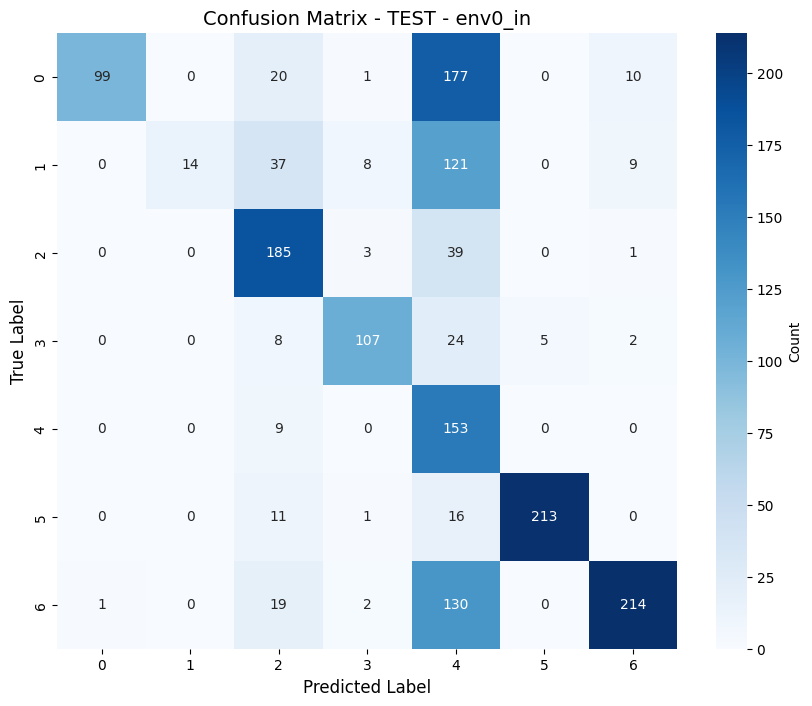


TRAIN - env1_in:
  Loss: 0.0024
  Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1: 1.0000
  Saved CSV to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env1_in.png


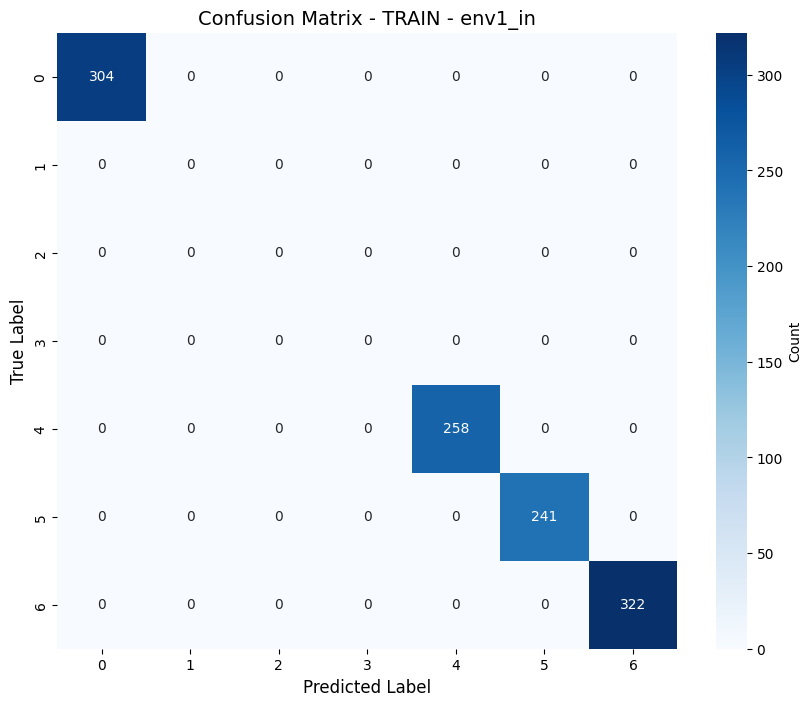


TRAIN - env2_in:
  Loss: 0.0000
  Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1: 1.0000
  Saved CSV to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env2_in.png


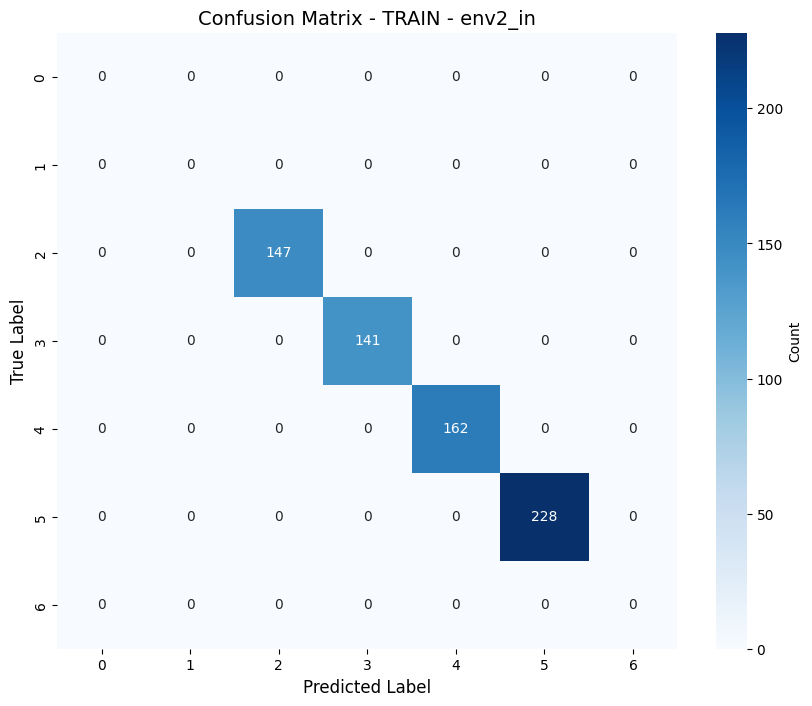


TRAIN - env3_in:
  Loss: 0.0012
  Accuracy: 0.9996, Precision: 0.9996, Recall: 0.9996, F1: 0.9996
  Saved CSV to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env3_in.png


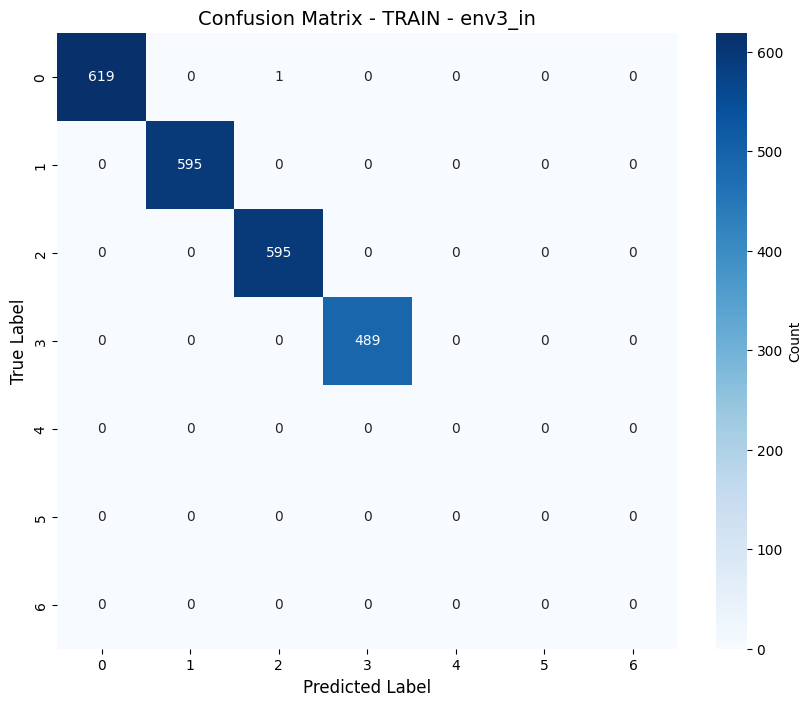


OTHER - env0_out:
  Loss: 2.9946
  Accuracy: 0.6406, Precision: 0.7934, Recall: 0.6406, F1: 0.5992
  Saved CSV to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_OTHER_env0_out.png


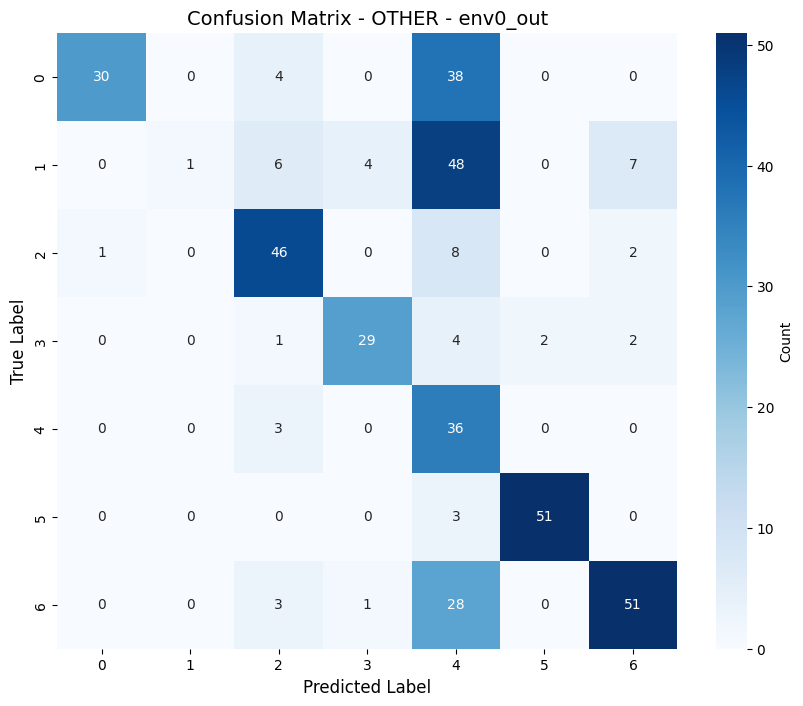


VAL - env1_out:
  Loss: 0.2022
  Accuracy: 0.6362, Precision: 0.6406, Recall: 0.6362, F1: 0.6381
  Saved CSV to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_VAL_env1_out.png


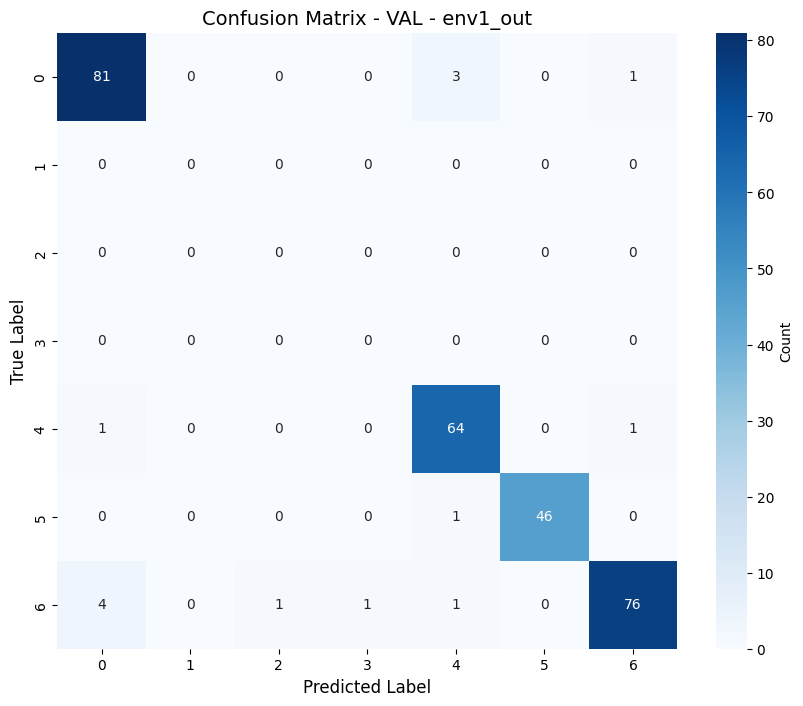


VAL - env2_out:
  Loss: 0.0318
  Accuracy: 0.9809, Precision: 0.9795, Recall: 0.9809, F1: 0.9800
  Saved CSV to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_VAL_env2_out.png


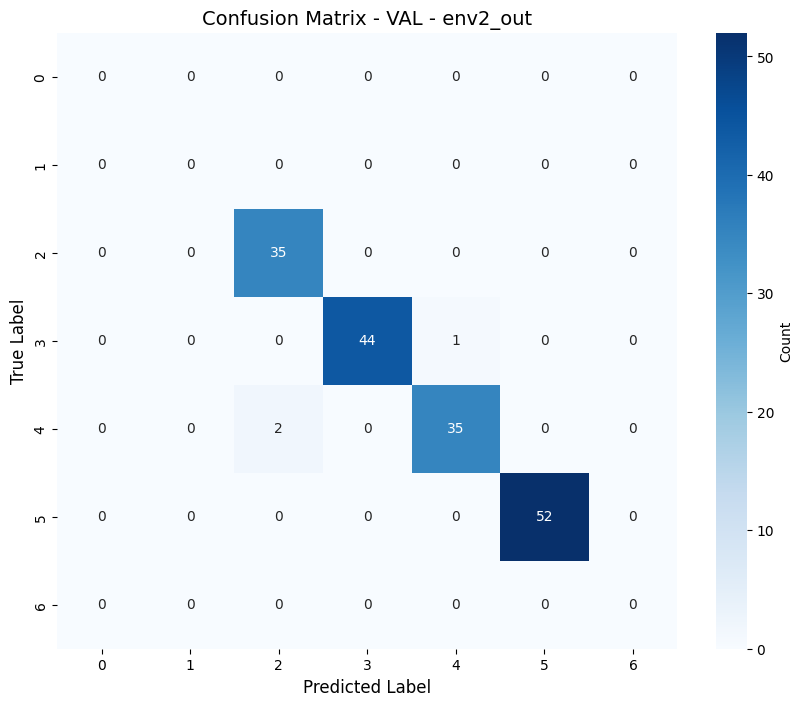


VAL - env3_out:
  Loss: 0.1133
  Accuracy: 0.9680, Precision: 0.9686, Recall: 0.9680, F1: 0.9682
  Saved CSV to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/confusion_matrix_VAL_env3_out.png


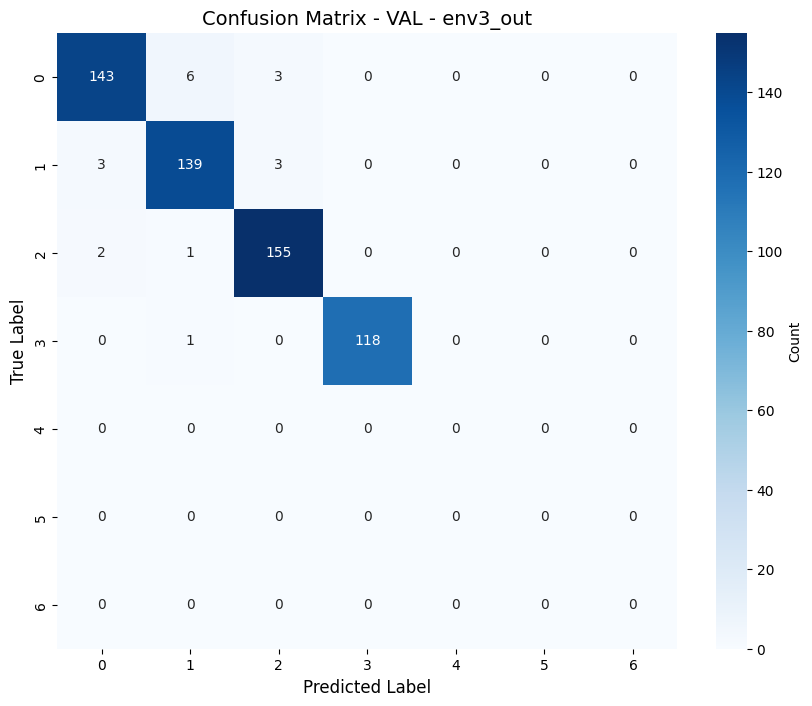


Training curves saved to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/training_curves_PACS.png


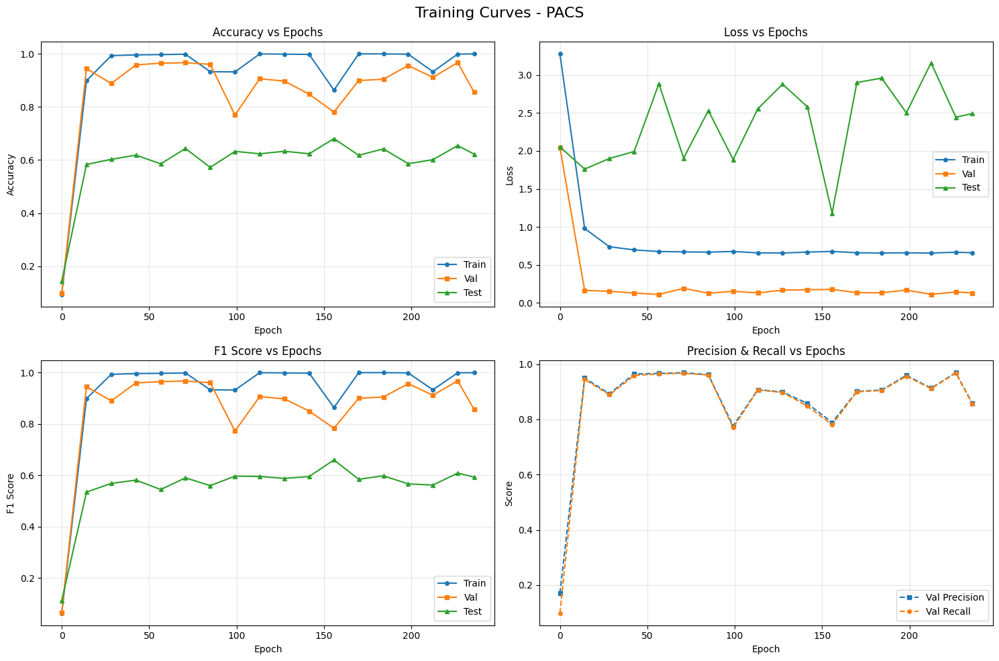

Epoch time plot saved to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs/epoch_times_PACS.png


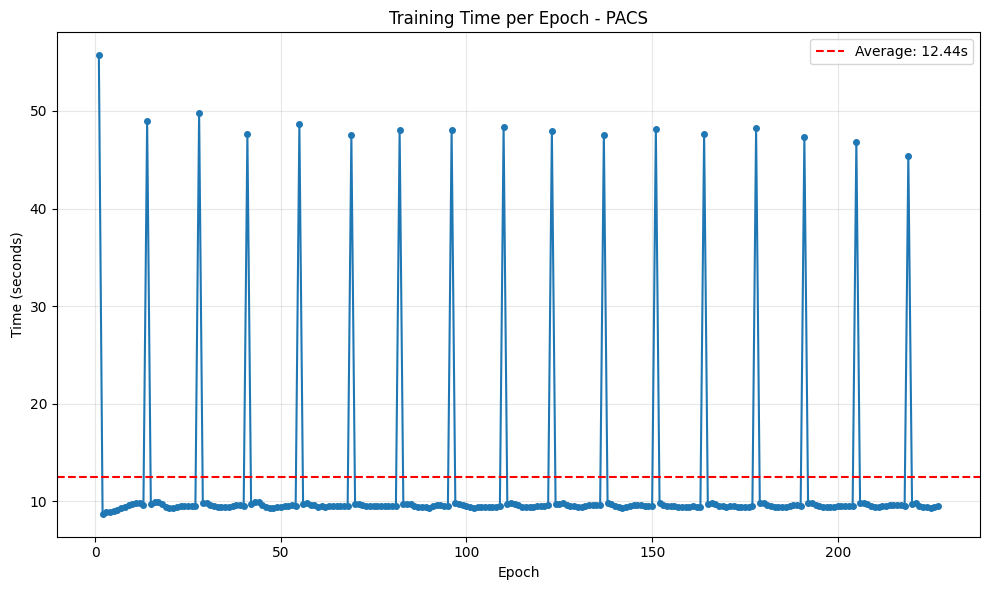


All results saved to: /kaggle/working/experiments/ experiment_with_pacs_SimpleDiffAug/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_PACS.png
  - epoch_times_PACS.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)


In [34]:
fit_simple(
    exp_dir=str(exp_dir),
    logger=logger,
    seed=config.get("seed", 0),
    trial_seed=config.get("trial_seed", 0),
    hparams_seed=config.get("hparams_seed", 0),
    algorithm_name=config["algo"],
    dataset_name=dataset_name_pacs,
    data_dir=config["data_dir"][dataset_name_pacs],
    num_workers=config.get("num_workers", 4),
    test_envs=[config["test_set_id"]],
    overlap_type=config.get("overlap", "none"),
    holdout_fraction=config.get("holdout_fraction", 0.2),
    n_steps=config.get("n_epochs"),
    checkpoint_freq=config.get("checkpoint_freq"),
    model_checkpoint=config.get("model_checkpoint", {
        "metric": "val/acc",
        "maximize": True
    }),
    num_domain_linked_classes=config.get("num_domain_linked_classes"),
    num_classes=config.get("num_classes"),
    auto_augment=config.get("auto_augment", False),
    augment_search_epochs=config.get("augment_search_epochs", 10),
)



# VLCS Train with DADA

In [50]:
    "data_dir": {
        "OfficeHome": "/kaggle/input/officehome",
        "VLCS": "/kaggle/input/vlcsdataset",
        "PACS": "/kaggle/input/pacs-dataset",
    },

    "algo": "ERM",
    "seed": 0,
    "trial_seed": 0,
    "hparams_seed": 0,
    "num_workers": 4,
    "test_set_id": 0,
    "num_classes": 65,   # OfficeHome
    "n_epochs": 5001,
    "auto_augment": True,
}

In [57]:
config = {
    "data_dir": {
        "OfficeHome": "/kaggle/input/officehome",
        "VLCS": "/kaggle/input/vlcsdataset",
        "PACS": "/kaggle/input/pacs-dataset",
    },

    "algo": "ERM",
    "seed": 0,
    "trial_seed": 0,
    "hparams_seed": 0,
    "num_workers": 4,
    "test_set_id": 0,

    # VLCS specific
    "num_classes": 5,
    "n_epochs": 5001,
    "auto_augment": True,

    # ✅ ADD checkpoint frequency
    "checkpoint_freq": 300,  # evaluate/save every 300 steps or epochs

    # Optional: model checkpoint
    "model_checkpoint": {
        "metric": "val/acc",
        "maximize": True
    },

    # Other optional configs
    "holdout_fraction": 0.2,
    "augment_search_epochs": 5,
    "augment_policy_size": 5,
    "augment_num_policies": 3,
    "teacher_paths": {}
}


Seed set to 0


num_envs=4, num_filters=3, domain_class_filter=[[0, 1, 2], [2, 3, 4], [3, 4, 0]]
Model checkpoint frequency: 300


  0%|          | 0/5001 [01:51<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
step_time: 111.4736s
TRAIN:
  loss: 1.3713
  acc: 0.1848
  precision: 0.2963
  recall: 0.1848
  f1: 0.1650
  oacc: 0.1745
  nacc: 0.0000
VAL:
  loss: 1.3249
  acc: 0.1389
  precision: 0.1793
  recall: 0.1389
  f1: 0.1257
  oacc: 0.1737
  nacc: 0.0000
TEST:
  loss: 1.5524
  acc: 0.1251
  precision: 0.1005
  recall: 0.1251
  f1: 0.1115
  oacc: 0.1564
  nacc: 0.0000
OTHER:
  loss: 1.5226
  acc: 0.1326
  precision: 0.1078
  recall: 0.1326
  f1: 0.1189
  oacc: 0.1657
  nacc: 0.0000


  6%|▌         | 300/5001 [08:24<1:16:33,  1.02it/s] 


=== Step 300 (Epoch 8.82) ===
step_time: 101.4523s
TRAIN:
  loss: 0.2349
  acc: 0.5149
  precision: 0.6307
  recall: 0.5149
  f1: 0.5430
  oacc: 0.5082
  nacc: 0.3051
VAL:
  loss: 0.4990
  acc: 0.4362
  precision: 0.5412
  recall: 0.4362
  f1: 0.4621
  oacc: 0.4286
  nacc: 0.2576
TEST:
  loss: 1.2852
  acc: 0.4762
  precision: 0.5237
  recall: 0.4762
  f1: 0.4283
  oacc: 0.5953
  nacc: 0.0000
OTHER:
  loss: 1.2569
  acc: 0.4701
  precision: 0.5277
  recall: 0.4701
  f1: 0.4272
  oacc: 0.5876
  nacc: 0.0000


 12%|█▏        | 601/5001 [14:58<38:16:00, 31.31s/it]


=== Step 600 (Epoch 17.65) ===
step_time: 102.2722s
TRAIN:
  loss: 0.1043
  acc: 0.6634
  precision: 0.7410
  recall: 0.6634
  f1: 0.6935
  oacc: 0.5845
  nacc: 0.3157
VAL:
  loss: 0.8115
  acc: 0.4263
  precision: 0.5429
  recall: 0.4263
  f1: 0.4563
  oacc: 0.4219
  nacc: 0.2449
TEST:
  loss: 1.1093
  acc: 0.5649
  precision: 0.5977
  recall: 0.5649
  f1: 0.5485
  oacc: 0.7061
  nacc: 0.0000
OTHER:
  loss: 1.0113
  acc: 0.6224
  precision: 0.6179
  recall: 0.6224
  f1: 0.5841
  oacc: 0.7780
  nacc: 0.0000


 18%|█▊        | 900/5001 [21:31<1:01:01,  1.12it/s] 


=== Step 900 (Epoch 26.47) ===
step_time: 103.0857s
TRAIN:
  loss: 0.0499
  acc: 0.6864
  precision: 0.6939
  recall: 0.6864
  f1: 0.6901
  oacc: 0.6505
  nacc: 0.3333
VAL:
  loss: 0.6635
  acc: 0.4570
  precision: 0.4972
  recall: 0.4570
  f1: 0.4752
  oacc: 0.4097
  nacc: 0.3005
TEST:
  loss: 3.1964
  acc: 0.4711
  precision: 0.4571
  recall: 0.4711
  f1: 0.4170
  oacc: 0.5864
  nacc: 0.0098
OTHER:
  loss: 3.2817
  acc: 0.5098
  precision: 0.4609
  recall: 0.5098
  f1: 0.4278
  oacc: 0.6373
  nacc: 0.0000


 24%|██▍       | 1201/5001 [28:12<33:32:26, 31.78s/it]


=== Step 1200 (Epoch 35.29) ===
step_time: 103.8553s
TRAIN:
  loss: 0.0243
  acc: 0.8255
  precision: 0.8317
  recall: 0.8255
  f1: 0.8285
  oacc: 0.6595
  nacc: 0.3327
VAL:
  loss: 0.7370
  acc: 0.4110
  precision: 0.5632
  recall: 0.4110
  f1: 0.4443
  oacc: 0.4399
  nacc: 0.2955
TEST:
  loss: 2.6786
  acc: 0.5000
  precision: 0.5111
  recall: 0.5000
  f1: 0.4712
  oacc: 0.6226
  nacc: 0.0098
OTHER:
  loss: 2.6424
  acc: 0.4960
  precision: 0.5059
  recall: 0.4960
  f1: 0.4594
  oacc: 0.6200
  nacc: 0.0000


 30%|███       | 1501/5001 [34:49<30:44:47, 31.63s/it]


=== Step 1500 (Epoch 44.12) ===
step_time: 103.0115s
TRAIN:
  loss: 0.0185
  acc: 0.8307
  precision: 0.8277
  recall: 0.8307
  f1: 0.8292
  oacc: 0.6652
  nacc: 0.3286
VAL:
  loss: 0.8443
  acc: 0.4370
  precision: 0.5016
  recall: 0.4370
  f1: 0.4578
  oacc: 0.4340
  nacc: 0.2399
TEST:
  loss: 3.5497
  acc: 0.5111
  precision: 0.4175
  recall: 0.5111
  f1: 0.3875
  oacc: 0.6388
  nacc: 0.0000
OTHER:
  loss: 3.5049
  acc: 0.4995
  precision: 0.4515
  recall: 0.4995
  f1: 0.3842
  oacc: 0.6244
  nacc: 0.0000


 36%|███▌      | 1801/5001 [41:23<27:29:32, 30.93s/it]


=== Step 1800 (Epoch 52.94) ===
step_time: 100.1756s
TRAIN:
  loss: 0.0128
  acc: 0.8992
  precision: 0.9151
  recall: 0.8992
  f1: 0.9068
  oacc: 0.6534
  nacc: 0.3322
VAL:
  loss: 0.8725
  acc: 0.4361
  precision: 0.5384
  recall: 0.4361
  f1: 0.4605
  oacc: 0.4276
  nacc: 0.2626
TEST:
  loss: 2.3896
  acc: 0.4760
  precision: 0.5166
  recall: 0.4760
  f1: 0.4400
  oacc: 0.5950
  nacc: 0.0000
OTHER:
  loss: 2.1808
  acc: 0.5311
  precision: 0.5384
  recall: 0.5311
  f1: 0.4688
  oacc: 0.6639
  nacc: 0.0000


 42%|████▏     | 2101/5001 [47:55<24:54:33, 30.92s/it]


=== Step 2100 (Epoch 61.76) ===
step_time: 100.7805s
TRAIN:
  loss: 0.0179
  acc: 0.9109
  precision: 0.9147
  recall: 0.9109
  f1: 0.9128
  oacc: 0.6611
  nacc: 0.3333
VAL:
  loss: 1.0793
  acc: 0.4491
  precision: 0.5779
  recall: 0.4491
  f1: 0.4764
  oacc: 0.4173
  nacc: 0.2424
TEST:
  loss: 3.0698
  acc: 0.4541
  precision: 0.5417
  recall: 0.4541
  f1: 0.3961
  oacc: 0.5651
  nacc: 0.0098
OTHER:
  loss: 3.0589
  acc: 0.4684
  precision: 0.5370
  recall: 0.4684
  f1: 0.3911
  oacc: 0.5856
  nacc: 0.0000


 48%|████▊     | 2401/5001 [54:25<22:18:08, 30.88s/it]


=== Step 2400 (Epoch 70.59) ===
step_time: 100.7111s
TRAIN:
  loss: 0.0137
  acc: 0.9146
  precision: 0.9154
  recall: 0.9146
  f1: 0.9150
  oacc: 0.6648
  nacc: 0.3333
VAL:
  loss: 0.8048
  acc: 0.3832
  precision: 0.4317
  recall: 0.3832
  f1: 0.4044
  oacc: 0.4108
  nacc: 0.2727
TEST:
  loss: 3.3577
  acc: 0.4218
  precision: 0.4584
  recall: 0.4218
  f1: 0.3850
  oacc: 0.5272
  nacc: 0.0000
OTHER:
  loss: 3.3830
  acc: 0.4354
  precision: 0.4865
  recall: 0.4354
  f1: 0.3885
  oacc: 0.5442
  nacc: 0.0000


 54%|█████▍    | 2700/5001 [1:00:51<31:21,  1.22it/s] 


=== Step 2700 (Epoch 79.41) ===
step_time: 100.1837s
TRAIN:
  loss: 0.0063
  acc: 0.9018
  precision: 0.9161
  recall: 0.9018
  f1: 0.9086
  oacc: 0.6554
  nacc: 0.3333
VAL:
  loss: 1.0823
  acc: 0.4825
  precision: 0.5296
  recall: 0.4825
  f1: 0.5037
  oacc: 0.4162
  nacc: 0.2652
TEST:
  loss: 4.3902
  acc: 0.3577
  precision: 0.4422
  recall: 0.3577
  f1: 0.2823
  oacc: 0.4447
  nacc: 0.0098
OTHER:
  loss: 4.4916
  acc: 0.3581
  precision: 0.4391
  recall: 0.3581
  f1: 0.2731
  oacc: 0.4477
  nacc: 0.0000


 60%|██████    | 3001/5001 [1:07:24<17:08:42, 30.86s/it]


=== Step 3000 (Epoch 88.24) ===
step_time: 100.8140s
TRAIN:
  loss: 0.0109
  acc: 0.8285
  precision: 0.8287
  recall: 0.8285
  f1: 0.8285
  oacc: 0.6627
  nacc: 0.3333
VAL:
  loss: 0.7643
  acc: 0.4027
  precision: 0.4714
  recall: 0.4027
  f1: 0.4291
  oacc: 0.4365
  nacc: 0.2677
TEST:
  loss: 3.0988
  acc: 0.5097
  precision: 0.4584
  recall: 0.5097
  f1: 0.4217
  oacc: 0.6322
  nacc: 0.0196
OTHER:
  loss: 3.0528
  acc: 0.5706
  precision: 0.4849
  recall: 0.5706
  f1: 0.4495
  oacc: 0.6895
  nacc: 0.0952


 66%|██████▌   | 3301/5001 [1:13:58<14:51:37, 31.47s/it]


=== Step 3300 (Epoch 97.06) ===
step_time: 102.3555s
TRAIN:
  loss: 0.0079
  acc: 0.8326
  precision: 0.8331
  recall: 0.8326
  f1: 0.8328
  oacc: 0.6659
  nacc: 0.3333
VAL:
  loss: 0.9552
  acc: 0.4353
  precision: 0.4718
  recall: 0.4353
  f1: 0.4520
  oacc: 0.4267
  nacc: 0.2601
TEST:
  loss: 3.2348
  acc: 0.4393
  precision: 0.4979
  recall: 0.4393
  f1: 0.3618
  oacc: 0.5296
  nacc: 0.0784
OTHER:
  loss: 3.2960
  acc: 0.4610
  precision: 0.4893
  recall: 0.4610
  f1: 0.3769
  oacc: 0.5643
  nacc: 0.0476


 72%|███████▏  | 3601/5001 [1:20:25<11:57:02, 30.73s/it]


=== Step 3600 (Epoch 105.88) ===
step_time: 99.2296s
TRAIN:
  loss: 0.0131
  acc: 0.8312
  precision: 0.8324
  recall: 0.8312
  f1: 0.8318
  oacc: 0.6662
  nacc: 0.3269
VAL:
  loss: 1.1479
  acc: 0.4503
  precision: 0.4992
  recall: 0.4503
  f1: 0.4703
  oacc: 0.4522
  nacc: 0.2348
TEST:
  loss: 4.5649
  acc: 0.4252
  precision: 0.3657
  recall: 0.4252
  f1: 0.3017
  oacc: 0.5315
  nacc: 0.0000
OTHER:
  loss: 4.4610
  acc: 0.4265
  precision: 0.3654
  recall: 0.4265
  f1: 0.2872
  oacc: 0.5331
  nacc: 0.0000


 78%|███████▊  | 3901/5001 [1:26:48<9:15:29, 30.30s/it] 


=== Step 3900 (Epoch 114.71) ===
step_time: 99.0565s
TRAIN:
  loss: 0.0137
  acc: 0.8304
  precision: 0.8221
  recall: 0.8304
  f1: 0.8261
  oacc: 0.6653
  nacc: 0.3280
VAL:
  loss: 0.8444
  acc: 0.4041
  precision: 0.4720
  recall: 0.4041
  f1: 0.4271
  oacc: 0.4451
  nacc: 0.2399
TEST:
  loss: 3.4345
  acc: 0.5067
  precision: 0.3898
  recall: 0.5067
  f1: 0.3738
  oacc: 0.6309
  nacc: 0.0098
OTHER:
  loss: 3.4923
  acc: 0.5471
  precision: 0.3815
  recall: 0.5471
  f1: 0.3756
  oacc: 0.6839
  nacc: 0.0000


 84%|████████▍ | 4201/5001 [1:33:53<7:41:51, 34.64s/it]


=== Step 4200 (Epoch 123.53) ===
step_time: 113.0252s
TRAIN:
  loss: 0.0100
  acc: 0.9048
  precision: 0.9146
  recall: 0.9048
  f1: 0.9096
  oacc: 0.6579
  nacc: 0.3316
VAL:
  loss: 1.0754
  acc: 0.4223
  precision: 0.4673
  recall: 0.4223
  f1: 0.4422
  oacc: 0.4176
  nacc: 0.2399
TEST:
  loss: 4.3189
  acc: 0.3911
  precision: 0.4598
  recall: 0.3911
  f1: 0.3642
  oacc: 0.4889
  nacc: 0.0000
OTHER:
  loss: 4.1330
  acc: 0.3922
  precision: 0.4500
  recall: 0.3922
  f1: 0.3589
  oacc: 0.4902
  nacc: 0.0000


 90%|█████████ | 4501/5001 [1:40:58<4:35:23, 33.05s/it]


=== Step 4500 (Epoch 132.35) ===
step_time: 107.9469s
TRAIN:
  loss: 0.0054
  acc: 0.9159
  precision: 0.9161
  recall: 0.9159
  f1: 0.9160
  oacc: 0.6659
  nacc: 0.3333
VAL:
  loss: 1.0630
  acc: 0.4013
  precision: 0.4929
  recall: 0.4013
  f1: 0.4271
  oacc: 0.4353
  nacc: 0.2652
TEST:
  loss: 3.2030
  acc: 0.4942
  precision: 0.4391
  recall: 0.4942
  f1: 0.4259
  oacc: 0.6177
  nacc: 0.0000
OTHER:
  loss: 2.9373
  acc: 0.5449
  precision: 0.4594
  recall: 0.5449
  f1: 0.4488
  oacc: 0.6812
  nacc: 0.0000


 96%|█████████▌| 4801/5001 [1:47:45<1:47:09, 32.15s/it]


=== Step 4800 (Epoch 141.18) ===
step_time: 104.9000s
TRAIN:
  loss: 0.0254
  acc: 0.6918
  precision: 0.6943
  recall: 0.6918
  f1: 0.6929
  oacc: 0.6576
  nacc: 0.3327
VAL:
  loss: 1.2295
  acc: 0.4190
  precision: 0.5012
  recall: 0.4190
  f1: 0.4417
  oacc: 0.4169
  nacc: 0.2828
TEST:
  loss: 7.5194
  acc: 0.5224
  precision: 0.4273
  recall: 0.5224
  f1: 0.4131
  oacc: 0.6505
  nacc: 0.0098
OTHER:
  loss: 7.7511
  acc: 0.5152
  precision: 0.4113
  recall: 0.5152
  f1: 0.4020
  oacc: 0.6440
  nacc: 0.0000


100%|██████████| 5001/5001 [1:52:45<00:00,  1.35s/it]  



=== Step 5000 (Epoch 147.06) ===
step_time: 103.5550s
TRAIN:
  loss: 0.0036
  acc: 0.9996
  precision: 0.9997
  recall: 0.9996
  f1: 0.9996
  oacc: 0.6663
  nacc: 0.3333
VAL:
  loss: 0.9849
  acc: 0.4549
  precision: 0.5879
  recall: 0.4549
  f1: 0.4883
  oacc: 0.4464
  nacc: 0.2803
TEST:
  loss: 4.9426
  acc: 0.4826
  precision: 0.4385
  recall: 0.4826
  f1: 0.3979
  oacc: 0.5886
  nacc: 0.0588
OTHER:
  loss: 5.2250
  acc: 0.4499
  precision: 0.4017
  recall: 0.4499
  f1: 0.3587
  oacc: 0.5623
  nacc: 0.0000

TRAINING COMPLETED
Total training time: 6766.01s (112.77 minutes)
Average time per epoch: 45.30s
Total epochs: 147


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 4.9684
  Accuracy: 0.4826, Precision: 0.4385, Recall: 0.4826, F1: 0.3979
  Saved CSV to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_TEST_env0_in.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_TEST_env0_

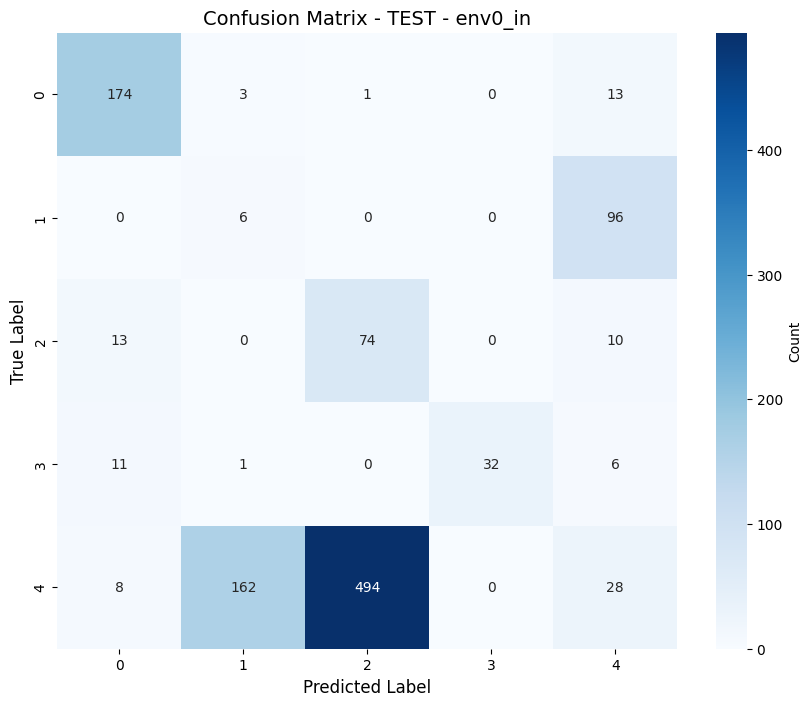


TRAIN - env1_in:
  Loss: 0.0005
  Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1: 1.0000
  Saved CSV to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env1_in.png


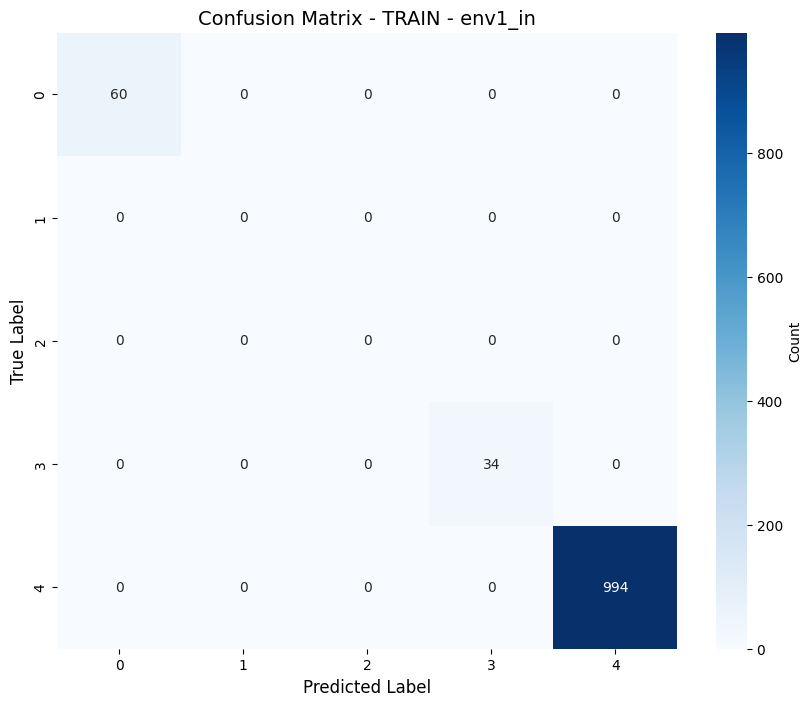


TRAIN - env2_in:
  Loss: 0.0016
  Accuracy: 0.7498, Precision: 0.7500, Recall: 0.7498, F1: 0.7499
  Saved CSV to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env2_in.png


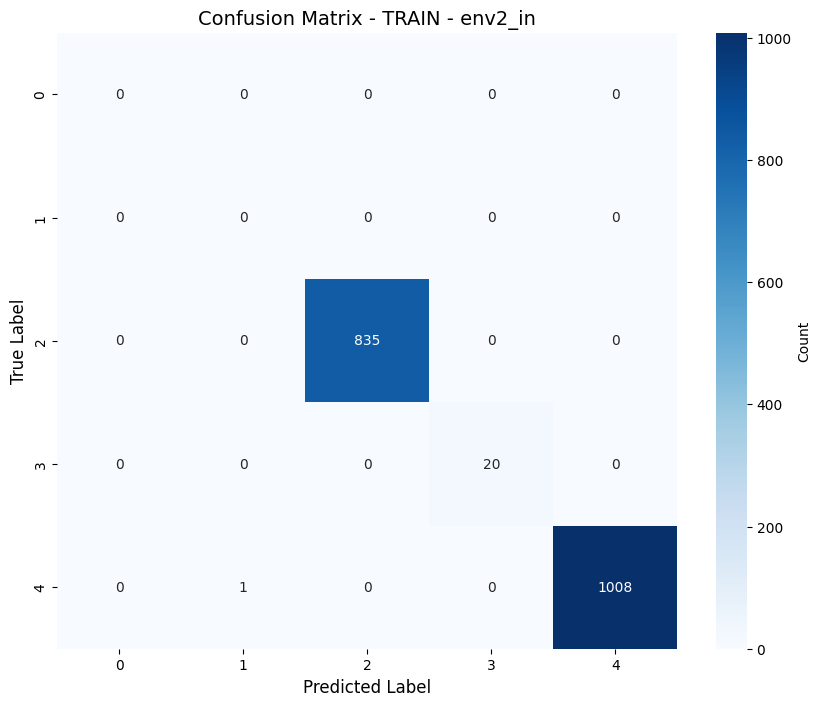


TRAIN - env3_in:
  Loss: 0.0004
  Accuracy: 0.9990, Precision: 0.9994, Recall: 0.9990, F1: 0.9992
  Saved CSV to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_TRAIN_env3_in.png


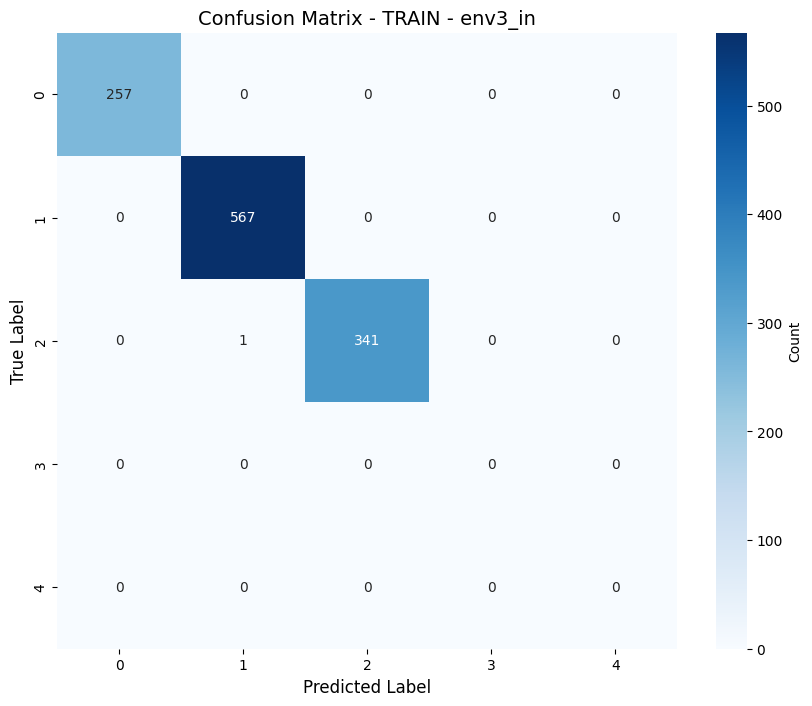


OTHER - env0_out:
  Loss: 5.2438
  Accuracy: 0.4499, Precision: 0.4017, Recall: 0.4499, F1: 0.3587
  Saved CSV to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_OTHER_env0_out.png


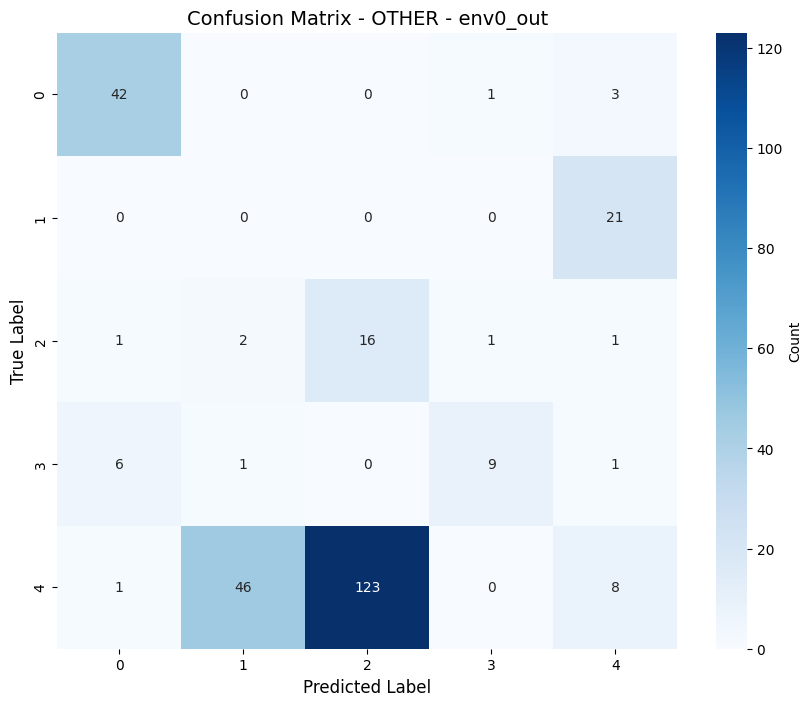


VAL - env1_out:
  Loss: 0.7866
  Accuracy: 0.3409, Precision: 0.3666, Recall: 0.3409, F1: 0.3527
  Saved CSV to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_VAL_env1_out.png


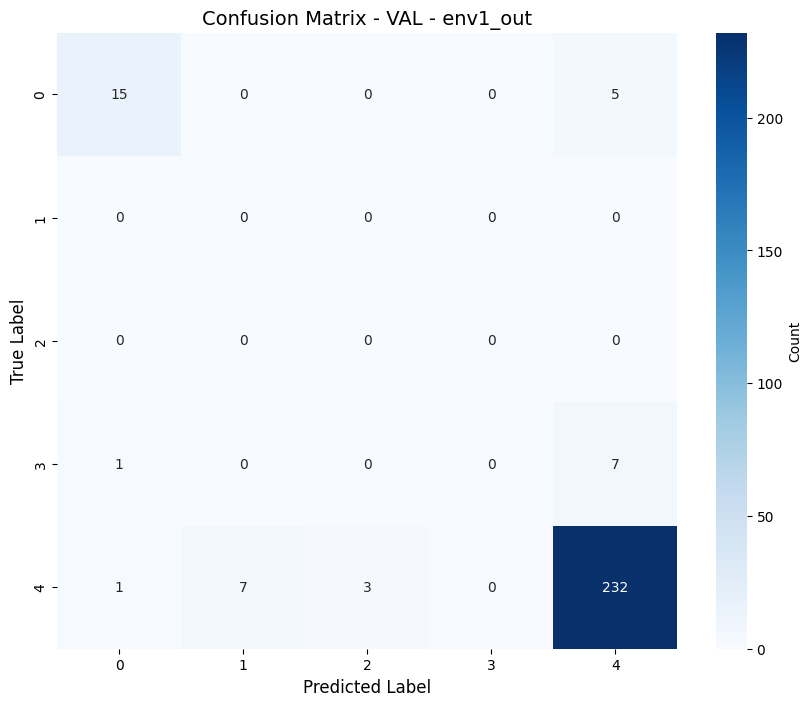


VAL - env2_out:
  Loss: 1.0466
  Accuracy: 0.3736, Precision: 0.4151, Recall: 0.3736, F1: 0.3877
  Saved CSV to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_VAL_env2_out.png


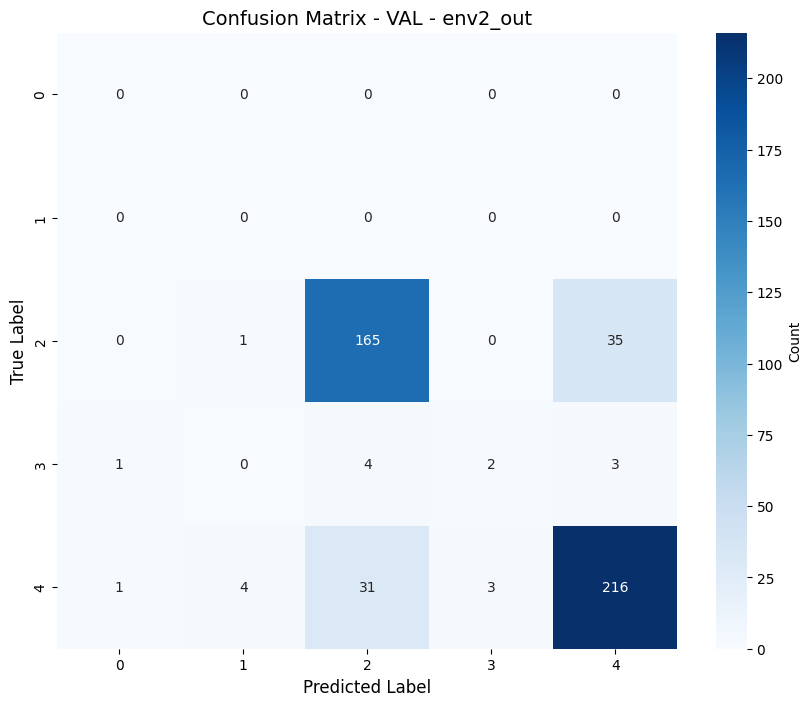


VAL - env3_out:
  Loss: 1.3620
  Accuracy: 0.4903, Precision: 0.5614, Recall: 0.4903, F1: 0.5233
  Saved CSV to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/confusion_matrix_VAL_env3_out.png


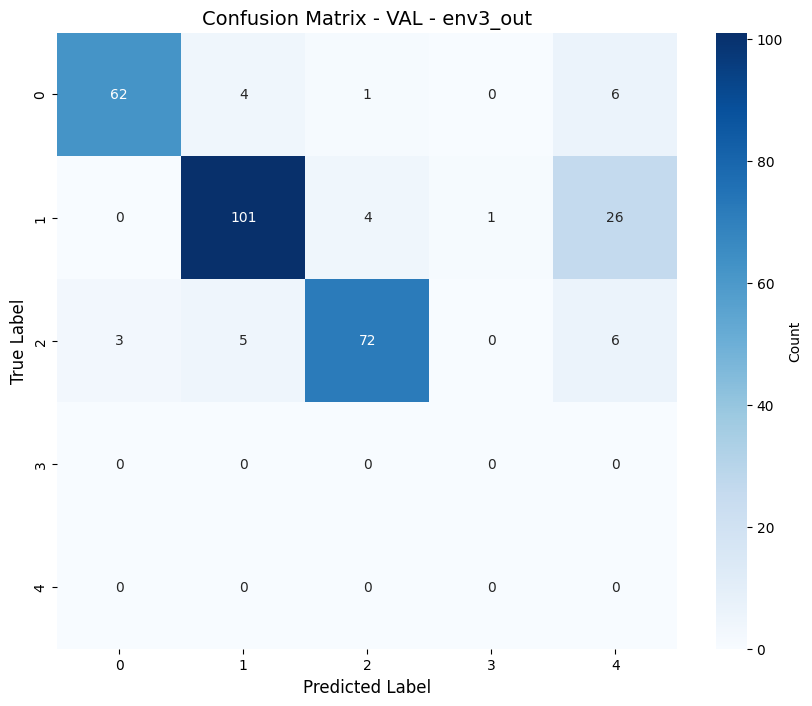


Training curves saved to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/training_curves_VLCS.png


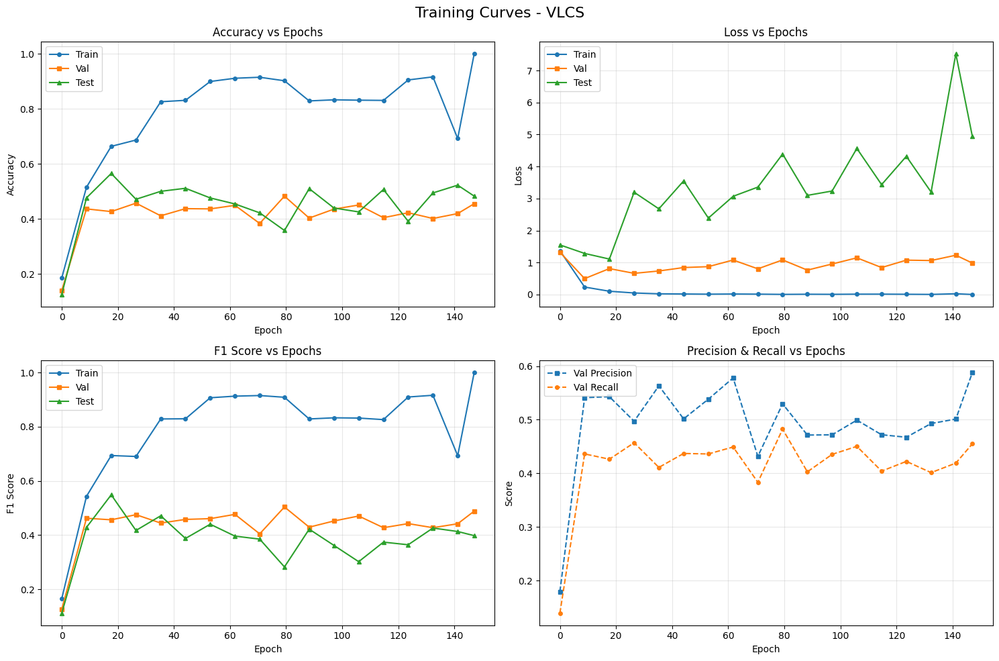

Epoch time plot saved to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs/epoch_times_VLCS.png


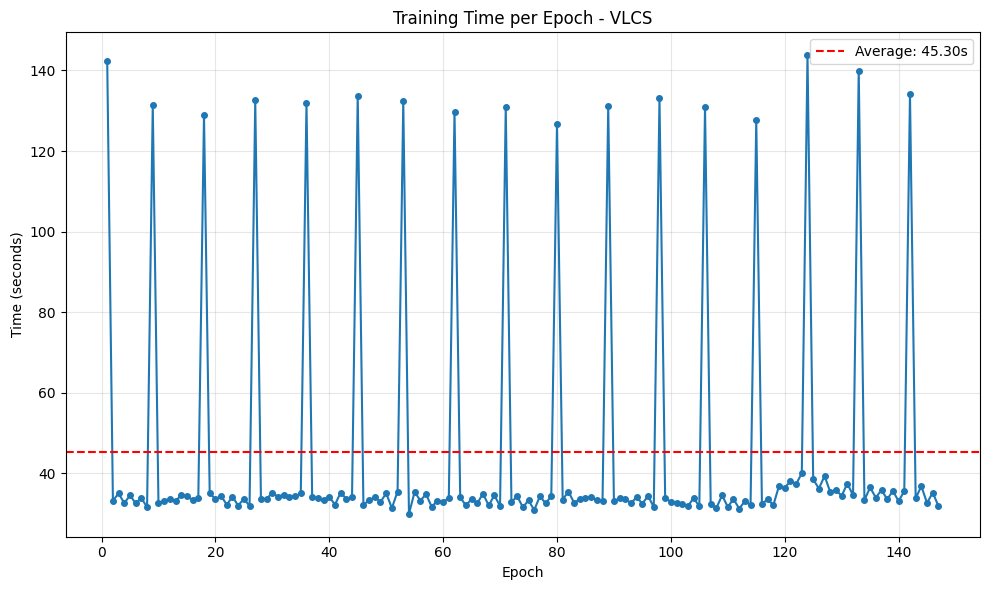


All results saved to: /kaggle/working/experiments/experiment_with_vlcs_SimpleDiffAug/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_VLCS.png
  - epoch_times_VLCS.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)


In [58]:
fit_simple(
    exp_dir=str(exp_dir),
    logger=logger,

    seed=config["seed"],
    trial_seed=config["trial_seed"],
    hparams_seed=config["hparams_seed"],

    algorithm_name=config["algo"],
    dataset_name="VLCS",
    data_dir="/kaggle/input/vlcsdataset",
    num_workers=config["num_workers"],
    test_envs=[config["test_set_id"]],
    overlap_type="high",

    holdout_fraction=config["holdout_fraction"],
    n_steps=config["n_epochs"],
    checkpoint_freq=config["checkpoint_freq"],

    #  ADD THIS
    model_checkpoint={
        "metric": "val/acc",
        "maximize": True
    },

    num_classes=config["num_classes"],
    auto_augment=config["auto_augment"],
    augment_search_epochs=config["augment_search_epochs"],
)



In [47]:
import os

print(os.listdir("/kaggle/input"))
print(os.listdir("/kaggle/input/vlcsdataset"))


['vlcsdataset', 'pacs-dataset', 'officehome']
['VLCS']
